<img src="https://raw.githubusercontent.com/AmsterdamUMC/AmsterdamUMCdb/master/img/logo_amds.png" alt="Logo" style="width: 128px;"/>

# AmsterdamUMCdb Scientific Paper

Manuscript submitted for publication. Copyright &copy; 2003-2020 Amsterdam UMC - Amsterdam Medical Data Science

## Imports

In [1]:
%matplotlib inline
import amsterdamumcdb
import psycopg2
import pandas as pd
import numpy as np
import re

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib as mpl

import io
from IPython.display import display, HTML, Markdown

## Display settings

In [2]:
#matplotlib settings for image size
#needs to be in a different cell from %matplotlib inline
plt.style.use('seaborn-darkgrid')
plt.rcParams["figure.dpi"] = 288
plt.rcParams["figure.figsize"] = [16, 12]
plt.rcParams["font.size"] = 12

pd.options.display.max_columns = None
pd.options.display.max_rows = None
pd.options.display.max_colwidth = 1000

## Connection settings

In [3]:
#Modify config.ini in the root folder of the repository to change the settings to connect to your postgreSQL database
import configparser
import os
config = configparser.ConfigParser()

if os.path.isfile('../config.ini'):
    config.read('../config.ini')
else:
    config.read('../config.SAMPLE.ini')

#Open a connection to the postgres database:
con = psycopg2.connect(database=config['psycopg2']['database'], 
                       user=config['psycopg2']['username'], password=config['psycopg2']['password'], 
                       host=config['psycopg2']['host'], port=config['psycopg2']['port'])
con.set_client_encoding('WIN1252') #Uses code page for Dutch accented characters.
con.set_session(autocommit=True)

cursor = con.cursor()
cursor.execute('SET SCHEMA \'amsterdamumcdb\''); #set search_path to amsterdamumcdb schema

# Table 1. Characteristics of patients and data in AmsterdamUMCdb

In [4]:
#since this is a small table, we can load all data
sql = """
SELECT * FROM admissions;
"""
admissions = pd.read_sql(sql,con)

In [5]:
#No. patients
no_patients_total = admissions.patientid.nunique()
no_patients_ICU = admissions[admissions['location'].str.contains('IC')].patientid.nunique()
no_patients_MCU = admissions[admissions['location'].str.contains('^MC$')].patientid.nunique()

#No. admissions
no_admissions_total = admissions.admissionid.nunique()
no_admissions_ICU = admissions[admissions['location'].str.contains('IC')].admissionid.nunique()
no_admissions_MCU = admissions[admissions['location'].str.contains('^MC$')].admissionid.nunique()

#Length of stay
los_total = admissions.lengthofstay.median()/24 
los_iqr1_total = admissions.lengthofstay.quantile(0.25)/24
los_iqr2_total = admissions.lengthofstay.quantile(0.75)/24

los_ICU = admissions[admissions['location'].str.contains('IC')].lengthofstay.median()/24
los_iqr1_ICU = admissions[admissions['location'].str.contains('IC')].lengthofstay.quantile(0.25)/24
los_iqr2_ICU = admissions[admissions['location'].str.contains('IC')].lengthofstay.quantile(0.75)/24

los_MCU = admissions[admissions['location'].str.contains('^MC$')].lengthofstay.median()/24
los_iqr1_MCU = admissions[admissions['location'].str.contains('^MC$')].lengthofstay.quantile(0.25)/24
los_iqr2_MCU = admissions[admissions['location'].str.contains('^MC$')].lengthofstay.quantile(0.75)/24

#Gender
## Male
male_total = len(admissions.loc[(admissions['gender'] == 'Man') & (admissions['admissioncount'] == 1)]['gender'])
male_pct_total = 100*male_total/no_patients_total

male_ICU = len(admissions.loc[(admissions['location'].str.contains('IC')) & (admissions['gender'] == 'Man') & (admissions['admissioncount'] == 1)]['gender'])
male_pct_ICU = 100*male_ICU/no_patients_ICU

male_MCU = len(admissions.loc[(admissions['location'].str.contains('^MC$')) & (admissions['gender'] == 'Man') & (admissions['admissioncount'] == 1)]['gender'])
male_pct_MCU = 100*male_MCU/no_patients_MCU


## Female
female_total = len(admissions.loc[(admissions['gender'] =='Vrouw') & (admissions['admissioncount'] == 1)]['gender'])
female_pct_total = 100*female_total/no_patients_total

female_ICU = len(admissions.loc[(admissions['location'].str.contains('IC')) & (admissions['gender'] =='Vrouw') & (admissions['admissioncount'] == 1)]['gender'])
female_pct_ICU = 100*female_ICU/no_patients_ICU

female_MCU = len(admissions.loc[(admissions['location'].str.contains('^MC$')) & (admissions['gender'] =='Vrouw') & (admissions['admissioncount'] == 1)]['gender'])
female_pct_MCU = 100*female_MCU/no_patients_MCU

## Unknown
gender_na_total = len(admissions.loc[(admissions['gender'] == '') & (admissions['admissioncount'] == 1)]['gender'])
gender_na_pct_total = 100*gender_na_total/no_patients_total

gender_na_ICU = len(admissions.loc[(admissions['location'].str.contains('IC')) & (admissions['gender'] == '') & (admissions['admissioncount'] == 1)]['gender'])
gender_na_pct_ICU = 100*gender_na_ICU/no_patients_ICU

gender_na_MCU = len(admissions.loc[(admissions['location'].str.contains('^MC$')) & (admissions['gender'] == '') & (admissions['admissioncount'] == 1)]['gender'])
gender_na_pct_MCU = 100*gender_na_MCU/no_patients_MCU

#age
## 18-39
age_18_39_total = admissions.loc[admissions['agegroup'] == '18-39']['patientid'].nunique()
age_18_39_pct_total = 100*age_18_39_total/no_patients_total

age_18_39_ICU = admissions.loc[(admissions['agegroup'] == '18-39') & 
                               (admissions['location'].str.contains('IC'))]['patientid'].nunique()
age_18_39_pct_ICU = 100*age_18_39_ICU/no_patients_ICU

age_18_39_MCU =  admissions.loc[(admissions['agegroup'] == '18-39') & 
                               (admissions['location'].str.contains('^MC$'))]['patientid'].nunique()
age_18_39_pct_MCU = 100*age_18_39_MCU/no_patients_MCU

## 40-49
age_40_49_total = admissions.loc[admissions['agegroup'] == '40-49']['patientid'].nunique()
age_40_49_pct_total = 100*age_40_49_total/no_patients_total

age_40_49_ICU = admissions.loc[(admissions['agegroup'] == '40-49') & 
                               (admissions['location'].str.contains('IC'))]['patientid'].nunique()
age_40_49_pct_ICU = 100*age_40_49_ICU/no_patients_ICU

age_40_49_MCU =  admissions.loc[(admissions['agegroup'] == '40-49') & 
                               (admissions['location'].str.contains('^MC$'))]['patientid'].nunique()
age_40_49_pct_MCU = 100*age_40_49_MCU/no_patients_MCU


## 50-59
age_50_59_total = admissions.loc[admissions['agegroup'] == '50-59']['patientid'].nunique()
age_50_59_pct_total = 100*age_50_59_total/no_patients_total

age_50_59_ICU = admissions.loc[(admissions['agegroup'] == '50-59') & 
                               (admissions['location'].str.contains('IC'))]['patientid'].nunique()
age_50_59_pct_ICU = 100*age_50_59_ICU/no_patients_ICU

age_50_59_MCU =  admissions.loc[(admissions['agegroup'] == '50-59') & 
                               (admissions['location'].str.contains('^MC$'))]['patientid'].nunique()
age_50_59_pct_MCU = 100*age_50_59_MCU/no_patients_MCU


## 60-69
age_60_69_total = admissions.loc[admissions['agegroup'] == '60-69']['patientid'].nunique()
age_60_69_pct_total = 100*age_60_69_total/no_patients_total

age_60_69_ICU = admissions.loc[(admissions['agegroup'] == '60-69') & 
                               (admissions['location'].str.contains('IC'))]['patientid'].nunique()
age_60_69_pct_ICU = 100*age_60_69_ICU/no_patients_ICU

age_60_69_MCU =  admissions.loc[(admissions['agegroup'] == '60-69') & 
                               (admissions['location'].str.contains('^MC$'))]['patientid'].nunique()
age_60_69_pct_MCU = 100*age_60_69_MCU/no_patients_MCU

## 70-79
age_70_79_total = admissions.loc[admissions['agegroup'] == '70-79']['patientid'].nunique()
age_70_79_pct_total = 100*age_70_79_total/no_patients_total

age_70_79_ICU = admissions.loc[(admissions['agegroup'] == '70-79') & 
                               (admissions['location'].str.contains('IC'))]['patientid'].nunique()
age_70_79_pct_ICU = 100*age_70_79_ICU/no_patients_ICU

age_70_79_MCU =  admissions.loc[(admissions['agegroup'] == '70-79') & 
                               (admissions['location'].str.contains('^MC$'))]['patientid'].nunique()
age_70_79_pct_MCU = 100*age_70_79_MCU/no_patients_MCU

## 80+
age_80_total = admissions.loc[admissions['agegroup'] == '80+']['patientid'].nunique()
age_80_pct_total = 100*age_80_total/no_patients_total

age_80_ICU = admissions.loc[(admissions['agegroup'] == '80+') & 
                               (admissions['location'].str.contains('IC'))]['patientid'].nunique()
age_80_pct_ICU = 100*age_80_ICU/no_patients_ICU

age_80_MCU =  admissions.loc[(admissions['agegroup'] == '80+') & 
                               (admissions['location'].str.contains('^MC$'))]['patientid'].nunique()
age_80_pct_MCU = 100*age_80_MCU/no_patients_MCU

admission_year_2003_total = admissions.loc[admissions['admissionyeargroup'] == '2003-2009']['patientid'].nunique()
admission_year_2003_pct_total = 100*admission_year_2003_total/no_patients_total

admission_year_2003_ICU = admissions.loc[(admissions['admissionyeargroup'] == '2003-2009') & 
                               (admissions['location'].str.contains('IC'))]['patientid'].nunique()
admission_year_2003_pct_ICU = 100*admission_year_2003_ICU/no_patients_ICU

admission_year_2003_MCU = admissions.loc[(admissions['admissionyeargroup'] == '2003-2009') & 
                               (admissions['location'].str.contains('^MC$'))]['patientid'].nunique()
admission_year_2003_pct_MCU = 100*admission_year_2003_MCU/no_patients_MCU

admission_year_2010_total = admissions.loc[admissions['admissionyeargroup'] == '2010-2016']['patientid'].nunique()
admission_year_2010_pct_total = 100*admission_year_2010_total/no_patients_total

admission_year_2010_ICU = admissions.loc[(admissions['admissionyeargroup'] == '2010-2016') & 
                               (admissions['location'].str.contains('IC'))]['patientid'].nunique()
admission_year_2010_pct_ICU = 100*admission_year_2010_ICU/no_patients_ICU

admission_year_2010_MCU = admissions.loc[(admissions['admissionyeargroup'] == '2010-2016') & 
                               (admissions['location'].str.contains('^MC$'))]['patientid'].nunique()
admission_year_2010_pct_MCU = 100*admission_year_2010_MCU/no_patients_MCU


## Admission types
- Surgical
- Medical
- Urgent
- Elective

## Admissions with reasons for admission
Creates a combined_diagnoses dataframe containing the admissions table joined with the diagnoses from the listitems table

In [6]:
sql = """
WITH diagnosis_groups AS (
SELECT admissionid,
        item, 
        value as diagnosis_group,
        CASE
            WHEN itemid = 13110 AND valueid BETWEEN 1 AND 3 THEN 1 --D_Hoofdgroep
            WHEN itemid = 16651 AND valueid BETWEEN 7 AND 9 THEN 1 --DMC_Hoofdgroep
            WHEN itemid = 16997 AND valueid BETWEEN 11 AND 20 THEN 1 --APACHE IV Groepen
            WHEN itemid = 18588 AND valueid BETWEEN 1 AND 7 THEN 1 --Apache II Hoofdgroep
            ELSE 0
        END AS surgical,
        ROW_NUMBER() OVER(PARTITION BY admissionid
        ORDER BY measuredat DESC) AS rownum
    FROM listitems
    WHERE itemid IN (
        --MAIN GROUP - LEVEL 0
        13110, --D_Hoofdgroep
        16651, --DMC_Hoofdgroep, Medium Care
        
        18588, --Apache II Hoofdgroep
        16997 --APACHE IV Groepen        
    )
),diagnosis_subgroups AS (
SELECT admissionid,
        item, 
        value as diagnosis_subgroup,
        ROW_NUMBER() OVER(PARTITION BY admissionid
        ORDER BY measuredat DESC) AS rownum
    FROM listitems
    WHERE itemid IN (
        --SUB GROUP - LEVEL 1
        13111, --D_Subgroep_Thoraxchirurgie
        16669, --DMC_Subgroep_Thoraxchirurgie
        13112, --D_Subgroep_Algemene chirurgie
        16665, --DMC_Subgroep_Algemene chirurgie
        13113, --D_Subgroep_Neurochirurgie
        16667, --DMC_Subgroep_Neurochirurgie
        13114, --D_Subgroep_Neurologie
        16668, --DMC_Subgroep_Neurologie
        13115, --D_Subgroep_Interne geneeskunde
        16666 --DMC_Subgroep_Interne geneeskunde
    )
), diagnoses AS (
SELECT admissionid,
        item, 
        value as diagnosis,
        ROW_NUMBER() OVER(PARTITION BY admissionid
        ORDER BY measuredat DESC) AS rownum
FROM listitems
WHERE itemid IN (
        -- Diagnosis - LEVEL 2
        --SURGICAL
        13116, --D_Thoraxchirurgie_CABG en Klepchirurgie
        16671, --DMC_Thoraxchirurgie_CABG en Klepchirurgie
        13117, --D_Thoraxchirurgie_Cardio anders
        16672, --DMC_Thoraxchirurgie_Cardio anders
        13118, --D_Thoraxchirurgie_Aorta chirurgie
        16670, --DMC_Thoraxchirurgie_Aorta chirurgie
        13119, --D_Thoraxchirurgie_Pulmonale chirurgie
        16673, --DMC_Thoraxchirurgie_Pulmonale chirurgie
        
        13141, --D_Algemene chirurgie_Algemeen   
        16642, --DMC_Algemene chirurgie_Algemeen
        13121, --D_Algemene chirurgie_Buikchirurgie
        16643, --DMC_Algemene chirurgie_Buikchirurgie
        13123, --D_Algemene chirurgie_Endocrinologische chirurgie
        16644, --DMC_Algemene chirurgie_Endocrinologische chirurgie
        13145, --D_Algemene chirurgie_KNO/Overige
        16645, --DMC_Algemene chirurgie_KNO/Overige
        13125, --D_Algemene chirurgie_Orthopedische chirurgie
        16646, --DMC_Algemene chirurgie_Orthopedische chirurgie
        13122, --D_Algemene chirurgie_Transplantatie chirurgie
        16647, --DMC_Algemene chirurgie_Transplantatie chirurgie
        13124, --D_Algemene chirurgie_Trauma
        16648, --DMC_Algemene chirurgie_Trauma
        13126, --D_Algemene chirurgie_Urogenitaal
        16649, --DMC_Algemene chirurgie_Urogenitaal
        13120, --D_Algemene chirurgie_Vaatchirurgie
        16650, --DMC_Algemene chirurgie_Vaatchirurgie

        13128, --D_Neurochirurgie _Vasculair chirurgisch
        16661, --DMC_Neurochirurgie _Vasculair chirurgisch
        13129, --D_Neurochirurgie _Tumor chirurgie
        16660, --DMC_Neurochirurgie _Tumor chirurgie
        13130, --D_Neurochirurgie_Overige
        16662, --DMC_Neurochirurgie_Overige
        
        18596, --Apache II Operatief  Gastr-intenstinaal
        18597, --Apache II Operatief Cardiovasculair
        18598, --Apache II Operatief Hematologisch
        18599, --Apache II Operatief Metabolisme
        18600, --Apache II Operatief Neurologisch
        18601, --Apache II Operatief Renaal
        18602, --Apache II Operatief Respiratoir
        
        17008, --APACHEIV Post-operative cardiovascular
        17009, --APACHEIV Post-operative gastro-intestinal
        17010, --APACHEIV Post-operative genitourinary
        17011, --APACHEIV Post-operative hematology
        17012, --APACHEIV Post-operative metabolic
        17013, --APACHEIV Post-operative musculoskeletal /skin
        17014, --APACHEIV Post-operative neurologic
        17015, --APACHEIV Post-operative respiratory
        17016, --APACHEIV Post-operative transplant
        17017, --APACHEIV Post-operative trauma

        --MEDICAL
        13133, --D_Interne Geneeskunde_Cardiovasculair
        16653, --DMC_Interne Geneeskunde_Cardiovasculair
        13134, --D_Interne Geneeskunde_Pulmonaal
        16658, --DMC_Interne Geneeskunde_Pulmonaal
        13135, --D_Interne Geneeskunde_Abdominaal
        16652, --DMC_Interne Geneeskunde_Abdominaal
        13136, --D_Interne Geneeskunde_Infectieziekten
        16655, --DMC_Interne Geneeskunde_Infectieziekten
        13137, --D_Interne Geneeskunde_Metabool
        16656, --DMC_Interne Geneeskunde_Metabool
        13138, --D_Interne Geneeskunde_Renaal
        16659, --DMC_Interne Geneeskunde_Renaal
        13139, --D_Interne Geneeskunde_Hematologisch
        16654, --DMC_Interne Geneeskunde_Hematologisch
        13140, --D_Interne Geneeskunde_Overige
        16657, --DMC_Interne Geneeskunde_Overige

        13131, --D_Neurologie_Vasculair neurologisch
        16664, --DMC_Neurologie_Vasculair neurologisch
        13132, --D_Neurologie_Overige
        16663, --DMC_Neurologie_Overige 
        13127, --D_KNO/Overige
        
        18589, --Apache II Non-Operatief Cardiovasculair
        18590, --Apache II Non-Operatief Gastro-intestinaal
        18591, --Apache II Non-Operatief Hematologisch
        18592, --Apache II Non-Operatief Metabolisme
        18593, --Apache II Non-Operatief Neurologisch
        18594, --Apache II Non-Operatief Renaal
        18595, --Apache II Non-Operatief Respiratoir
        
        16998, --APACHE IV Non-operative cardiovascular
        16999, --APACHE IV Non-operative Gastro-intestinal
        17000, --APACHE IV Non-operative genitourinary
        17001, --APACHEIV  Non-operative haematological
        17002, --APACHEIV  Non-operative metabolic
        17003, --APACHEIV Non-operative musculo-skeletal
        17004, --APACHEIV Non-operative neurologic
        17005, --APACHEIV Non-operative respiratory
        17006, --APACHEIV Non-operative transplant
        17007 --APACHEIV Non-operative trauma      
        )
)
SELECT admissions.*, diagnosis, diagnosis_subgroup, 
    diagnosis_group, surgical
FROM admissions
LEFT JOIN diagnoses on admissions.admissionid = diagnoses.admissionid
LEFT JOIN diagnosis_subgroups on admissions.admissionid = diagnosis_subgroups.admissionid
LEFT JOIN diagnosis_groups on admissions.admissionid = diagnosis_groups.admissionid
WHERE (diagnoses.rownum = 1 OR diagnoses.rownum IS NULL) AND 
    (diagnosis_subgroups.rownum = 1 OR diagnosis_subgroups.rownum IS NULL) AND
    (diagnosis_groups.rownum = 1 OR diagnosis_groups.rownum IS NULL) --only last updated record
;
"""
combined_diagnoses = pd.read_sql(sql,con)
combined_diagnoses.head()

,patientid,admissionid,admissioncount,location,urgency,origin,admittedat,admissionyeargroup,dischargedat,lengthofstay,destination,gender,agegroup,dateofdeath,weightgroup,weightsource,heightgroup,heightsource,specialty,diagnosis,diagnosis_subgroup,diagnosis_group,surgical
0,0,0,1,IC,0,None,0,2003-2009,148800000,42,16,Vrouw,80+,NaN,60-69,Anamnestisch,160-169,Anamnestisch,Cardiochirurgie,CABG,CABG en Klepchirurgie,Thoraxchirurgie,1.0
1,1,1,1,IC,0,None,0,2010-2016,96120000,26,15,Man,60-69,NaN,70-79,Anamnestisch,170-179,Anamnestisch,Cardiochirurgie,Bentall,Aorta chirurgie,Thoraxchirurgie,1.0
2,2,2,1,IC,1,Eerste Hulp afdeling zelfde ziekenhuis,0,2010-2016,84240000,23,15,Man,60-69,NaN,90-99,Anamnestisch,180-189,Anamnestisch,Cardiochirurgie,CABG with aortic valve replacement,CABG en Klepchirurgie,Post-operative cardiovascular,1.0
3,3,3,1,IC,0,None,0,2003-2009,84900000,23,14,Man,50-59,NaN,90-99,None,180-189,Gemeten,Cardiochirurgie,None,None,None,NaN
4,4,4,1,IC&MC,0,Verpleegafdeling zelfde ziekenhuis,0,2010-2016,180900000,50,19,Man,70-79,NaN,70-79,Anamnestisch,170-179,Anamnestisch,Cardiochirurgie,"CABG alone, coronary artery bypass grafting",CABG en Klepchirurgie,Post-operative cardiovascular,1.0


In [7]:
#surgical
surgical_total = len(combined_diagnoses[combined_diagnoses['surgical'] == 1])
surgical_pct_total = 100*surgical_total/no_admissions_total

surgical_ICU = len(combined_diagnoses[(combined_diagnoses['surgical'] == 1)  & combined_diagnoses['location'].str.contains('IC')])
surgical_pct_ICU = 100*surgical_ICU/no_admissions_ICU

surgical_MCU = len(combined_diagnoses[(combined_diagnoses['surgical'] == 1)  & combined_diagnoses['location'].str.contains('^MC$')])
surgical_pct_MCU = 100*surgical_MCU/no_admissions_MCU


#medical
medical_total = len(combined_diagnoses[combined_diagnoses['surgical'] == 0])
medical_pct_total = 100*medical_total/no_admissions_total

medical_ICU = len(combined_diagnoses[(combined_diagnoses['surgical'] == 0)  & combined_diagnoses['location'].str.contains('IC')])
medical_pct_ICU = 100*medical_ICU/no_admissions_ICU

medical_MCU = len(combined_diagnoses[(combined_diagnoses['surgical'] == 0)  & combined_diagnoses['location'].str.contains('^MC$')])
medical_pct_MCU = 100*medical_MCU/no_admissions_MCU

#surgical/medical unknown
medical_surgical_na_total = len(combined_diagnoses[pd.isnull(combined_diagnoses['surgical'])])
medical_surgical_na_pct_total = 100*medical_surgical_na_total/no_admissions_total

medical_surgical_na_ICU = len(combined_diagnoses[pd.isnull(combined_diagnoses['surgical']) & combined_diagnoses['location'].str.contains('IC')])
medical_surgical_na_pct_ICU = 100*medical_surgical_na_ICU/no_admissions_ICU

medical_surgical_na_MCU = len(combined_diagnoses[pd.isnull(combined_diagnoses['surgical']) & combined_diagnoses['location'].str.contains('^MC$')])
medical_surgical_na_pct_MCU = 100*medical_surgical_na_MCU/no_admissions_MCU

#urgency
urgency_total = len(combined_diagnoses[combined_diagnoses['urgency'] == '1']) #apparently the postgresql bit become an object
urgency_pct_total = 100*urgency_total/no_admissions_total

urgency_ICU = len(combined_diagnoses[(combined_diagnoses['urgency'] == '1')  & combined_diagnoses['location'].str.contains('IC')])
urgency_pct_ICU = 100*urgency_ICU/no_admissions_ICU

urgency_MCU = len(combined_diagnoses[(combined_diagnoses['urgency'] == '1')  & combined_diagnoses['location'].str.contains('^MC$')])
urgency_pct_MCU = 100*urgency_MCU/no_admissions_MCU

urgency_pct_MCU

26.716101694915253

## Reason for admission based on pre-APACHE/APACHE II or IV diagnosis

## Admission diagnoses

In [8]:
combined_diagnoses.groupby(['diagnosis','diagnosis_subgroup','diagnosis_group'])[['diagnosis', 'diagnosis_subgroup','diagnosis_group']].size().to_frame('number of admissions').sort_values('number of admissions', ascending=False).reset_index()

,diagnosis,diagnosis_subgroup,diagnosis_group,number of admissions
0,CABG,CABG en Klepchirurgie,Thoraxchirurgie,1538
1,Na reanimatie,Cardiovasculair,Interne geneeskunde,524
2,AVR,CABG en Klepchirurgie,Thoraxchirurgie,509
3,Gecombineerde hartchirurgie,CABG en Klepchirurgie,Thoraxchirurgie,413
4,"CABG alone, coronary artery bypass grafting",CABG en Klepchirurgie,Post-operative cardiovascular,392
5,Respiratoire insufficiëntie,Pulmonaal,Interne geneeskunde,380
6,"CABG alone, coronary artery bypass grafting",CABG en Klepchirurgie,Operatief Cardiovasculair,323
7,Chron. cardiovasculaire ziekte,CABG en Klepchirurgie,Post-operative cardiovascular,318
8,CABG (Off pump),CABG en Klepchirurgie,Thoraxchirurgie,272
9,Vaatchirurgie abdominaal,Vaatchirurgie,Algemene chirurgie,231


### Cardiothoracic surgery

In [9]:
combined_diagnoses[(combined_diagnoses['diagnosis'].str.contains('CABG|valve|aorta|mitral|tricusp|MVR|AVR', na=False, flags=re.IGNORECASE) | combined_diagnoses['diagnosis_subgroup'].str.contains('CABG en Klepchirurgie', na=False, flags=re.IGNORECASE)) & ~(combined_diagnoses['diagnosis_subgroup'].str.contains('Vaatchirurgie', na=False, flags=re.IGNORECASE))][['diagnosis','diagnosis_subgroup','diagnosis_group']].drop_duplicates()

,diagnosis,diagnosis_subgroup,diagnosis_group
0,CABG,CABG en Klepchirurgie,Thoraxchirurgie
2,CABG with aortic valve replacement,CABG en Klepchirurgie,Post-operative cardiovascular
4,"CABG alone, coronary artery bypass grafting",CABG en Klepchirurgie,Post-operative cardiovascular
8,Gecombineerde hartchirurgie,CABG en Klepchirurgie,Thoraxchirurgie
22,"CABG alone, coronary artery bypass grafting",CABG en Klepchirurgie,Operatief Cardiovasculair
30,MVP,CABG en Klepchirurgie,Thoraxchirurgie
53,MVR,CABG en Klepchirurgie,Thoraxchirurgie
57,AVR,CABG en Klepchirurgie,Thoraxchirurgie
106,Chron. cardiovasculaire ziekte,CABG en Klepchirurgie,Post-operative cardiovascular
126,Mitral valve replacement,CABG en Klepchirurgie,Operatief Cardiovasculair


In [10]:
len(combined_diagnoses[(combined_diagnoses['diagnosis'].str.contains('CABG|valve|aorta|mitral|tricusp|MVR|AVR', na=False, flags=re.IGNORECASE) | combined_diagnoses['diagnosis_subgroup'].str.contains('CABG en Klepchirurgie', na=False, flags=re.IGNORECASE)) & ~(combined_diagnoses['diagnosis_subgroup'].str.contains('Vaatchirurgie', na=False, flags=re.IGNORECASE))])

5328

### Neurosurgery

In [11]:
combined_diagnoses[combined_diagnoses['diagnosis_group'].str.contains('(?<!non-)(Operatief Neurologisch|Neurochirurgie)', na=False, flags=re.IGNORECASE)][['diagnosis','diagnosis_subgroup','diagnosis_group']].drop_duplicates()

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\strings.py:1843: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,diagnosis,diagnosis_subgroup,diagnosis_group
6,Overige neurologie/neurochirurgie,Overige,Neurochirurgie
39,Hoofd trauma,Overige,Operatief Neurologisch
42,Neurochirurgisch Trauma,Overige,Neurochirurgie
45,Meningioom infra tentorieel,Tumor chirurgie,Neurochirurgie
60,Diagnose anders,Tumor chirurgie,Neurochirurgie
101,Aneurysma chir. bij SAB,Vasculair chirurgisch,Neurochirurgie
107,Craniotomie voor neoplasma,Tumor chirurgie,Operatief Neurologisch
127,Meningioom supra tentorieel,Tumor chirurgie,Neurochirurgie
229,Diagnose anders,Vasculair chirurgisch,Neurochirurgie
285,Intracerebraal haematoom,Vasculair chirurgisch,Neurochirurgie


In [12]:
len(combined_diagnoses[combined_diagnoses['diagnosis_group'].str.contains('(?<!non-)(Operatief Neurologisch|Neurochirurgie)', na=False, flags=re.IGNORECASE)])

1456

### Gastro-intestinal surgery

In [13]:
combined_diagnoses[combined_diagnoses['diagnosis_subgroup'].str.contains('Buikchirurgie', na=False, flags=re.IGNORECASE) & ~(combined_diagnoses['diagnosis'].str.contains('sepsis|infect', na=False, flags=re.IGNORECASE))][['diagnosis','diagnosis_subgroup','diagnosis_group']].drop_duplicates()

,diagnosis,diagnosis_subgroup,diagnosis_group
17,Whipple-surgery for pancreatic cancer,Buikchirurgie,Post-operative gastro-intestinal
46,"Cancer-colon/rectal, surgery for (including abdominoperineal resections)",Buikchirurgie,Post-operative gastro-intestinal
47,"GI Perforation/rupture, surgery for",Buikchirurgie,Operatief Gastro-Intestinaal
48,"Cancer-other GI tract, surgery for (i.e. hepatoma, gallbladder etc.)",Buikchirurgie,Operatief Gastro-Intestinaal
56,Gastro-intestinaal voor neoplasma,Buikchirurgie,Algemene chirurgie
64,Oesophagus/maag chirurgie,Buikchirurgie,Algemene chirurgie
76,"Complications of previous GI surgery; surgery for (anastomotic leak, bleeding,",Buikchirurgie,Post-operative gastro-intestinal
77,Dunne/dikkedarm chirurgie (perforatie of obstructie),Buikchirurgie,Algemene chirurgie
128,"Overdose, street drugs (opiates, cocaine, amphetamine)",Buikchirurgie,Non-operative neurologic
135,Gastro-intestinale perforatie of obstructie,Buikchirurgie,Post-operative gastro-intestinal


In [14]:
len(combined_diagnoses[combined_diagnoses['diagnosis_subgroup'].str.contains('Buikchirurgie', na=False, flags=re.IGNORECASE) & ~(combined_diagnoses['diagnosis'].str.contains('sepsis|infect', na=False, flags=re.IGNORECASE))])

1252

### Cardiac arrest

In [15]:
combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('reanimatie|arrest', na=False)][['diagnosis','diagnosis_subgroup','diagnosis_group']].drop_duplicates()

,diagnosis,diagnosis_subgroup,diagnosis_group
15,Cardiac arrest (with or without respiratory arrest;,Cardiovasculair,Non-operative cardiovascular
18,Na cardiac arrest,Cardiovasculair,Non-operatief Cardiovasculair
19,Na reanimatie,Cardiovasculair,Interne geneeskunde
67,Na cardiac arrest,Cardiovasculair,Non-operative cardiovascular
112,Na cardiac arrest,Vaatchirurgie,Non-operative cardiovascular
511,Cardiac arrest (with or without respiratory arrest;,Cardiovasculair,Non-operatief Cardiovasculair
737,Na cardiac arrest,Cardiovasculair,Interne geneeskunde
860,Cardiac arrest (with or without respiratory arrest;,Cardiovasculair,Interne geneeskunde
868,Na cardiac arrest,Pulmonaal,Non-operative cardiovascular
1858,Cardiac arrest (with or without respiratory arrest;,Hematologisch,Non-operative cardiovascular


In [16]:
len(combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('reanimatie|arrest', na=False)])

973

### Vascular surgery

In [17]:
combined_diagnoses[combined_diagnoses['diagnosis_subgroup'].str.contains('Vaatchirurgie', na=False, flags=re.IGNORECASE)][['diagnosis','diagnosis_subgroup','diagnosis_group']].drop_duplicates()

,diagnosis,diagnosis_subgroup,diagnosis_group
14,Vaatchirurgie perifeer,Vaatchirurgie,Algemene chirurgie
33,"Vascular surgery, other",Vaatchirurgie,Post-operative cardiovascular
34,Perifeer vasculair,Vaatchirurgie,Post-operative cardiovascular
41,Hypertensie,Vaatchirurgie,Non-operative cardiovascular
65,Vaatchirurgie abdominaal,Vaatchirurgie,Algemene chirurgie
112,Na cardiac arrest,Vaatchirurgie,Non-operative cardiovascular
136,EVAR,Vaatchirurgie,Algemene chirurgie
159,Cardiovasculair,Vaatchirurgie,Post-operative cardiovascular
163,Thoraco-abdominale aorta vervanging,Vaatchirurgie,Algemene chirurgie
207,"Endarterectomy, carotid",Vaatchirurgie,Post-operative cardiovascular


In [18]:
len(combined_diagnoses[combined_diagnoses['diagnosis_subgroup'].str.contains('Vaatchirurgie', na=False, flags=re.IGNORECASE)])

920

### Trauma

In [19]:
combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('trauma', na=False, flags=re.IGNORECASE) & ~(combined_diagnoses['diagnosis_group'].str.contains('(?<!non-)(Operatief Neurologisch|Neurochirurgie)', na=False, flags=re.IGNORECASE))][['diagnosis','diagnosis_subgroup','diagnosis_group']].drop_duplicates()

,diagnosis,diagnosis_subgroup,diagnosis_group
10,Thoraxtrauma (niet operatief),Traumatologie,Algemene chirurgie
97,Hoofdtrauma,Traumatologie,Non-operatief Neurologisch
114,Buiktrauma (operatief),Traumatologie,Algemene chirurgie
146,Head/multiple trauma,Traumatologie,Non-operative trauma
150,"Abdomen/extremity trauma, surgery for",Traumatologie,Post-operative trauma
178,Multi trauma (niet operatief),Traumatologie,Algemene chirurgie
192,Hoofdtrauma,Traumatologie,Algemene chirurgie
197,Head (CNS) only trauma,Overige,Neurologie
201,Trauma wervelfr/dwarslaesie (niet operatief),Traumatologie,Algemene chirurgie
222,Spinal/multiple trauma,Traumatologie,Non-operative trauma


In [20]:
len(combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('trauma', na=False, flags=re.IGNORECASE) & ~(combined_diagnoses['diagnosis_group'].str.contains('(?<!non-)(Operatief Neurologisch|Neurochirurgie)', na=False, flags=re.IGNORECASE))])

902

### Sepsis

In [21]:
combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('sepsis|infect', na=False, flags=re.IGNORECASE)][['diagnosis','diagnosis_subgroup','diagnosis_group']].drop_duplicates()

,diagnosis,diagnosis_subgroup,diagnosis_group
37,"Sepsis, other",Infectieziekten,Non-operative cardiovascular
58,"Sepsis, GI",Buikchirurgie,Operatief Cardiovasculair
91,Infectieuze aandoening overig,Infectieziekten,Interne geneeskunde
108,Urosepsis,Infectieziekten,Interne geneeskunde
140,Respiratoire infectie,Buikchirurgie,Non-operatief Respiratoir
186,"Sepsis, other",Traumatologie,Operatief Cardiovasculair
294,Sepsis,Cardiovasculair,Interne geneeskunde
351,"Sepsis, renal/UTI (including bladder)",Infectieziekten,Non-operatief Cardiovasculair
409,"Sepsis, other",Renaal,Non-operatief Cardiovasculair
437,Sepsis,Algemeen,Algemene chirurgie


In [22]:
len(combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('sepsis|infect', na=False, flags=re.IGNORECASE)])

598

### Respiratory failure

In [23]:
combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('^(pneumonie|resp.*insuff)(?<!surgery)(?<!arrest)', na=False, flags=re.IGNORECASE)][['diagnosis','diagnosis_subgroup','diagnosis_group']].drop_duplicates()

,diagnosis,diagnosis_subgroup,diagnosis_group
99,Pneumonie,Pulmonaal,Interne geneeskunde
100,Respiratoire insufficientie na ok,Algemeen,Algemene chirurgie
165,Respiratoire insufficiëntie,Pulmonaal,Interne geneeskunde
502,Respiratoire insufficiëntie,Pulmonaal,Non-operative respiratory
777,Respiratoire insufficientie na OK,Traumatologie,Operatief Respiratoir
1793,Respiratoire insufficientie na OK,Pulmonaal,Operatief Respiratoir
2108,Respiratoire insufficientie na OK,Algemeen,Post-operative respiratory
2126,Respiratoire insufficientie na OK,Traumatologie,Post-operative trauma
2618,Respiratoire insufficientie na OK,Endocrinologische chirurgie,Post-operative metabolic
2740,Respiratoire insufficientie na OK,Urogenitaal,Operatief Respiratoir


In [24]:
len(combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('^(pneumonie|resp.*insuff)(?<!surgery)(?<!arrest)', na=False, flags=re.IGNORECASE)])

631

In [25]:
len(combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('transplant', na=False, flags=re.IGNORECASE)])

223

In [26]:
combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('intox|overdos|suicid', na=False, flags=re.IGNORECASE)][['diagnosis','diagnosis_subgroup','diagnosis_group']].drop_duplicates()
len(combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('intox|overdos|suicid', na=False, flags=re.IGNORECASE)])

227

In [27]:
#reason for admission

## cardiac surgery
reason_car_surg_total = len(combined_diagnoses[(combined_diagnoses['diagnosis'].str.contains('CABG|valve|aorta|mitral|tricusp|MVR|AVR', na=False, flags=re.IGNORECASE) | combined_diagnoses['diagnosis_subgroup'].str.contains('CABG en Klepchirurgie', na=False, flags=re.IGNORECASE)) & ~(combined_diagnoses['diagnosis_subgroup'].str.contains('Vaatchirurgie', na=False, flags=re.IGNORECASE))])
reason_car_surg_pct_total = 100*reason_car_surg_total/no_admissions_total
reason_car_surg_ICU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('IC') & (combined_diagnoses['diagnosis'].str.contains('CABG|valve|aorta|mitral|tricusp|MVR|AVR', na=False, flags=re.IGNORECASE) | combined_diagnoses['diagnosis_subgroup'].str.contains('CABG en Klepchirurgie', na=False, flags=re.IGNORECASE)) & ~(combined_diagnoses['diagnosis_subgroup'].str.contains('Vaatchirurgie', na=False, flags=re.IGNORECASE))])
reason_car_surg_pct_ICU = 100*reason_car_surg_ICU/no_admissions_ICU
reason_car_surg_MCU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('^MC$') & (combined_diagnoses['diagnosis'].str.contains('CABG|valve|aorta|mitral|trMCUsp|MVR|AVR', na=False, flags=re.IGNORECASE) | combined_diagnoses['diagnosis_subgroup'].str.contains('CABG en Klepchirurgie', na=False, flags=re.IGNORECASE)) & ~(combined_diagnoses['diagnosis_subgroup'].str.contains('Vaatchirurgie', na=False, flags=re.IGNORECASE))])
reason_car_surg_pct_MCU = 100*reason_car_surg_MCU/no_admissions_MCU

## neurosurgery
reason_neu_surg_total = len(combined_diagnoses[combined_diagnoses['diagnosis_group'].str.contains('(?<!non-)(Operatief Neurologisch|Neurochirurgie)', na=False, flags=re.IGNORECASE)])
reason_neu_surg_pct_total =  100*reason_neu_surg_total/no_admissions_total
reason_neu_surg_ICU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('IC') & combined_diagnoses['diagnosis_group'].str.contains('(?<!non-)(Operatief Neurologisch|Neurochirurgie)', na=False, flags=re.IGNORECASE)])
reason_neu_surg_pct_ICU =  100*reason_neu_surg_ICU/no_admissions_ICU
reason_neu_surg_MCU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('^MC$') & combined_diagnoses['diagnosis_group'].str.contains('(?<!non-)(Operatief Neurologisch|Neurochirurgie)', na=False, flags=re.IGNORECASE)])
reason_neu_surg_pct_MCU =  100*reason_neu_surg_MCU/no_admissions_MCU

## gastro-intestinal surgery
reason_gi_surg_total = len(combined_diagnoses[combined_diagnoses['diagnosis_subgroup'].str.contains('Buikchirurgie', na=False, flags=re.IGNORECASE) & ~(combined_diagnoses['diagnosis'].str.contains('sepsis|infect', na=False, flags=re.IGNORECASE))])
reason_gi_surg_pct_total = 100*reason_gi_surg_total/no_admissions_total
reason_gi_surg_ICU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('IC') & combined_diagnoses['diagnosis_subgroup'].str.contains('Buikchirurgie', na=False, flags=re.IGNORECASE) & ~(combined_diagnoses['diagnosis'].str.contains('sepsis|infect', na=False, flags=re.IGNORECASE))])
reason_gi_surg_pct_ICU = 100*reason_gi_surg_ICU/no_admissions_ICU
reason_gi_surg_MCU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('^MC$') & combined_diagnoses['diagnosis_subgroup'].str.contains('Buikchirurgie', na=False, flags=re.IGNORECASE) & ~(combined_diagnoses['diagnosis'].str.contains('sepsis|infect', na=False, flags=re.IGNORECASE))])
reason_gi_surg_pct_MCU = 100*reason_gi_surg_MCU/no_admissions_MCU

## cardiac arrest
reason_car_arrest_total = len(combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('reanimatie|arrest', na=False)])
reason_car_arrest_pct_total = 100*reason_car_arrest_total/no_admissions_total
reason_car_arrest_ICU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('IC') & combined_diagnoses['diagnosis'].str.contains('reanimatie|arrest', na=False)])
reason_car_arrest_pct_ICU = 100*reason_car_arrest_ICU/no_admissions_ICU
reason_car_arrest_MCU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('^MC$') & combined_diagnoses['diagnosis'].str.contains('reanimatie|arrest', na=False)])
reason_car_arrest_pct_MCU = 100*reason_car_arrest_MCU/no_admissions_MCU

## vascular surgery
reason_vasc_surg_total = len(combined_diagnoses[combined_diagnoses['diagnosis_subgroup'].str.contains('Vaatchirurgie', na=False, flags=re.IGNORECASE)])
reason_vasc_surg_pct_total = 100*reason_vasc_surg_total/no_admissions_total
reason_vasc_surg_ICU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('IC') & combined_diagnoses['diagnosis_subgroup'].str.contains('Vaatchirurgie', na=False, flags=re.IGNORECASE)])
reason_vasc_surg_pct_ICU = 100*reason_vasc_surg_ICU/no_admissions_ICU
reason_vasc_surg_MCU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('^MC$') & combined_diagnoses['diagnosis_subgroup'].str.contains('Vaatchirurgie', na=False, flags=re.IGNORECASE)])
reason_vasc_surg_pct_MCU = 100*reason_vasc_surg_MCU/no_admissions_MCU

## trauma
reason_trauma_total = len(combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('trauma', na=False, flags=re.IGNORECASE) & ~(combined_diagnoses['diagnosis_group'].str.contains('(?<!non-)(Operatief Neurologisch|Neurochirurgie)', na=False, flags=re.IGNORECASE))])
reason_trauma_pct_total = 100*reason_trauma_total/no_admissions_total
reason_trauma_ICU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('IC') & combined_diagnoses['diagnosis'].str.contains('trauma', na=False, flags=re.IGNORECASE) & ~(combined_diagnoses['diagnosis_group'].str.contains('(?<!non-)(Operatief Neurologisch|Neurochirurgie)', na=False, flags=re.IGNORECASE))])
reason_trauma_pct_ICU = 100*reason_trauma_ICU/no_admissions_ICU
reason_trauma_MCU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('^MC$') & combined_diagnoses['diagnosis'].str.contains('trauma', na=False, flags=re.IGNORECASE) & ~(combined_diagnoses['diagnosis_group'].str.contains('(?<!non-)(Operatief Neurologisch|Neurochirurgie)', na=False, flags=re.IGNORECASE))])
reason_trauma_pct_MCU = 100*reason_trauma_MCU/no_admissions_MCU

## sepsis
reason_sepsis_total = len(combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('sepsis|infect', na=False, flags=re.IGNORECASE)])
reason_sepsis_pct_total = 100*reason_sepsis_total/no_admissions_total
reason_sepsis_ICU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('IC') & combined_diagnoses['diagnosis'].str.contains('sepsis|infect', na=False, flags=re.IGNORECASE)])
reason_sepsis_pct_ICU = 100*reason_sepsis_ICU/no_admissions_ICU
reason_sepsis_MCU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('^MC$') & combined_diagnoses['diagnosis'].str.contains('sepsis|infect', na=False, flags=re.IGNORECASE)])
reason_sepsis_pct_MCU = 100*reason_sepsis_MCU/no_admissions_MCU

## respiratory failure
reason_resp_failure_total = len(combined_diagnoses[combined_diagnoses['diagnosis'].str.contains('^(pneumonie|resp.*insuff)(?<!surgery)(?<!arrest)', na=False, flags=re.IGNORECASE)])
reason_resp_failure_pct_total = 100*reason_resp_failure_total/no_admissions_total
reason_resp_failure_ICU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('IC') & combined_diagnoses['diagnosis'].str.contains('^(pneumonie|resp.*insuff)(?<!surgery)(?<!arrest)', na=False, flags=re.IGNORECASE)])
reason_resp_failure_pct_ICU = 100*reason_resp_failure_ICU/no_admissions_ICU
reason_resp_failure_MCU = len(combined_diagnoses[combined_diagnoses['location'].str.contains('^MC$') & combined_diagnoses['diagnosis'].str.contains('^(pneumonie|resp.*insuff)(?<!surgery)(?<!arrest)', na=False, flags=re.IGNORECASE)])
reason_resp_failure_pct_MCU = 100*reason_resp_failure_MCU/no_admissions_MCU

In [28]:
len(admissions.loc[(admissions['dateofdeath'] - admissions['dischargedat'])/(1000*60*60*24*365.2425) < 1])

4730

## Get all the numericitems and listitem id's (parameters)

In [29]:
sql_listitems_itemids = """
SELECT DISTINCT itemid, item, valueid, value 
FROM listitems
"""            
listitems_itemids = pd.read_sql(sql_listitems_itemids,con)
listitems_itemids.head()

,itemid,item,valueid,value
0,6658,IABP Frequentie,1,1:1
1,6658,IABP Frequentie,2,1:2
2,6658,IABP Frequentie,3,1:3
3,6658,IABP Frequentie,4,Uit
4,6671,Hartritme,1,NSR


In [30]:
listitems_itemids.to_csv('listitems_itemids.csv')

In [31]:
sql_numericitems_itemids = """
SELECT DISTINCT itemid, item, unitid, unit 
FROM numericitems
"""
numericitems_itemids = pd.read_sql(sql_numericitems_itemids,con)
numericitems_itemids.head()

,itemid,item,unitid,unit
0,6637,Opname gewicht,12,kg
1,6638,Huidig gewicht,12,kg
2,6640,Hartfrequentie,15,/min
3,6641,ABP systolisch,173,mmHg
4,6642,ABP gemiddeld,173,mmHg


In [32]:
numericitems_itemids.to_csv('numericitems_itemids.csv')

In [33]:
#possible ventilation parameters
listitems_itemids[listitems_itemids['item'].str.contains('beademing|ventilatie|toediening|bipap', flags=re.IGNORECASE)]

,itemid,item,valueid,value
36,6685,Type Beademing Evita 4,1,CPPV
37,6685,Type Beademing Evita 4,3,ASB
38,6685,Type Beademing Evita 4,5,CPPV/ASSIST
39,6685,Type Beademing Evita 4,6,SIMV/ASB
40,6685,Type Beademing Evita 4,8,IPPV
41,6685,Type Beademing Evita 4,9,IPPV/ASSIST
42,6685,Type Beademing Evita 4,10,CPAP
43,6685,Type Beademing Evita 4,11,CPAP/ASB
44,6685,Type Beademing Evita 4,12,MMV
45,6685,Type Beademing Evita 4,13,MMV/ASB


In [34]:
#possible renal replacement parameters from listitems
listitems_itemids[listitems_itemids['item'].str.contains('cvvh|crrt|dialyse|filtrat|nier|MFT', flags=re.IGNORECASE)]

,itemid,item,valueid,value
74,7969,RedenStakenCVVH,1,Arteriele druk alarm(catheter!)
75,7969,RedenStakenCVVH,2,PV en PBE hoog (gestolde veneuze kamer)
76,7969,RedenStakenCVVH,3,"PBE en FDP hoog, neg lim. PD2 (stolling filter)"
77,7969,RedenStakenCVVH,4,TMP verhoogd en neg limiet van PD2 (verzadiging filter)
78,7969,RedenStakenCVVH,6,Wrong UF control (Probeer reset)
79,7969,RedenStakenCVVH,7,Herstel nierfunctie
80,7969,RedenStakenCVVH,8,Onderzoek buiten afdeling
81,7969,RedenStakenCVVH,9,Actieve bloeding
82,7969,RedenStakenCVVH,10,Apparaat elders nodig
83,7969,RedenStakenCVVH,11,Technisch probleem


In [35]:
#possible renal replacement parameters from, numericitems
numericitems_itemids[numericitems_itemids['item'].str.contains('peak|piek|max', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
149,8622,PA max ingesteld,173,mmHg
199,8849,Insp. Flow max,26,l/min
202,8852,P max,177,mbar
222,8877,Peak druk,177,mbar
881,12281,Piek druk,175,cmH2O
926,12365,Piek druk (2),175,cmH2O
953,12446,PBE max ingesteld,173,mmHg
954,12447,PD1 max ingesteld,173,mmHg
956,12449,PFD max ingesteld,173,mmHg
960,12453,TMP max ingesteld,173,mmHg


In [36]:
#possible renal replacement parameters from, numericitems
numericitems_itemids[numericitems_itemids['item'].str.contains('cvvh|crrt|dialyse|filtrat|nier|MFT|bloed.*flow', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
191,8805,CVVH Onttrokken,6,ml
192,8806,Hemodialyse onttrekken,6,ml
193,8808,Peritoneaaldialyse,6,ml
587,10736,Bloed-flow,24,ml/min
837,12091,CVVH-Vochtverlies stand,6,ml
951,12444,Bloedflow ingesteld,24,ml/min
966,12460,Bloedflow,24,ml/min
1163,14835,MFT_Arteriele druk,173,mmHg
1164,14836,MFT_Filtraat druk,173,mmHg
1165,14837,MFT_Veneuze druk,173,mmHg


In [37]:
sql_listitems_mechanical_ventilation = """
SELECT DISTINCT itemid, item, valueid, value FROM 
listitems
WHERE itemid IN (
        8189, --Toedieningsweg O2
        6685, --Type Beademing Evita 4
        9534,  --Type beademing Evita 1
        8848, --Beademingstoestel
        12290, --Ventilatie Mode (Set) - Servo-I and Servo-U ventilators
        12347, --Ventilatie Mode (Set) (2) Servo-I and Servo-U ventilators
        12376 --Mode (Bipap Vision)
        
    )
LIMIT 100
"""            
listitems_mechanical_ventilation = pd.read_sql(sql_listitems_mechanical_ventilation,con)
listitems_mechanical_ventilation

,itemid,item,valueid,value
0,6685,Type Beademing Evita 4,1,CPPV
1,6685,Type Beademing Evita 4,3,ASB
2,6685,Type Beademing Evita 4,5,CPPV/ASSIST
3,6685,Type Beademing Evita 4,6,SIMV/ASB
4,6685,Type Beademing Evita 4,8,IPPV
5,6685,Type Beademing Evita 4,9,IPPV/ASSIST
6,6685,Type Beademing Evita 4,10,CPAP
7,6685,Type Beademing Evita 4,11,CPAP/ASB
8,6685,Type Beademing Evita 4,12,MMV
9,6685,Type Beademing Evita 4,13,MMV/ASB


## Supportive therapies

### vasopressors and inotropes

In [38]:
sql_vaso_ino = """
WITH vasopressor_inotropes AS (
    SELECT
        admissionid,
        CASE 
            WHEN COUNT(*) > 0 THEN TRUE
            ELSE FALSE
        END AS vasopressors_inotropes_bool,
        STRING_AGG(DISTINCT item, '; ') AS vasopressors_inotropes_given
    FROM drugitems
    WHERE 
        ordercategoryid = 65 -- continuous i.v. perfusor
        AND itemid IN (
            6818, -- Adrenaline (Epinefrine)
            7135, -- Isoprenaline (Isuprel)
            7178, -- Dobutamine (Dobutrex)
            7179, -- Dopamine (Inotropin)
            7196, -- Enoximon (Perfan)
            7229, -- Noradrenaline (Norepinefrine)
            12467, -- Terlipressine (Glypressin)
            13490, -- Methyleenblauw IV (Methylthionide cloride)
            19929 -- Fenylefrine
        )
        AND rate > 0.1
    GROUP BY admissionid
)
SELECT
    a.admissionid, location, 
    CASE 
        WHEN vi.vasopressors_inotropes_bool Then TRUE
        ELSE FALSE
    END AS vasopressors_inotropes_bool,
    vasopressors_inotropes_given
FROM admissions a
LEFT JOIN vasopressor_inotropes vi ON
    a.admissionid = vi.admissionid
"""
vaso_ino = pd.read_sql(sql_vaso_ino,con)
vaso_ino.tail()

,admissionid,location,vasopressors_inotropes_bool,vasopressors_inotropes_given
23101,23045,IC,True,Dopamine (Inotropin)
23102,23328,IC,False,None
23103,23335,IC,True,Dobutamine (Dobutrex); Enoximon (Perfan); Noradrenaline (Norepinefrine)
23104,4604,IC,False,None
23105,8736,IC,False,None


### Mechanical ventilation

In [39]:
sql_mechanical_ventilation = """
SELECT 
    admissionid,
    CASE
        WHEN COUNT(*) > 0 THEN TRUE
        ELSE FALSE
    END AS mechanical_ventilation_bool,
    STRING_AGG(DISTINCT value, '; ') AS mechanical_ventilation_modes
FROM listitems
WHERE 
    (
        itemid = 9534  --Type beademing Evita 1
        AND valueid IN (
            1, --IPPV
            2, --IPPV_Assist
            3, --CPPV
            4, --CPPV_Assist
            5, --SIMV
            6, --SIMV_ASB
            7, --ASB
            8, --CPAP
            9, --CPAP_ASB
            10, --MMV
            11, --MMV_ASB
            12, --BIPAP
            13 --Pressure Controled
        )
    )
    OR (
        itemid = 6685 --Type Beademing Evita 4
        AND valueid IN (
            1, --CPPV
            3, --ASB
            5, --CPPV/ASSIST
            6, --SIMV/ASB
            8, --IPPV
            9, --IPPV/ASSIST
            10, --CPAP
            11, --CPAP/ASB
            12, --MMV
            13, --MMV/ASB
            14, --BIPAP
            20, --BIPAP-SIMV/ASB
            22 --BIPAP/ASB
        )
    )
    OR (
        itemid = 8189 --Toedieningsweg O2
        AND valueid = 16 --CPAP
    ) 
    OR (
        itemid IN (
            12290, --Ventilatie Mode (Set) - Servo-I and Servo-U ventilators
            12347 --Ventilatie Mode (Set) (2) Servo-I and Servo-U ventilators
        )
        AND valueid IN (
            --IGNORE: 1, --Stand By
             2, --PC
             3, --VC
             4, --PRVC
             5, --VS
             6, --SIMV(VC)+PS
             7, --SIMV(PC)+PS
             8, --PS/CPAP
             9, --Bi Vente
             10, --PC (No trig)
             11, --VC (No trig)
             12, --PRVC (No trig)
             13, --PS/CPAP (trig)
             14, --VC (trig)
             15, --PRVC (trig)
             16, --PC in NIV
             17, --PS/CPAP in NIV
             18 --NAVA
        )
    )
    OR itemid = 12376 --Mode (Bipap Vision)
    AND valueid IN (
        1, --CPAP
        2 --BIPAP
    )
GROUP BY admissionid
"""            
mechanical_ventilation = pd.read_sql(sql_mechanical_ventilation,con)
mechanical_ventilation.head()

,admissionid,mechanical_ventilation_bool,mechanical_ventilation_modes
0,0,True,PC ; PS/CPAP; PS/CPAP (trig)
1,1,True,PC ; PS/CPAP; PS/CPAP (trig)
2,2,True,PC
3,3,True,PC (No trig); PS/CPAP
4,4,True,PC ; PC (No trig); PS/CPAP; PS/CPAP (trig); VC


## Renal replacement therapy

In [40]:
sql_renal_replacement = """
WITH rrt_bloodflow AS (
    SELECT 
        n.admissionid,
    CASE
        WHEN COUNT(*) > 0 THEN TRUE
        ELSE FALSE
    END AS renal_replacement_bool,
    MAX(n.value) AS renal_replacement_max_blood_flow
    FROM numericitems n
    WHERE n.itemid IN (
            10736, --Bloed-flow
            12460, --Bloedflow
            14850 --MFT_Bloedflow (ingesteld): Fresenius multiFiltrate blood flow
        )
        AND n.value > 0
    GROUP BY n.admissionid
), rrt_mode AS (    
    SELECT 
    admissionid,
    STRING_AGG(DISTINCT value, '; ') AS renal_replacement_modes
    FROM listitems l 
    WHERE l.itemid IN (
            14846 -- MFT_Behandeling: Fresenius multiFiltrate mode
        )
    GROUP BY l.admissionid
)
SELECT bf.*, m.renal_replacement_modes
FROM rrt_bloodflow bf
LEFT JOIN rrt_mode m ON
    bf.admissionid = m.admissionid
"""            
renal_replacement = pd.read_sql(sql_renal_replacement,con)
renal_replacement.head()

,admissionid,renal_replacement_bool,renal_replacement_max_blood_flow,renal_replacement_modes
0,37,True,180.0,HVCVVH
1,47,True,180.0,HVCVVH
2,54,True,180.0,CVVH
3,194,True,250.0,CVVH
4,197,True,220.0,CVVH


# All supportive therapies

In [41]:
sql_supportive_therapies = """
WITH vasopressor_inotropes AS (
    SELECT
        admissionid,
        CASE 
            WHEN COUNT(*) > 0 THEN TRUE
            ELSE FALSE
        END AS vasopressors_inotropes_bool,
        STRING_AGG(DISTINCT item, '; ') AS vasopressors_inotropes_given
    FROM drugitems
    WHERE 
        ordercategoryid = 65 -- continuous i.v. perfusor
        AND itemid IN (
            6818, -- Adrenaline (Epinefrine)
            7135, -- Isoprenaline (Isuprel)
            7178, -- Dobutamine (Dobutrex)
            7179, -- Dopamine (Inotropin)
            7196, -- Enoximon (Perfan)
            7229, -- Noradrenaline (Norepinefrine)
            12467, -- Terlipressine (Glypressin)
            13490, -- Methyleenblauw IV (Methylthionide cloride)
            19929 -- Fenylefrine
        )
        AND rate > 0.1
    GROUP BY admissionid
), mechanical_ventilation AS (
    SELECT 
        admissionid,
        CASE
            WHEN COUNT(*) > 0 THEN TRUE
            ELSE FALSE
        END AS mechanical_ventilation_bool,
        STRING_AGG(DISTINCT value, '; ') AS mechanical_ventilation_modes
    FROM listitems
    WHERE 
        (
            itemid = 9534  --Type beademing Evita 1
            AND valueid IN (
                1, --IPPV
                2, --IPPV_Assist
                3, --CPPV
                4, --CPPV_Assist
                5, --SIMV
                6, --SIMV_ASB
                7, --ASB
                8, --CPAP
                9, --CPAP_ASB
                10, --MMV
                11, --MMV_ASB
                12, --BIPAP
                13 --Pressure Controled
            )
        )
        OR (
            itemid = 6685 --Type Beademing Evita 4
            AND valueid IN (
                1, --CPPV
                3, --ASB
                5, --CPPV/ASSIST
                6, --SIMV/ASB
                8, --IPPV
                9, --IPPV/ASSIST
                10, --CPAP
                11, --CPAP/ASB
                12, --MMV
                13, --MMV/ASB
                14, --BIPAP
                20, --BIPAP-SIMV/ASB
                22 --BIPAP/ASB
            )
        )
        OR (
            itemid = 8189 --Toedieningsweg O2
            AND valueid = 16 --CPAP
        ) 
        OR (
            itemid IN (
                12290, --Ventilatie Mode (Set) - Servo-I and Servo-U ventilators
                12347 --Ventilatie Mode (Set) (2) Servo-I and Servo-U ventilators
            )
            AND valueid IN (
                --IGNORE: 1, --Stand By
                 2, --PC
                 3, --VC
                 4, --PRVC
                 5, --VS
                 6, --SIMV(VC)+PS
                 7, --SIMV(PC)+PS
                 8, --PS/CPAP
                 9, --Bi Vente
                 10, --PC (No trig)
                 11, --VC (No trig)
                 12, --PRVC (No trig)
                 13, --PS/CPAP (trig)
                 14, --VC (trig)
                 15, --PRVC (trig)
                 16, --PC in NIV
                 17, --PS/CPAP in NIV
                 18 --NAVA
            )
        )
        OR itemid = 12376 --Mode (Bipap Vision)
        AND valueid IN (
            1, --CPAP
            2 --BIPAP
        )
    GROUP BY admissionid
),
rrt_bloodflow AS (
    SELECT 
        n.admissionid,
    CASE
        WHEN COUNT(*) > 0 THEN TRUE
        ELSE FALSE
    END AS renal_replacement_bool,
    MAX(n.value) AS renal_replacement_max_blood_flow
    FROM numericitems n
    WHERE n.itemid IN (
            10736, --Bloed-flow
            12460, --Bloedflow
            14850 --MFT_Bloedflow (ingesteld): Fresenius multiFiltrate blood flow
        )
        AND n.value > 0
    GROUP BY n.admissionid
), rrt_mode AS (    
    SELECT 
    admissionid,
    STRING_AGG(DISTINCT value, '; ') AS renal_replacement_modes
    FROM listitems l 
    WHERE l.itemid IN (
            14846 -- MFT_Behandeling: Fresenius multiFiltrate mode
        )
    GROUP BY l.admissionid
)
SELECT
    a.admissionid, location,
    CASE 
        WHEN vi.vasopressors_inotropes_bool THEN TRUE
        ELSE FALSE
    END AS vasopressors_inotropes_bool,
    vi.vasopressors_inotropes_given,
    CASE 
        WHEN mv.mechanical_ventilation_bool THEN TRUE
        ELSE FALSE
    END AS mechanical_ventilation_bool,
    mechanical_ventilation_modes,
    CASE 
        WHEN bf.renal_replacement_bool THEN TRUE
        ELSE FALSE
    END AS renal_replacement_bool,
    bf.renal_replacement_max_blood_flow, 
    m.renal_replacement_modes
FROM admissions a
LEFT JOIN vasopressor_inotropes vi ON
    a.admissionid = vi.admissionid
LEFT JOIN mechanical_ventilation mv ON
    a.admissionid = mv.admissionid
LEFT JOIN rrt_bloodflow bf ON
    a.admissionid = bf.admissionid
LEFT JOIN rrt_mode m ON 
    a.admissionid = m.admissionid
"""
supportive_therapies = pd.read_sql(sql_supportive_therapies,con)
supportive_therapies.tail()

,admissionid,location,vasopressors_inotropes_bool,vasopressors_inotropes_given,mechanical_ventilation_bool,mechanical_ventilation_modes,renal_replacement_bool,renal_replacement_max_blood_flow,renal_replacement_modes
23101,23548,IC&MC,True,Noradrenaline (Norepinefrine),True,PC ; PS/CPAP (trig),False,NaN,None
23102,23549,MC,True,Noradrenaline (Norepinefrine),False,None,False,NaN,None
23103,23550,IC,False,None,False,None,False,NaN,None
23104,23551,IC,True,Noradrenaline (Norepinefrine),True,PC ; PS/CPAP,False,NaN,None
23105,23552,MC,False,None,False,None,False,NaN,None


In [42]:
supportive_therapies['renal_replacement_modes'].count()

631

In [43]:
#vasopressors and inotropes
vaso_ino_total = len(supportive_therapies[supportive_therapies['vasopressors_inotropes_bool'] == True])
vaso_ino_pct_total = 100*vaso_ino_total/no_admissions_total

vaso_ino_ICU = len(supportive_therapies[(supportive_therapies['vasopressors_inotropes_bool'] == True) & supportive_therapies['location'].str.contains('IC')])
vaso_ino_pct_ICU = 100*vaso_ino_ICU/no_admissions_ICU

vaso_ino_MCU = len(supportive_therapies[(supportive_therapies['vasopressors_inotropes_bool'] == True) & supportive_therapies['location'].str.contains('^MC$')])
vaso_ino_pct_MCU = 100*vaso_ino_MCU/no_admissions_MCU

#mechanical ventilation
mv_total = len(supportive_therapies[supportive_therapies['mechanical_ventilation_bool'] == True])
mv_pct_total = 100*mv_total/no_admissions_total

mv_ICU = len(supportive_therapies[(supportive_therapies['mechanical_ventilation_bool'] == True) & supportive_therapies['location'].str.contains('IC')])
mv_pct_ICU = 100*mv_ICU/no_admissions_ICU

mv_MCU = len(supportive_therapies[(supportive_therapies['mechanical_ventilation_bool'] == True) & supportive_therapies['location'].str.contains('^MC$')])
mv_pct_MCU = 100*mv_MCU/no_admissions_MCU

#renal replacement therapy
renal_replacement_total = len(supportive_therapies[supportive_therapies['renal_replacement_bool'] == True])
renal_replacement_pct_total = 100*renal_replacement_total/no_admissions_total

renal_replacement_ICU = len(supportive_therapies[(supportive_therapies['renal_replacement_bool'] == True) & supportive_therapies['location'].str.contains('IC')])
renal_replacement_pct_ICU = 100*renal_replacement_ICU/no_admissions_ICU

renal_replacement_MCU = len(supportive_therapies[(supportive_therapies['renal_replacement_bool'] == True) & supportive_therapies['location'].str.contains('^MC$')])
renal_replacement_pct_MCU = 100*renal_replacement_MCU/no_admissions_MCU

## Survival
- Alive at discharge
- Expired at discharge
- Expired within 1 year after ICU/MCU discharge

In [44]:
alive_total = len(admissions.loc[~(admissions['destination'] == 'Overleden') & pd.notnull(admissions['destination'])]['admissionid'])
alive_pct_total = 100*alive_total/no_admissions_total

alive_ICU = len(admissions.loc[~(admissions['destination'] == 'Overleden') & pd.notnull(admissions['destination']) & admissions['location'].str.contains('IC')]['admissionid'])
alive_pct_ICU = 100*alive_ICU/no_admissions_ICU

alive_MCU = len(admissions.loc[~(admissions['destination'] == 'Overleden') & pd.notnull(admissions['destination']) & admissions['location'].str.contains('^MC$')]['admissionid'])
alive_pct_MCU = 100*alive_MCU/no_admissions_MCU

expired_total = len(admissions.loc[(admissions['destination'] == 'Overleden')]['admissionid'])
expired_pct_total = 100*expired_total/no_admissions_total

expired_ICU = len(admissions.loc[(admissions['destination'] == 'Overleden') & admissions['location'].str.contains('IC')]['admissionid'])
expired_pct_ICU = 100*expired_ICU/no_admissions_ICU

expired_MCU = len(admissions.loc[(admissions['destination'] == 'Overleden') & admissions['location'].str.contains('^MC$')]['admissionid'])
expired_pct_MCU = 100*expired_MCU/no_admissions_MCU

alive_na_total = len(admissions.loc[pd.isnull(admissions['destination'])]['admissionid'])
alive_na_pct_total = 100*alive_na_total/no_admissions_total

alive_na_ICU = len(admissions.loc[pd.isnull(admissions['destination']) & admissions['location'].str.contains('IC')]['admissionid'])
alive_na_pct_ICU = 100*alive_na_ICU/no_admissions_ICU

alive_na_MCU = len(admissions.loc[pd.isnull(admissions['destination']) & admissions['location'].str.contains('^MC$')]['admissionid'])
alive_na_pct_MCU = 100*alive_na_MCU/no_admissions_MCU

expired_1y_total = len(admissions.loc[(admissions['dateofdeath'] - admissions['dischargedat'])/(1000*60*60*24*365.2425) < 1]['admissionid'])
expired_1y_pct_total = 100*expired_1y_total/no_admissions_total

expired_1y_ICU = len(admissions.loc[((admissions['dateofdeath'] - admissions['dischargedat'])/(1000*60*60*24*365.2425) < 1) & admissions['location'].str.contains('IC')]['admissionid'])
expired_1y_pct_ICU = 100*expired_1y_ICU/no_admissions_ICU

expired_1y_MCU = len(admissions.loc[((admissions['dateofdeath'] - admissions['dischargedat'])/(1000*60*60*24*365.2425) < 1) & admissions['location'].str.contains('^MC$')]['admissionid'])
expired_1y_pct_MCU = 100*expired_1y_MCU/no_admissions_MCU

## Severity of illness scores
### APACHE II

#### A: Acute Physiology Score (APS)

#### Temperature - rectal 
Any temperature is used in for Table 1

In [45]:
#Temperature - rectal 
#Any temperature is used in for Table 1
numericitems_itemids[numericitems_itemids['item'].str.contains('temp', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
135,7905,TempVerwarmer ingesteld,59,°C
152,8658,Temp Bloed,59,°C
153,8659,Temperatuur Perifeer 2,59,°C
154,8662,Temperatuur Perifeer 1,59,°C
213,8868,Temperatuur Bevochtiger,59,°C
230,8886,Beademings Temperatuur,59,°C
251,9546,Cerebrale temp.,59,°C
275,9644,Temperatuur Bevochtiger(2),59,°C
765,11889,Meettemp. (bloed),204,°
964,12458,TempVerwarmer,59,°C


In [46]:
sql_temperature = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    CASE 
        WHEN NOT registeredby IS NULL THEN TRUE
        ELSE FALSE
    END as validated,
    (measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
n.admissionid = a.admissionid
WHERE itemid IN (
    8658, --Temp Bloed
    8659, --Temperatuur Perifeer 2
    8662, --Temperatuur Perifeer 1
    13058, --Temp Rectaal
    13059, --Temp Lies
    13060, --Temp Axillair
    13061, --Temp Oraal
    13062, --Temp Oor
    13063, --Temp Huid
    13952, --Temp Blaas
    16110 --Temp Oesophagus
)
AND (measuredat - a.admittedat) <= 1000*60*60*24 --measurements within 24 hours
"""

temperature = pd.read_sql(sql_temperature, con)
temperature.head()

,admissionid,itemid,item,value,validated,time
0,365,8658,Temp Bloed,37.2,False,657
1,2,8658,Temp Bloed,36.4,False,59
2,4,8658,Temp Bloed,36.6,False,634
3,174,8658,Temp Bloed,37.2,False,579
4,342,8658,Temp Bloed,36.6,False,1159


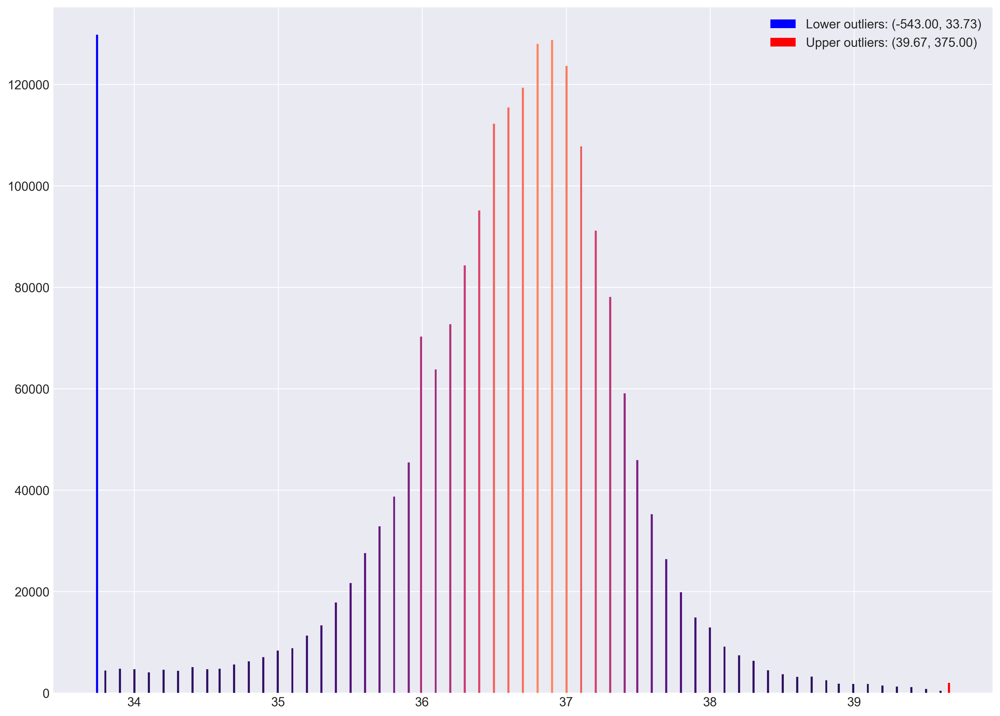

In [47]:
amsterdamumcdb.outliers_histogram(data=temperature['value'].dropna()).show()

In [48]:
#cleanup temperatures
#assumes temperatures  > 100 have been entered without a decimal separator
temperature.loc[temperature['value'] > 100, 'value'] = temperature['value']/100

In [49]:
#remove extreme outliers, most likely data entry errors or measurement errors (i.e. ambient temperature due to displaced
# sensor)
temperature.loc[(temperature['value'] > 43), 'value'] = np.NaN
temperature.loc[(temperature['value'] <= 30), 'value'] = np.NaN
temperature = temperature.dropna()

In [50]:
#calculate the temperature score
temperature['a2_temperature_score'] = 0
temperature.loc[(temperature['value'] >= 41), 'a2_temperature_score'] = 4
temperature.loc[(temperature['value'] >= 39) & (temperature['value'] < 41), 'a2_temperature_score'] = 3
temperature.loc[(temperature['value'] >= 38.5) & (temperature['value'] < 39), 'a2_temperature_score'] = 1
temperature.loc[(temperature['value'] >= 36) & (temperature['value'] < 38.5), 'a2_temperature_score'] = 0
temperature.loc[(temperature['value'] >= 34) & (temperature['value'] < 36), 'a2_temperature_score'] = 1
temperature.loc[(temperature['value'] >= 32) & (temperature['value'] < 34), 'a2_temperature_score'] = 2
temperature.loc[(temperature['value'] >= 30) & (temperature['value'] < 32), 'a2_temperature_score'] = 3
temperature.loc[(temperature['value'] < 30), 'a2_temperature_score'] = 4

#### APACHE II: Mean arterial pressure (mm Hg)

In [51]:
#-- Mean arterial pressure --mm Hg
numericitems_itemids[numericitems_itemids['item'].str.contains('(ABP|bloeddruk).*gemiddeld', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
4,6642,ABP gemiddeld,173,mmHg
25,6679,Niet invasieve bloeddruk gemiddeld,173,mmHg
197,8843,ABP gemiddeld II,173,mmHg


In [52]:
sql_mean_abp = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    CASE 
        WHEN NOT registeredby IS NULL THEN TRUE
        ELSE FALSE
    END as validated,
    (measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
n.admissionid = a.admissionid
WHERE itemid IN (
    6642, --ABP gemiddeld
    6679, --Niet invasieve bloeddruk gemiddeld
    8843 --ABP gemiddeld II
)
AND (measuredat - a.admittedat) <= 1000*60*60*24 --measurements within 24 hours
"""

mean_abp = pd.read_sql(sql_mean_abp, con)
mean_abp.head()

,admissionid,itemid,item,value,validated,time
0,0,6642,ABP gemiddeld,68.0,True,342
1,0,6642,ABP gemiddeld,70.0,True,492
2,0,6642,ABP gemiddeld,73.0,True,552
3,0,6642,ABP gemiddeld,75.0,True,432
4,0,6642,ABP gemiddeld,79.0,True,1392


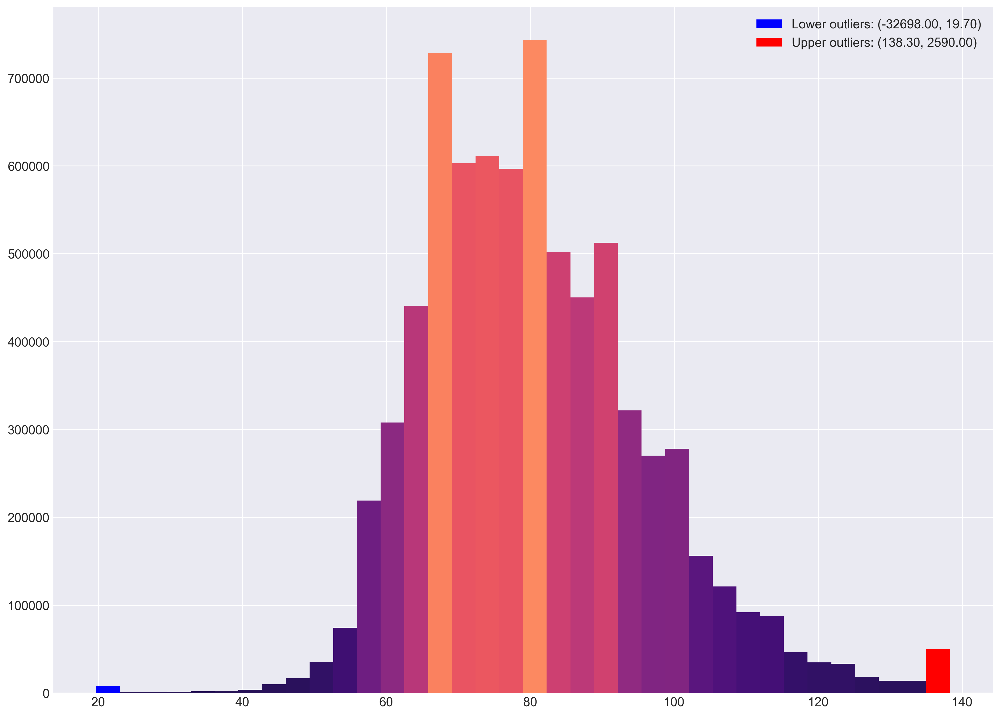

In [53]:
amsterdamumcdb.outliers_histogram(data=mean_abp['value'].dropna(), bins=36).show()

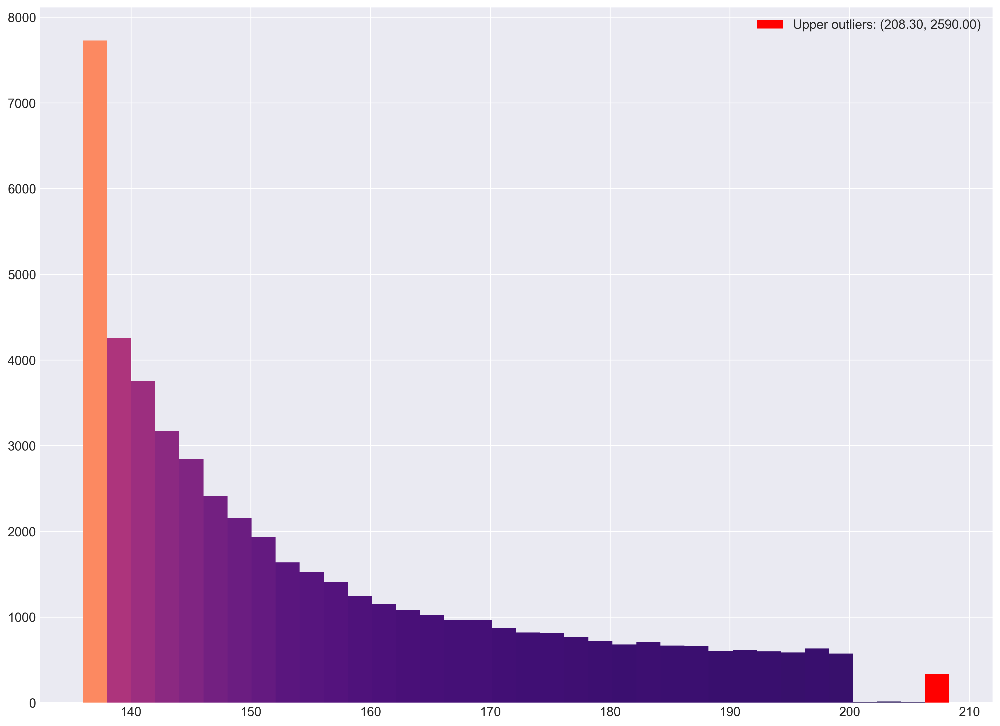

In [54]:
amsterdamumcdb.outliers_histogram(data=mean_abp.loc[mean_abp['value'] > 135, 'value'], bins=36).show()

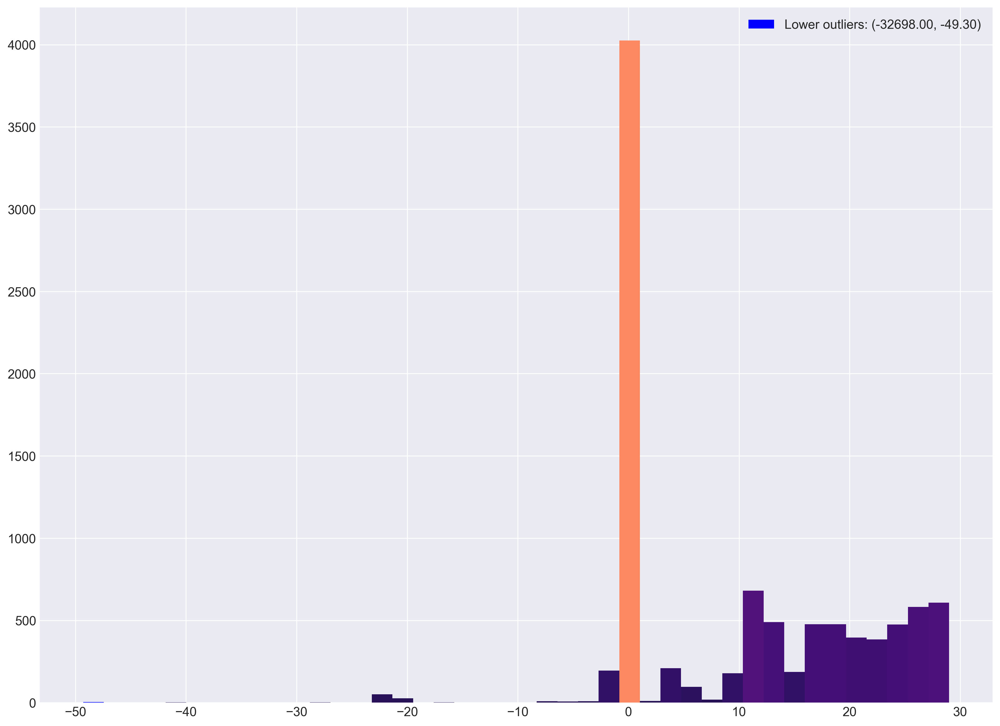

In [55]:
amsterdamumcdb.outliers_histogram(data=mean_abp.loc[mean_abp['value'] < 30, 'value']).show()

In [56]:
#remove extreme outliers, most likely data entry errors or measurement errors
mean_abp.loc[(mean_abp['value'] > 165), 'value'] = np.NaN
mean_abp.loc[(mean_abp['value'] <= 30), 'value'] = np.NaN
mean_abp = mean_abp.dropna()

In [57]:
#calculate the mean arterial pressure score
mean_abp['a2_mean_abp_score'] = 0
mean_abp.loc[(mean_abp['value'] >= 160), 'a2_mean_abp_score'] = 4
mean_abp.loc[(mean_abp['value'] >= 130) & (mean_abp['value'] < 160), 'a2_mean_abp_score'] = 3
mean_abp.loc[(mean_abp['value'] >= 110) & (mean_abp['value'] < 130), 'a2_mean_abp_score'] = 2
mean_abp.loc[(mean_abp['value'] >= 70) & (mean_abp['value'] < 110), 'a2_mean_abp_score'] = 0
mean_abp.loc[(mean_abp['value'] >= 50) & (mean_abp['value'] < 70), 'a2_mean_abp_score'] = 2
mean_abp.loc[(mean_abp['value'] < 50), 'a2_mean_abp_score'] = 4

#### APACHE II: Heart rate (ventricular response)

In [58]:
#Heart rate (ventricular response)
numericitems_itemids[numericitems_itemids['item'].str.contains('hartfreq', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
2,6640,Hartfrequentie,15,/min
1033,13075,A_Hartfrequentie,15,/min
1055,14055,PiCCO HF Hartfrequentie,15,/min


In [59]:
sql_heart_rate = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    CASE 
        WHEN NOT registeredby IS NULL THEN TRUE
        ELSE FALSE
    END as validated,
    (measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
n.admissionid = a.admissionid
WHERE itemid IN (
    6640 --Hartfrequentie
)
AND (measuredat - a.admittedat) <= 1000*60*60*24 --measurements within 24 hours
"""

heart_rate = pd.read_sql(sql_heart_rate, con)
heart_rate.head()

,admissionid,itemid,item,value,validated,time
0,7690,6640,Hartfrequentie,68.0,False,732
1,7690,6640,Hartfrequentie,69.0,True,1032
2,7690,6640,Hartfrequentie,70.0,True,792
3,7690,6640,Hartfrequentie,71.0,False,672
4,7690,6640,Hartfrequentie,72.0,True,852


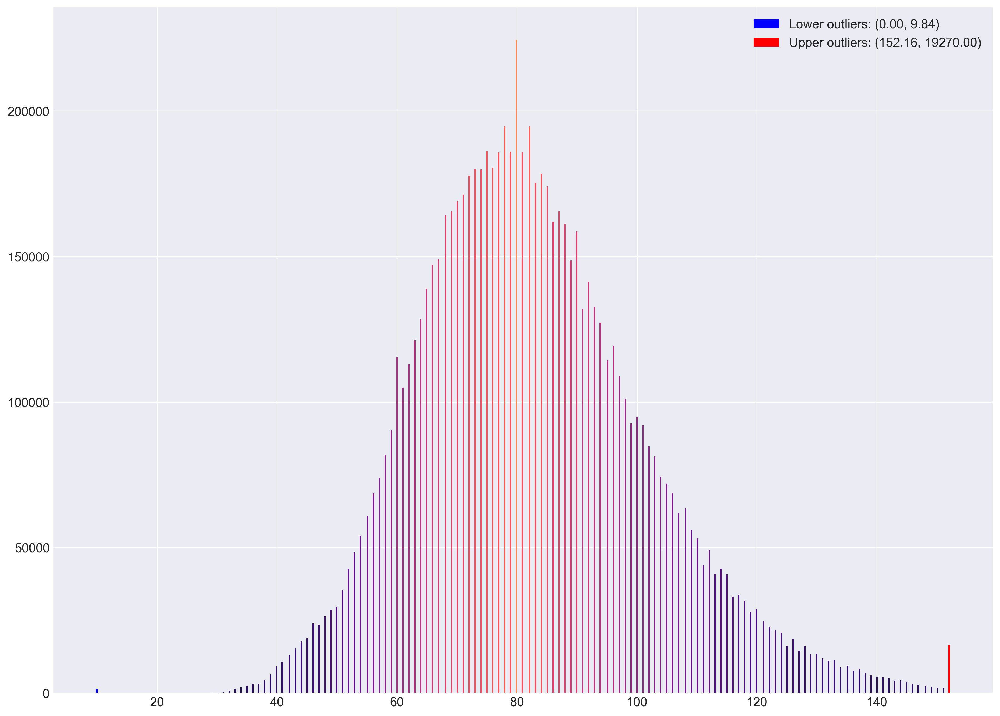

In [60]:
amsterdamumcdb.outliers_histogram(data=heart_rate['value'].dropna()).show()

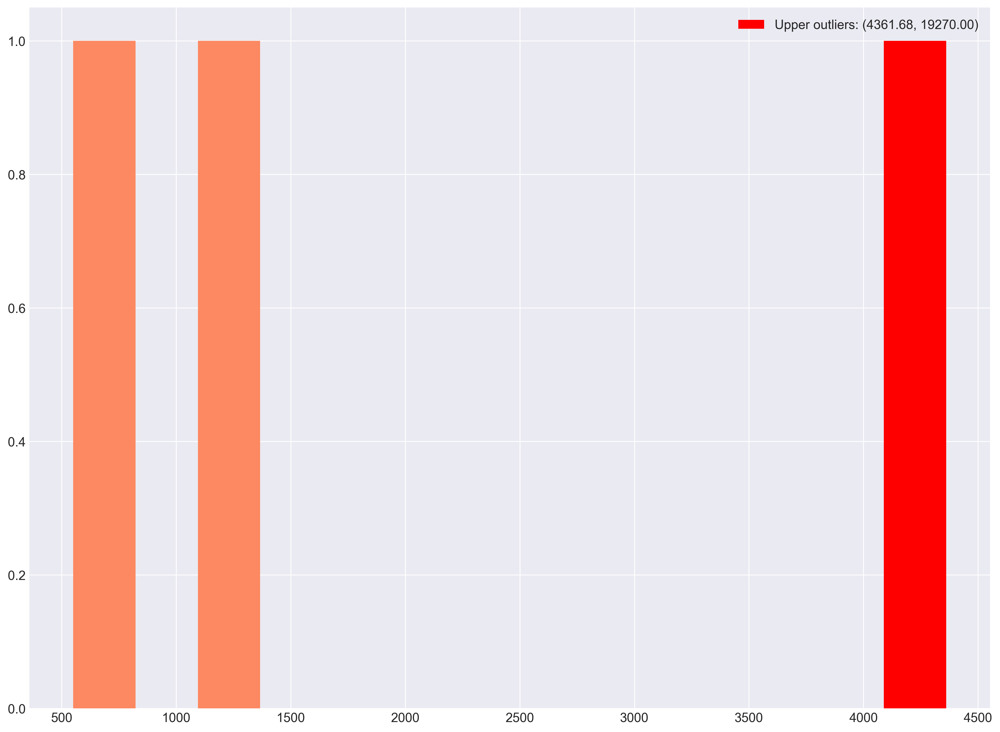

In [61]:
amsterdamumcdb.outliers_histogram(data=heart_rate.loc[heart_rate['value'] > 300, 'value']).show()

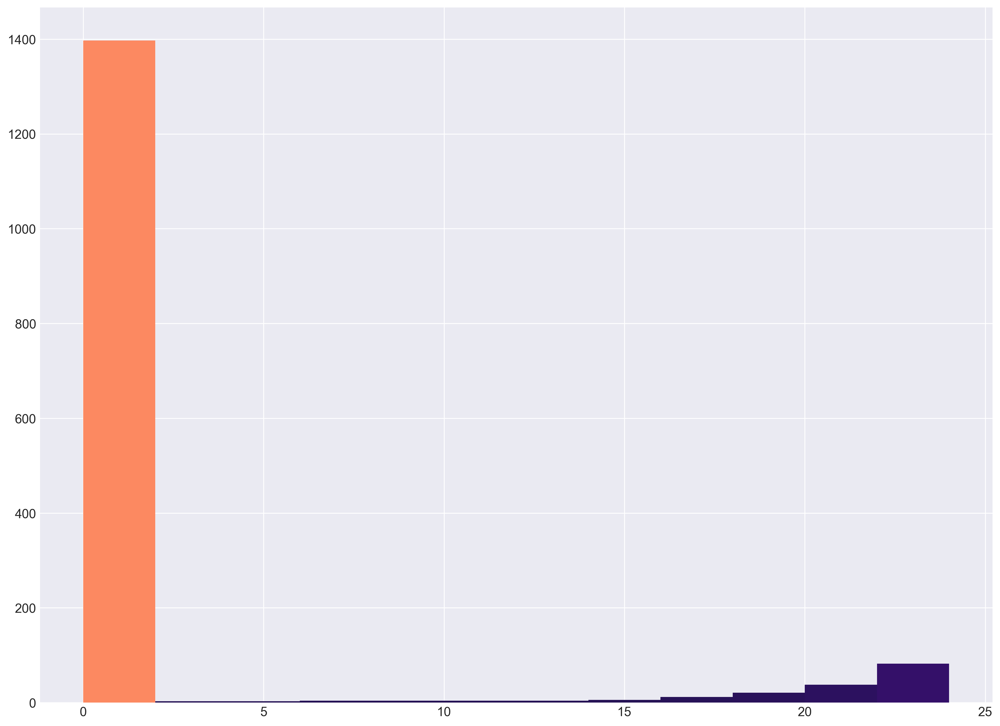

In [62]:
amsterdamumcdb.outliers_histogram(data=heart_rate.loc[heart_rate['value'] <25, 'value']).show()

In [63]:
#remove extreme outliers, most likely data entry errors or measurement errors
heart_rate.loc[(heart_rate['value'] > 300), 'value'] = np.NaN
heart_rate = heart_rate.dropna()

In [64]:
#calculate the heart rate score
heart_rate['a2_heart_rate_score'] = 0
heart_rate.loc[(heart_rate['value'] >= 180), 'a2_heart_rate_score'] = 4
heart_rate.loc[(heart_rate['value'] >= 140) & (heart_rate['value'] < 180), 'a2_heart_rate_score'] = 3
heart_rate.loc[(heart_rate['value'] >= 110) & (heart_rate['value'] < 140), 'a2_heart_rate_score'] = 2
heart_rate.loc[(heart_rate['value'] >= 70) & (heart_rate['value'] < 110), 'a2_heart_rate_score'] = 0
heart_rate.loc[(heart_rate['value'] >= 55) & (heart_rate['value'] < 70), 'a2_heart_rate_score'] = 2
heart_rate.loc[(heart_rate['value'] >= 40) & (heart_rate['value'] < 55), 'a2_heart_rate_score'] = 3
heart_rate.loc[(heart_rate['value'] < 40), 'a2_heart_rate_score'] = 4

#### APACHE II: Respiratory rate (non-ventilated or ventilated)

In [65]:
#Respiratory rate (non-ventilated or ventilated) - possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('adem.*freq|spont|adem', flags=re.IGNORECASE)][['itemid','item']]

,itemid,item
126,7726,Ademfrequentie Spontaan
188,8798,UrineSpontaan
218,8873,Ademfrequentie Evita
219,8874,Ademfrequentie Monitor
220,8875,Mv Spontaan
221,8876,Frequentie Spontaan
230,8886,Beademings Temperatuur
277,9654,Ademfrequentie Spontaan(2)
281,9663,Mv Spontaan(2)
871,12266,Ademfreq.


In [66]:
sql_resp_rate = """
WITH resp_rate AS (
    SELECT 
        n.admissionid,
        n.itemid,
        n.item,
        n.value,
        CASE 
            WHEN NOT n.registeredby IS NULL THEN TRUE
            ELSE FALSE
        END as validated,
        (n.measuredat - a.admittedat)/(1000*60) AS time,
        ROW_NUMBER() OVER(
            PARTITION BY n.admissionid, n.measuredat
            ORDER BY 
                CASE itemid
                    WHEN 8873 THEN 1 --Ventilator measurements
                    WHEN 12266 THEN 2 --Ventilator measurements
                    ELSE 3  --Patient monitor measurements
                END
            ) AS priority
    FROM numericitems n
    LEFT JOIN admissions a ON
        n.admissionid = a.admissionid
    WHERE itemid IN (
        --Evita Parameters
        8873, --Ademfrequentie Evita: measurement by Evita ventilator, most accurate
        --7726, --Ademfrequentie Spontaan: measurement by Evita ventilator, spontaneous breaths/min, distiction not needed for 'actual' respiratory rate
        --9654, --Ademfrequentie Spontaan(2): measurement by 2nd simultaneously used Evita ventilator (very uncommon), spontaneous breaths/min, distiction not needed for 'actual' respiratory rate

        --Servo-i/Servo-u Parameters
        --12283, --Adem Frequentie (Set): setting on Servo-i/Servo-U ventilator, not needed for 'actual' respiratory rate
        --12322, --Adem Frequentie (Set) (2): setting on 2nd simultaneously used Servo-i/Servo-U ventilator (uncommon), not needed for 'actual' respiratory rate
        12266, --Ademfreq.: measurement by Servo-i/Servo-U ventilator, most accurate
        --12348, --Ademfreq.(2): measurement by 2nd simultaneously used Servo-i/Servo-U ventilator (uncommon), no additional information
        --12577 --Ademfreq. Spontaan nieuw --from Servo-i/Servo-U ventilator, spontaneous breaths/min, distiction not needed for 'actual' respiratory rate

        --Patient monitor
        8874 --Ademfrequentie Monitor: measurement by patient monitor using ECG-impedance, less accurate
        )
    AND (n.measuredat - a.admittedat) <= 1000*60*60*24 --measurements within 24 hours
)
SELECT * FROM
resp_rate
WHERE priority = 1 --only retreive most accurate measurement

"""
resp_rate = pd.read_sql(sql_resp_rate, con)
resp_rate.head()

,admissionid,itemid,item,value,validated,time,priority
0,0,12266,Ademfreq.,13.0,True,342,1
1,0,12266,Ademfreq.,13.0,True,372,1
2,0,12266,Ademfreq.,13.0,True,432,1
3,0,12266,Ademfreq.,13.0,True,492,1
4,0,12266,Ademfreq.,13.0,True,552,1


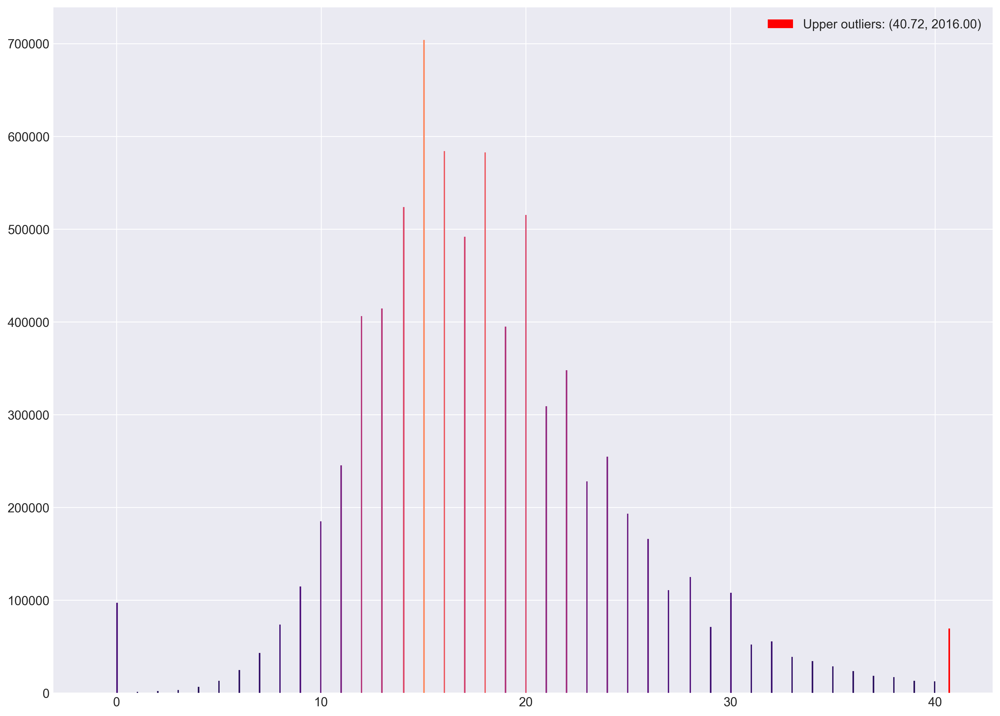

In [67]:
amsterdamumcdb.outliers_histogram(data=resp_rate['value'].dropna()).show() 

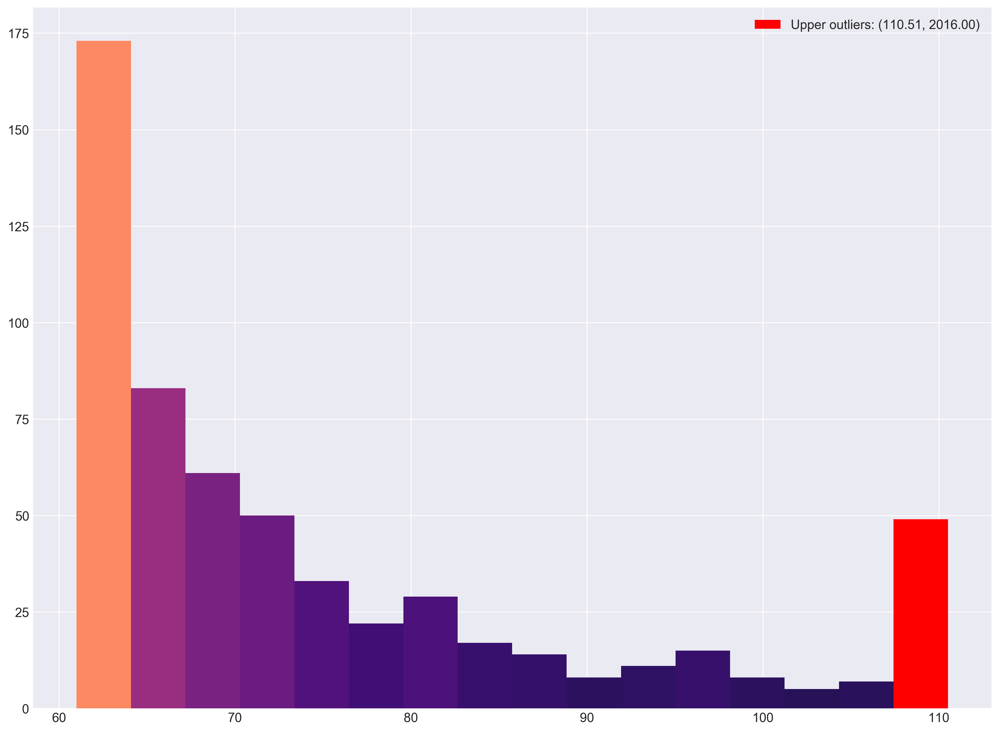

In [68]:
amsterdamumcdb.outliers_histogram(data=resp_rate.loc[resp_rate['value'] > 60, 'value'].dropna()).show()

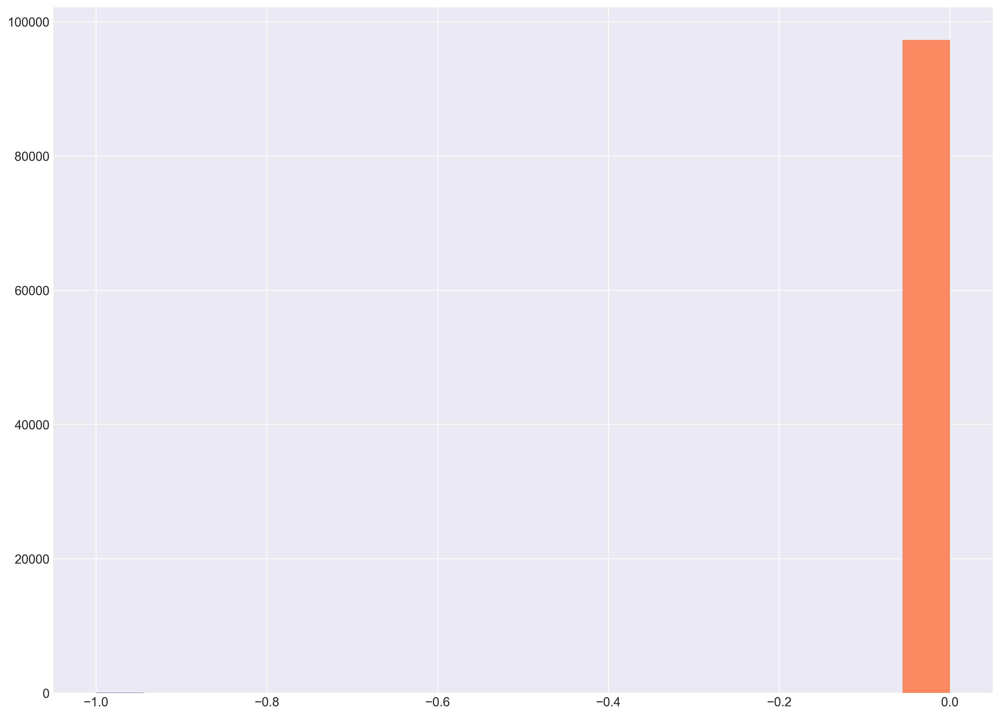

In [69]:
amsterdamumcdb.outliers_histogram(data=resp_rate.loc[resp_rate['value'] <= 0, 'value'].dropna()).show()

In [70]:
resp_rate.loc[(resp_rate['value'] <= 0) & (resp_rate['validated'] == True)]

,admissionid,itemid,item,value,validated,time,priority
735,4,8874,Ademfrequentie Monitor,0.0,True,768,1
795,4,8874,Ademfrequentie Monitor,0.0,True,828,1
855,4,8874,Ademfrequentie Monitor,0.0,True,888,1
2949,12,8873,Ademfrequentie Evita,0.0,True,15,1
2950,12,8874,Ademfrequentie Monitor,0.0,True,46,1
6021,18,8874,Ademfrequentie Monitor,0.0,True,513,1
6815,20,8874,Ademfrequentie Monitor,0.0,True,32,1
6840,21,8874,Ademfrequentie Monitor,0.0,True,189,1
8936,31,8874,Ademfrequentie Monitor,0.0,True,784,1
22168,66,8874,Ademfrequentie Monitor,0.0,True,4,1


In [71]:
#remove extreme outliers, most likely data entry errors or measurement errors
#specifically for the Evita ventilator '0' was given in 'standby'; additionally 0 is often reported by the patient monitor
resp_rate.loc[resp_rate['value'] > 60, 'value'] = np.NaN
resp_rate.loc[resp_rate['value'] <= 0, 'value'] = np.NaN
resp_rate = resp_rate.dropna()

In [72]:
#calculate the respiratory rate score
resp_rate['a2_resp_rate_score'] = 0
resp_rate.loc[(resp_rate['value'] >= 50), 'a2_resp_rate_score'] = 4
resp_rate.loc[(resp_rate['value'] >= 35) & (resp_rate['value'] < 50), 'a2_resp_rate_score'] = 3
resp_rate.loc[(resp_rate['value'] >= 25) & (resp_rate['value'] < 35), 'a2_resp_rate_score'] = 1
resp_rate.loc[(resp_rate['value'] >= 12) & (resp_rate['value'] < 25), 'a2_resp_rate_score'] = 0
resp_rate.loc[(resp_rate['value'] >= 10) & (resp_rate['value'] < 12), 'a2_resp_rate_score'] = 1
resp_rate.loc[(resp_rate['value'] >= 6) & (resp_rate['value'] < 10), 'a2_resp_rate_score'] = 2
resp_rate.loc[(resp_rate['value'] < 6), 'a2_resp_rate_score'] = 4

#### APACHE: Oxygenation: A-aDO, or PaO2 (mmHg)
- a. FiO2 >= 0.5 record A-aDO2
- b. FiO2 < 0.5 record only PaO2

In [73]:
sql_freetextitems_itemids = """
SELECT DISTINCT itemid, item
FROM freetextitems
"""
freetextitems_itemids = pd.read_sql(sql_freetextitems_itemids,con)
freetextitems_itemids.head()

,itemid,item
0,14220,PORF-typ (verz. urine)
1,17663,Oxalaat kristallen (urine)
2,17939,Volgnummer MoDiag (bloed)
3,17368,HSV DNA PCR (blaasjesv.)
4,15694,JAK2 V617F (bloed)


In [74]:
freetextitems_itemids.to_csv('freetextitems_itemids.csv')

In [75]:
freetextitems_itemids[freetextitems_itemids['item'].str.contains('afname', flags=re.IGNORECASE)]

,itemid,item
353,11139,Afname (semen)
888,11646,Afname (bloed)


In [76]:
sql_afname = """
SELECT DISTINCT itemid, item, value
FROM freetextitems
WHERE itemid = 11646 --Afname (bloed)
    AND value ILIKE '%art.%'
"""
afname = pd.read_sql(sql_afname,con)
afname

,itemid,item,value
0,11646,Afname (bloed),art.
1,11646,Afname (bloed),Art.
2,11646,Afname (bloed),ART.


In [77]:
#APACHE: Oxygenation: A-aDO, or PaO2 (mmHg) / FiO2 - possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('FiO2|sO2|O2|zuurstof|CO2', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
31,6699,FiO2 %,191,Geen
32,6707,End tidal CO2 concentratie,173,mmHg
87,6846,PCO2,173,mmHg
121,7433,PO2,173,mmHg
136,8080,CO2 min prod,24,ml/min
147,8507,SVO2,0,None
198,8845,O2 l/min,26,l/min
214,8869,O2 Volume,0,None
228,8884,End Tidal CO2 %,0,None
229,8885,End Tidal CO2 mmHG,173,mmHg


In [78]:
#APACHE: Oxygenation: A-aDO, or PaO2 (mmHg) / PCO2 - possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('CO2', flags=re.IGNORECASE)][['itemid','item']]

,itemid,item
32,6707,End tidal CO2 concentratie
87,6846,PCO2
136,8080,CO2 min prod
228,8884,End Tidal CO2 %
229,8885,End Tidal CO2 mmHG
279,9658,End Tidal CO2% (2)
405,9990,pCO2 (bloed)
406,9991,pCO2 (overig)
872,12267,CO2 min prodX
873,12270,CO2 tidal productie


In [79]:
# simultaneously retrieve PaCO2 and PaO2 (=from same blood gas analysis) and retrieve the 'nearest' FiO2 from the ventilator:
# ideally documentation of measurements should be at the same time, but since this is not garanteed allow a window.
#
# in more recent data PaCO2 and PaO2 were documented in kPa instead of mmHg.

sql_oxygenation = """ 
WITH oxygenation AS (
    SELECT 
        pao2.admissionid,
        --pao2.itemid,
        --pao2.item,
        CASE pao2.unitid 
            WHEN 152 THEN pao2.value * 7.50061683 -- Conversion: kPa to mmHg
            ELSE pao2.value 
        END AS "PaO2",
        CASE paco2.unitid 
            WHEN 152 THEN paco2.value * 7.50061683 -- Conversion: kPa to mmHg
            ELSE paco2.value
        END AS "PaCO2",
        f.value AS specimen_source,
        --pao2.registeredby,
        CASE 
            WHEN pao2.registeredby NOT ILIKE '%Systeem%' THEN TRUE
            ELSE FALSE
        END AS manual_entry,
        (pao2.measuredat - a.admittedat)/(1000*60) AS time,
        --fio2.itemid,
        --fio2.item,
        fio2.value AS "FiO2",
        --fio2.measuredat,
        (fio2.measuredat - pao2.measuredat)/(60*1000) AS FiO2_time_difference,
        ROW_NUMBER() OVER(
            PARTITION BY pao2.admissionid, pao2.measuredat
            ORDER BY ABS(fio2.measuredat - pao2.measuredat)
        ) AS priority --give priority to nearest FiO2 measurement
    FROM numericitems pao2
    LEFT JOIN admissions a ON
        pao2.admissionid = a.admissionid
    LEFT JOIN freetextitems f ON
        pao2.admissionid = f.admissionid AND
        pao2.measuredat = f.measuredat AND
        f.itemid = 11646 --Afname (bloed): source of specimen
    LEFT JOIN numericitems paco2 ON 
        pao2.admissionid = paco2.admissionid AND
        pao2.measuredat = paco2.measuredat AND
        paco2.itemid IN (
            6846, --PCO2
            9990, --pCO2 (bloed)
            21213 --PCO2 (bloed) - kPa
        )
    LEFT JOIN numericitems fio2 ON 
        pao2.admissionid = fio2.admissionid AND
        fio2.itemid IN (
            6699, --FiO2 %: setting on Evita ventilator
            12279, --O2 concentratie --measurement by Servo-i/Servo-U ventilator
            --12282, --O2 concentratie (Set) -- setting on Servo-i/Servo-U ventilator, not needed, same as measurement
            --12329, --O2 concentratie (Set) (2) --setting on 2nd Servo-i/Servo-U ventilator, not needed, same as measurement
            12369, --SET %O2: used with BiPap Vision ventilator
            16246 --Zephyros FiO2: Non-invasive ventilation
        ) AND
        fio2.measuredat > pao2.measuredat - 60*60*1000 AND --no earlier than 60 minutes before pao2 measurement
        fio2.measuredat < pao2.measuredat + 15*60*1000 --no later than 15 minutes after pao2 measurement
    WHERE 
        pao2.itemid IN (
            7433, --PO2
            9996, --PO2 (bloed)
            21214 --PO2 (bloed) - kPa
        ) 
    --measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
    AND (pao2.measuredat - a.admittedat) <= 1000*60*60*24 AND (pao2.measuredat - a.admittedat) >= -(1000*60*30) AND
    (f.value ILIKE '%art.%' OR f.value IS NULL)  -- source is arterial or undefined (assume arterial)
)
SELECT * FROM oxygenation
WHERE priority = 1
"""
oxygenation = pd.read_sql(sql_oxygenation, con)
oxygenation.head()

,admissionid,PaO2,PaCO2,specimen_source,manual_entry,time,FiO2,fio2_time_difference,priority
0,0,90.0,39.0,None,True,342,50.0,0.0,1
1,0,149.0,37.0,None,True,432,51.0,0.0,1
2,0,104.0,36.0,None,True,552,41.0,0.0,1
3,0,32.0,43.0,None,True,612,41.0,0.0,1
4,0,105.0,37.0,None,True,732,41.0,0.0,1


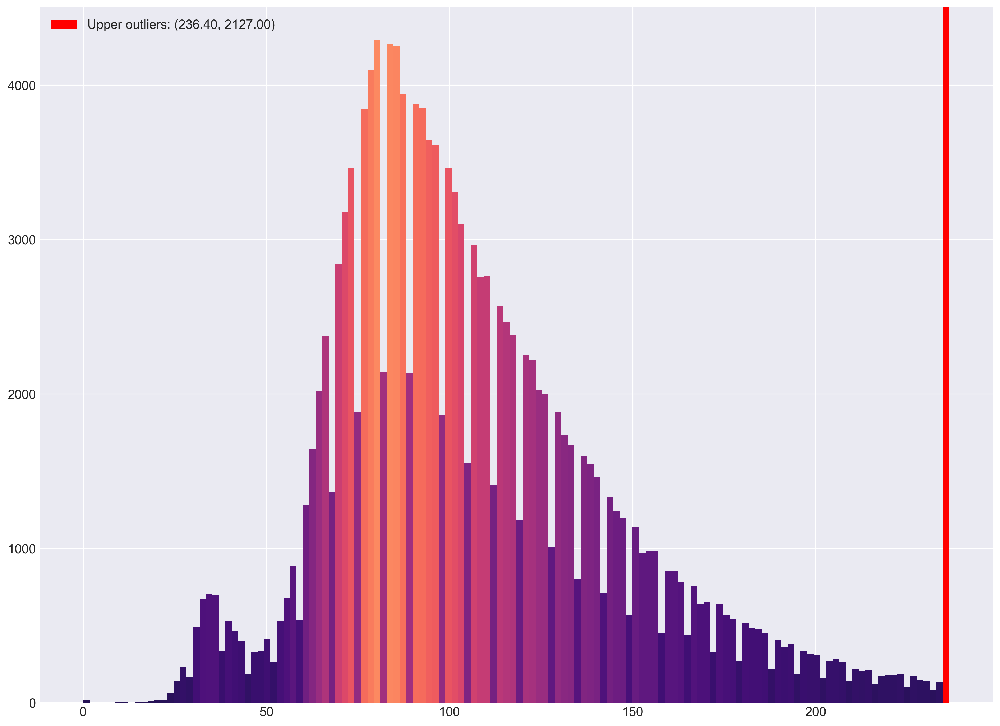

In [80]:
amsterdamumcdb.outliers_histogram(data=oxygenation['PaO2'].dropna()).show()

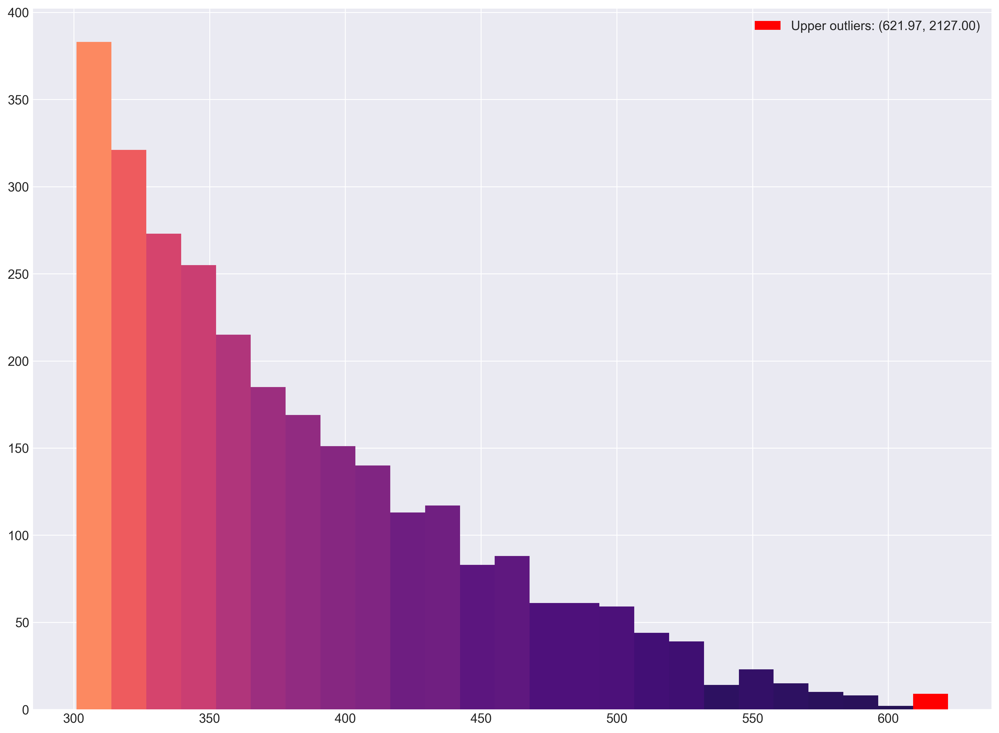

In [81]:
amsterdamumcdb.outliers_histogram(data=oxygenation.loc[oxygenation['PaO2'] > 300,'PaO2']).show()

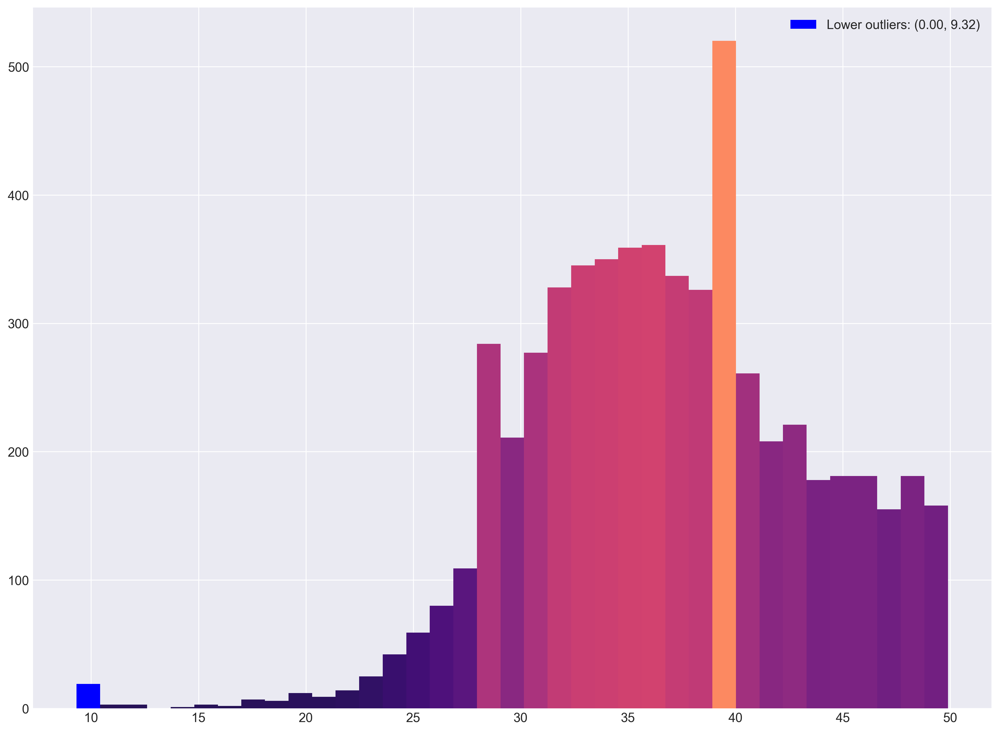

In [82]:
amsterdamumcdb.outliers_histogram(data=oxygenation.loc[(oxygenation['PaO2'] < 50), 'PaO2']).show()

In [83]:
#remove lower outliers, most likely incorrectly labeled as 'arterial' instead of '(mixed/central) venous'
oxygenation.loc[oxygenation['PaO2'] < 50, 'PaO2'] = np.NaN
oxygenation = oxygenation.dropna(subset=['PaO2'])

In [84]:
#drop row without PaCO2 measurement - probably temporary measurement error
#len(oxygenation.dropna(subset=['PaCO2']))\
oxygenation = oxygenation.dropna(subset=['PaCO2'])

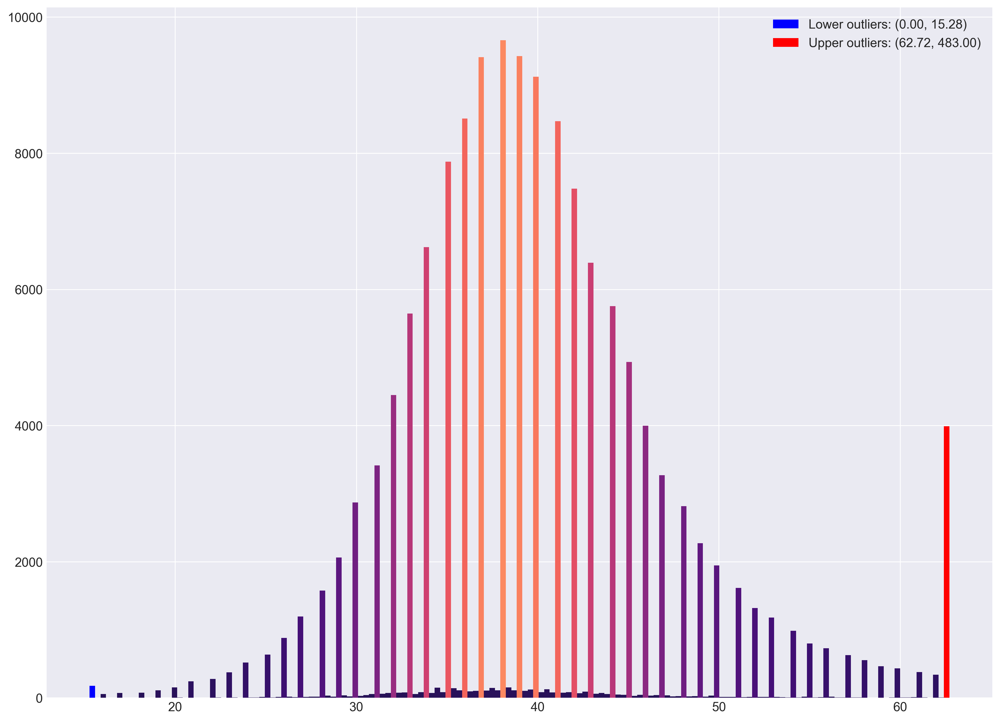

In [85]:
amsterdamumcdb.outliers_histogram(data=oxygenation['PaCO2']).show()

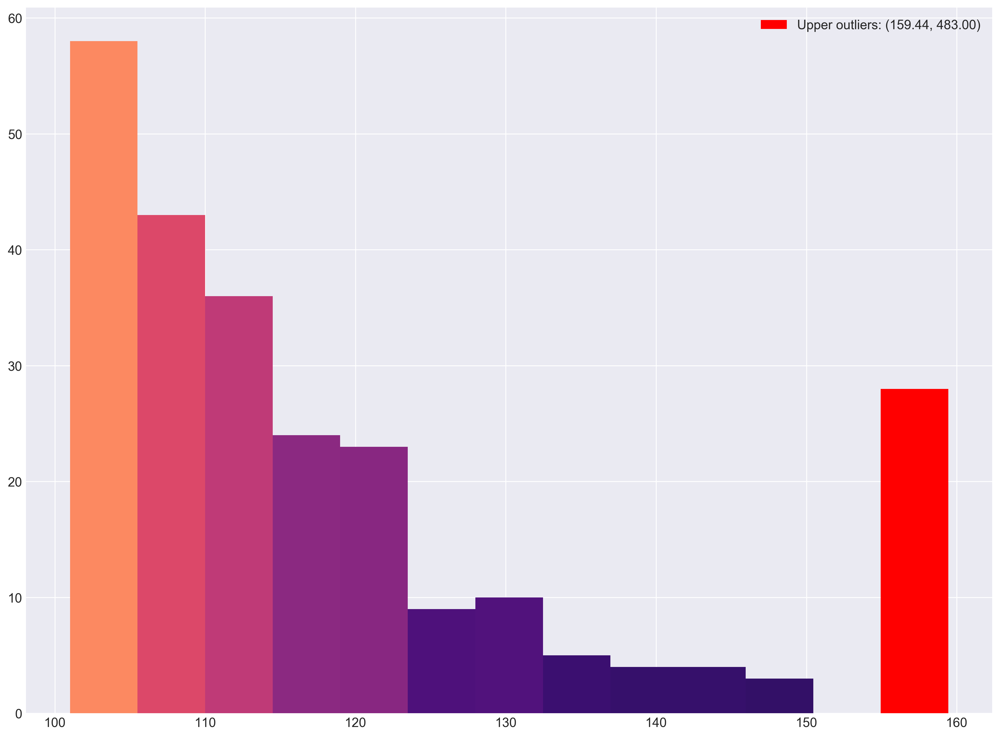

In [86]:
amsterdamumcdb.outliers_histogram(data=oxygenation.loc[(oxygenation['PaCO2'] > 100), 'PaCO2']).show()

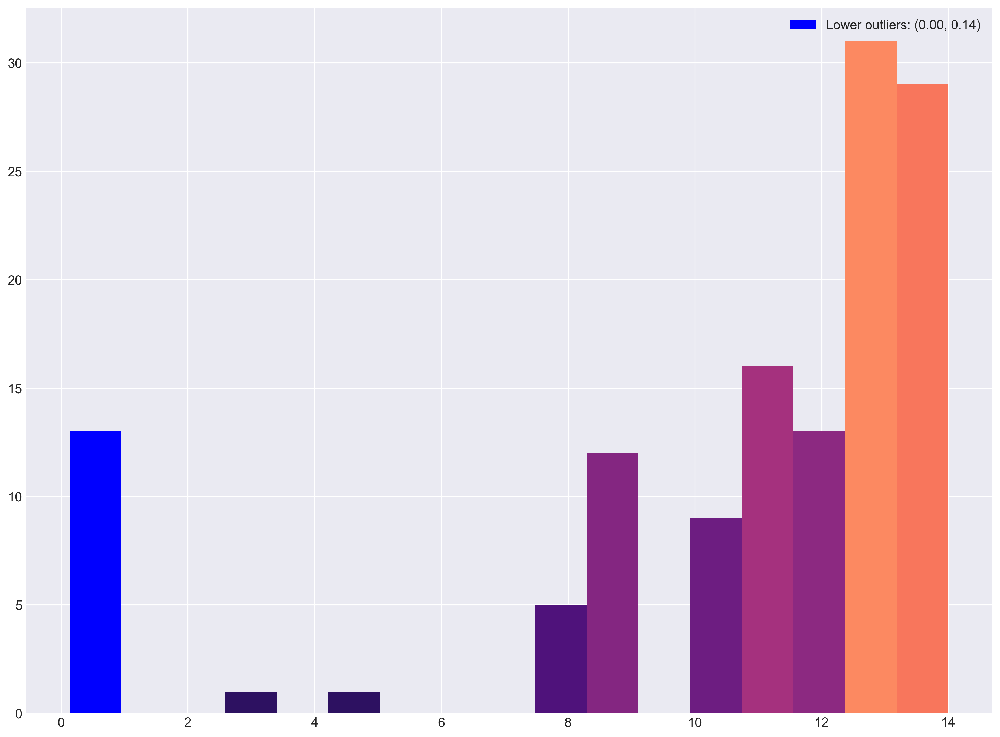

In [87]:
amsterdamumcdb.outliers_histogram(data=oxygenation.loc[(oxygenation['PaCO2'] < 15), 'PaCO2']).show()

In [88]:
#remove outliers, but only when manually entered, since labs are considered accurate
oxygenation.loc[(oxygenation['PaCO2'] > 100) & (oxygenation['manual_entry'] == True), 'PaCO2'] = np.NaN
oxygenation.loc[(oxygenation['PaCO2'] < 15) & (oxygenation['manual_entry'] == True), 'PaCO2'] = np.NaN
oxygenation = oxygenation.dropna(subset=['PaCO2'])

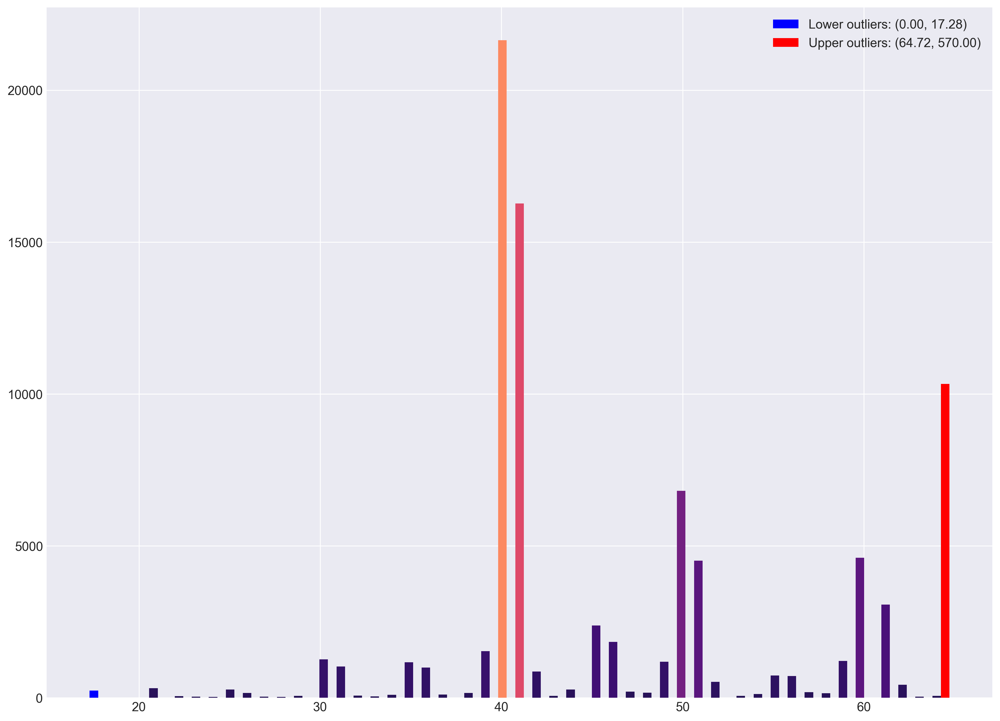

In [89]:
amsterdamumcdb.outliers_histogram(data=oxygenation['FiO2'].dropna()).show()

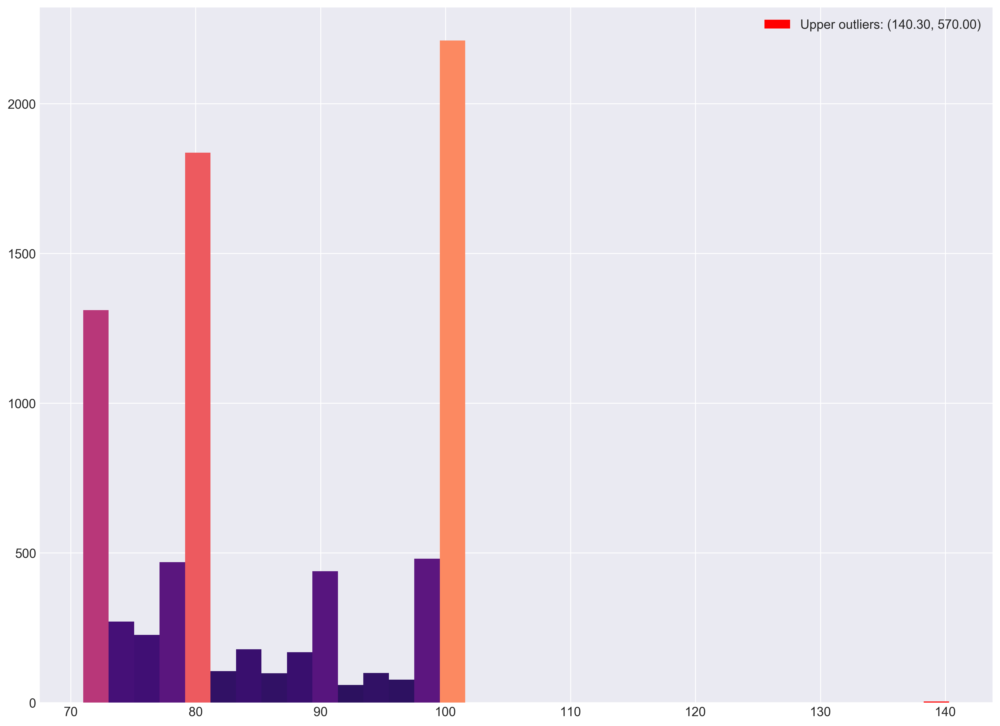

In [90]:
amsterdamumcdb.outliers_histogram(data=oxygenation.loc[oxygenation['FiO2'] > 70, 'FiO2'].dropna()).show()

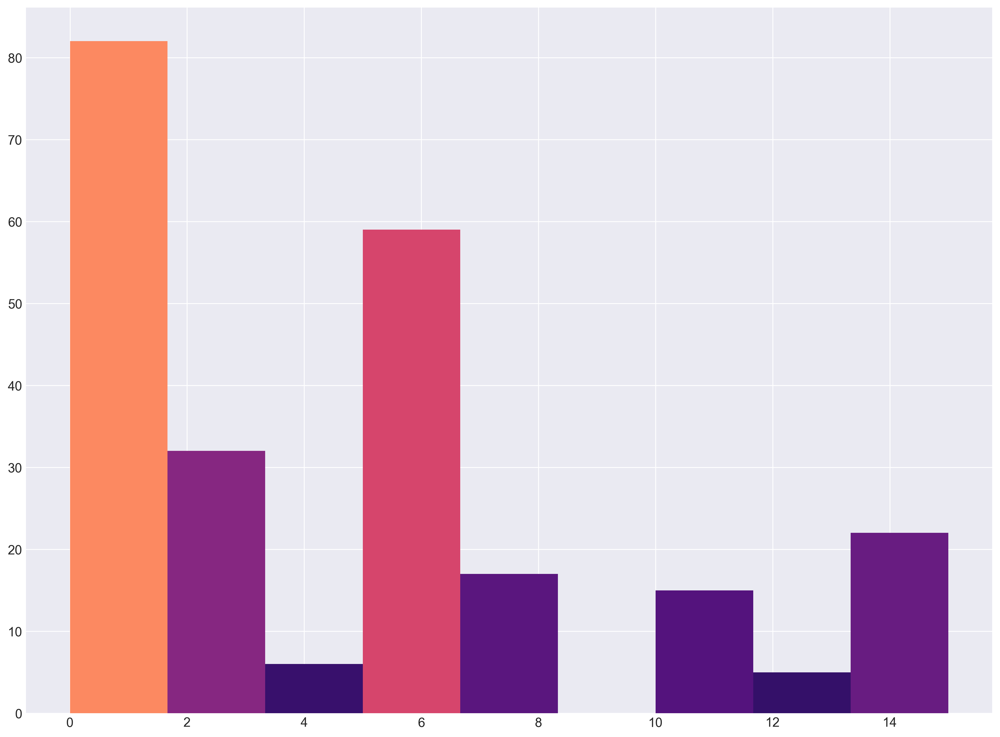

In [91]:
amsterdamumcdb.outliers_histogram(data=oxygenation.loc[oxygenation['FiO2'] < 20, 'FiO2'].dropna()).show()

In [92]:
#remove impossible FiO2 outliers (i.e. > 100% or <21%)
oxygenation.loc[(oxygenation['FiO2'] > 100), 'FiO2'] = np.NaN
oxygenation.loc[(oxygenation['FiO2'] < 20), 'FiO2'] = np.NaN

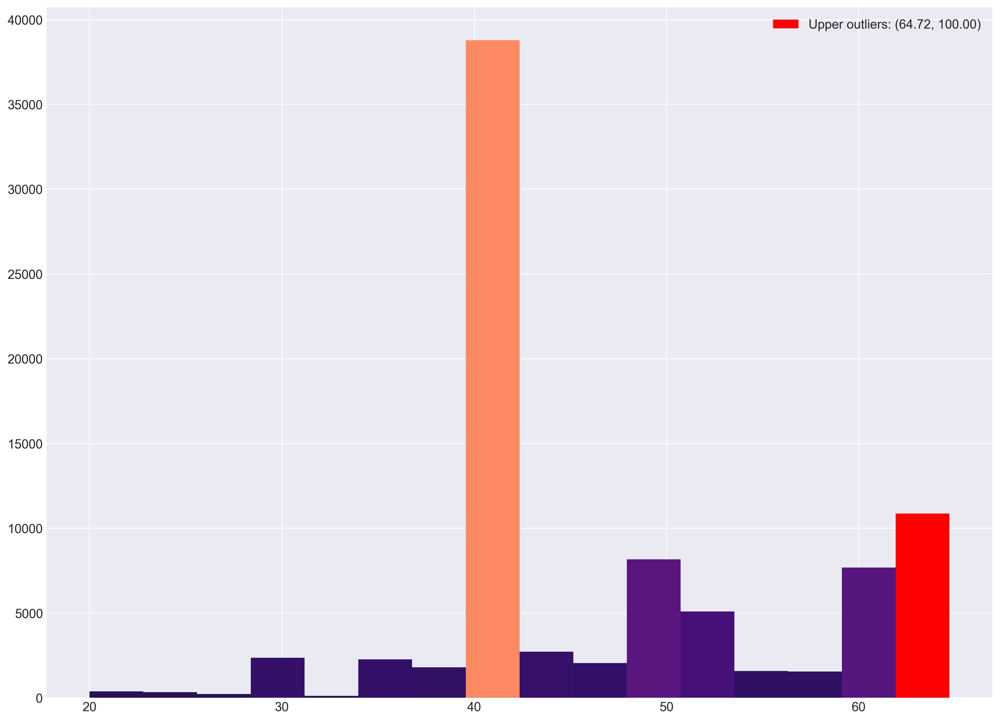

In [93]:
amsterdamumcdb.outliers_histogram(data=oxygenation['FiO2'].dropna(), bins=16).show()

$$\require{mhchem}$$
The equation for calculating the A–aDO2 gradient is:

\begin{equation*}
{\displaystyle {\text{A–aDO2}}=\left(F_{i}{\ce {O2}}(P_{\text{atm}}-P_{{\ce {H2O}}})-{\frac {P_{a}{\ce {CO2}}}{0.8}}\right)-P_{a}{\ce {O2}}}
\end{equation*}

https://en.wikipedia.org/wiki/Alveolar%E2%80%93arterial_gradient

In [94]:
#Patm = 760 mmHg, PH2O = 47 mmHg
oxygenation['AaDO2'] = ((oxygenation['FiO2'] / 100) * (760 - 47) - (oxygenation['PaCO2']/ 0.8)) - oxygenation['PaO2']
oxygenation.head()

,admissionid,PaO2,PaCO2,specimen_source,manual_entry,time,FiO2,fio2_time_difference,priority,AaDO2
0,0,90.0,39.0,None,True,342,50.0,0.0,1,217.75
1,0,149.0,37.0,None,True,432,51.0,0.0,1,168.38
2,0,104.0,36.0,None,True,552,41.0,0.0,1,143.33
4,0,105.0,37.0,None,True,732,41.0,0.0,1,141.08
5,0,90.0,42.0,None,True,927,41.0,-15.0,1,149.83


In [95]:
#calculate the oxygenation score
oxygenation['a2_oxygenation_score'] = 0
oxygenation.loc[(oxygenation['FiO2'] > 50) & (oxygenation['AaDO2'] >= 500), 'a2_oxygenation_score'] = 4
oxygenation.loc[(oxygenation['FiO2'] > 50) & (oxygenation['AaDO2'] >= 350) & (oxygenation['AaDO2'] < 500), 'a2_oxygenation_score'] = 3
oxygenation.loc[(oxygenation['FiO2'] > 50) & (oxygenation['AaDO2'] >= 200) & (oxygenation['AaDO2'] < 350), 'a2_oxygenation_score'] = 2
oxygenation.loc[(oxygenation['FiO2'] > 50) & (oxygenation['AaDO2'] < 200), 'a2_oxygenation_score'] = 0
oxygenation.loc[((oxygenation['FiO2'] < 50) | (oxygenation['FiO2'].isna())) & (oxygenation['PaO2'] > 70), 'a2_oxygenation_score'] = 0
oxygenation.loc[((oxygenation['FiO2'] < 50) | (oxygenation['FiO2'].isna())) & (oxygenation['PaO2'] > 60) & (oxygenation['PaO2'] <= 70), 'a2_oxygenation_score'] = 1
oxygenation.loc[((oxygenation['FiO2'] < 50) | (oxygenation['FiO2'].isna())) & (oxygenation['PaO2'] >= 55) & (oxygenation['PaO2'] <= 60), 'a2_oxygenation_score'] = 3
oxygenation.loc[((oxygenation['FiO2'] < 50) | (oxygenation['FiO2'].isna())) & (oxygenation['PaO2'] < 55), 'a2_oxygenation_score'] = 4

#### APACHE II: Arterial pH

In [96]:
# APACHE II: Arterial pH - possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('^pH|pH$', flags=re.IGNORECASE)][['itemid','item']]

,itemid,item
88,6848,PH
112,7126,PH in urine
592,11424,pH (overig)
599,11493,pH (urine)
603,11519,pH semen (semen)
609,11548,pH gemeten (urine)
610,11549,pH-gemeten (verz. urine)
611,11550,pH-gemeten (overig)
612,11551,pH (faeces)
616,11578,pH (verz. urine)


In [97]:
#get arterial pH
sql_pH = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    f.value AS specimen_source,
    n.registeredby,
    CASE 
        WHEN n.registeredby NOT ILIKE '%Systeem%' THEN TRUE
        ELSE FALSE
    END AS manual_entry,
    (n.measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
    n.admissionid = a.admissionid
LEFT JOIN freetextitems f ON
    n.admissionid = f.admissionid AND
    n.measuredat = f.measuredat AND
    f.itemid = 11646 --Afname (bloed): source of specimen (arterial)
WHERE n.itemid IN (
    6848, --PH
    12310 --pH (bloed)
    )
-- measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
AND (n.measuredat - a.admittedat) <= 1000*60*60*24 AND (n.measuredat - a.admittedat) >= -(1000*60*30)
AND (f.value ILIKE '%art.%' OR f.value IS NULL) -- source is arterial or undefined (assume arterial)
"""
pH = pd.read_sql(sql_pH, con)
pH.head()

,admissionid,itemid,item,value,specimen_source,registeredby,manual_entry,time
0,746,6848,PH,7.44,None,ICV_IC-Verpleegkundig,True,1408
1,12,6848,PH,7.22,None,ICV_IC-Verpleegkundig,True,495
2,12,6848,PH,7.32,None,ICV_IC-Verpleegkundig,True,975
3,12,6848,PH,7.33,None,ICV_IC-Verpleegkundig,True,735
4,102,6848,PH,7.38,None,ICV_IC-Verpleegkundig,True,600


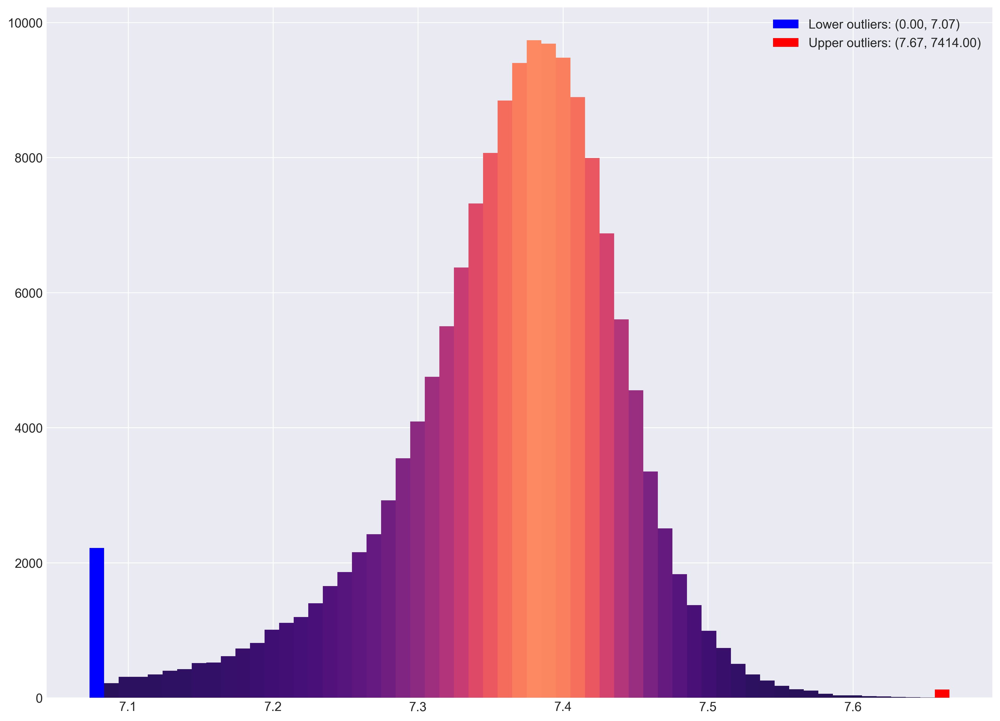

In [98]:
amsterdamumcdb.outliers_histogram(data=pH['value'].dropna(), bins=59).show()

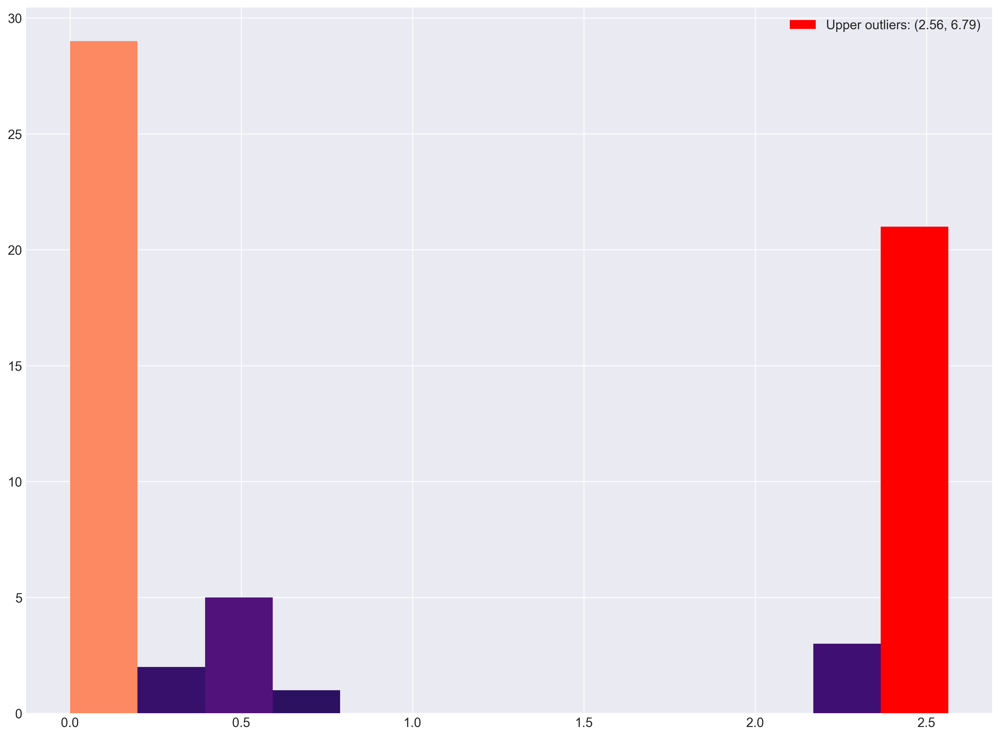

In [99]:
amsterdamumcdb.outliers_histogram(data=pH.loc[(pH['value'] < 6.8) & (pH['manual_entry'] == True), 'value'].dropna()).show()

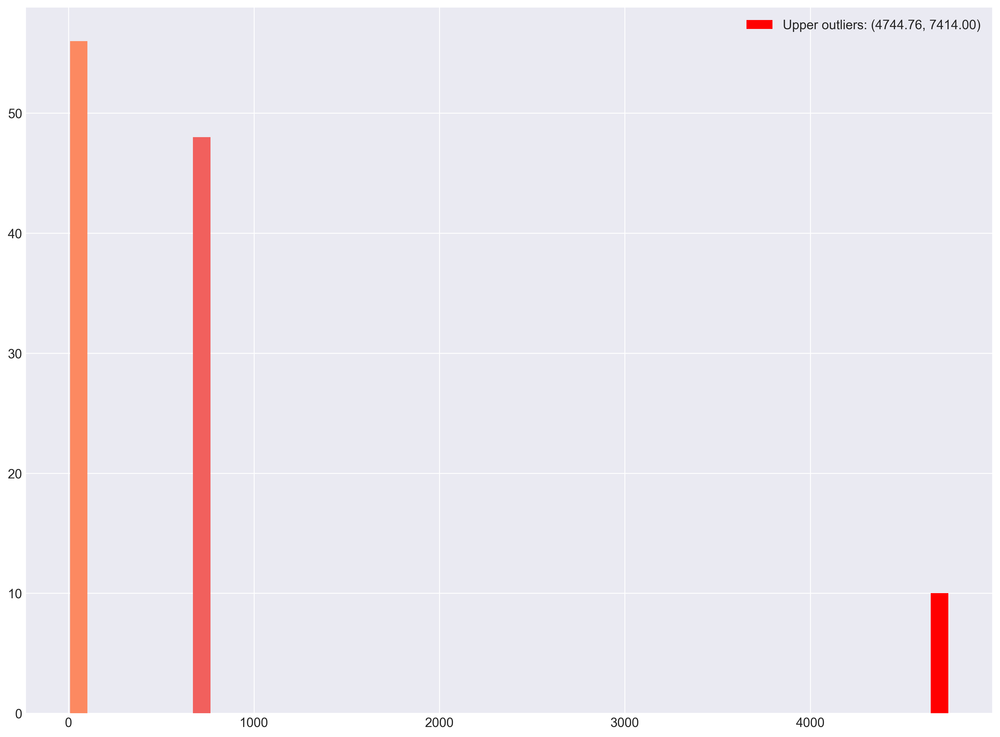

In [100]:
amsterdamumcdb.outliers_histogram(data=pH.loc[(pH['value'] > 7.68), 'value'].dropna()).show()

In [101]:
#remove extreme outliers, most likely data entry errors (manual_entry = True)
pH.loc[(pH['value'] < 6.8) & (pH['manual_entry'] == True), 'value'] = np.NaN
pH.loc[(pH['value'] > 7.6) & (pH['manual_entry'] == True), 'value'] = np.NaN
pH = pH.dropna(subset=['value'])

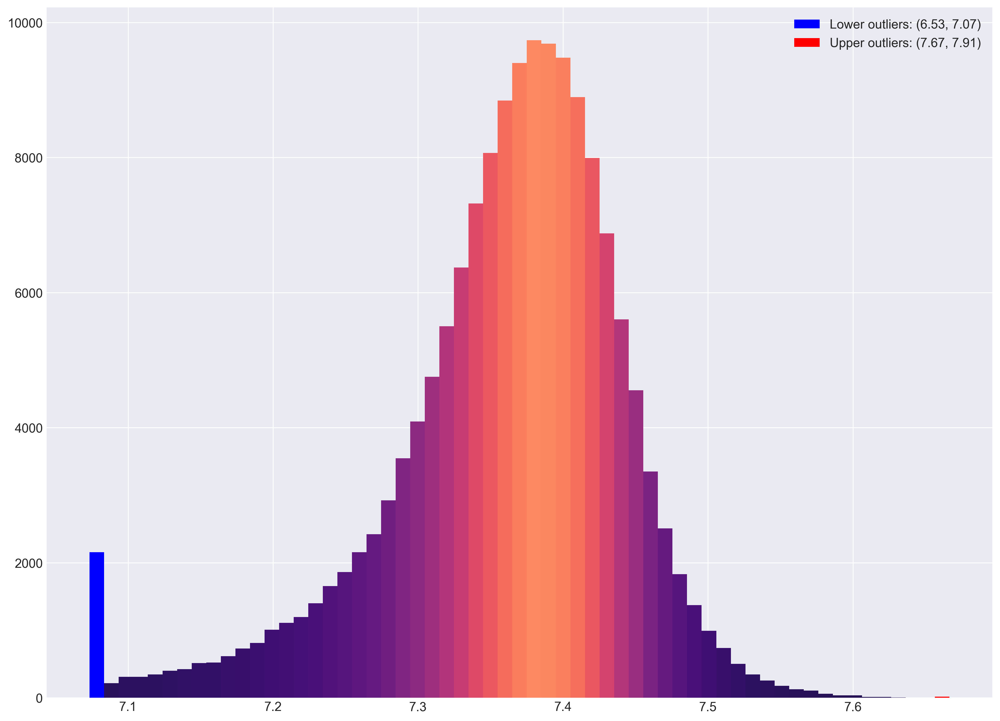

In [102]:
amsterdamumcdb.outliers_histogram(data=pH['value'].dropna(),bins=59).show()

In [103]:
#calculate the pH score
pH['a2_pH_score'] = 0
pH.loc[(pH['value'] >= 7.7), 'a2_pH_score'] = 4
pH.loc[(pH['value'] >= 7.6) & (pH['value'] < 7.7), 'a2_pH_score'] = 3
pH.loc[(pH['value'] >= 7.5) & (pH['value'] < 7.6), 'a2_pH_score'] = 1
pH.loc[(pH['value'] >= 7.33) & (pH['value'] < 7.5), 'a2_pH_score'] = 0
pH.loc[(pH['value'] >= 7.25) & (pH['value'] < 7.33), 'a2_pH_score'] = 2
pH.loc[(pH['value'] >= 7.15) & (pH['value'] < 7.25), 'a2_pH_score'] = 3
pH.loc[(pH['value'] < 7.15), 'a2_pH_score'] = 4

#### APACHE II: Serum sodium (mmol/l)

In [104]:
# APACHE II: Serum sodium (mmol/l) - possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('(^|(?<=\W))na(trium)?($|(?=\W))', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
85,6840,Natrium,97,mmol/l
134,7848,Natrium in urine,97,mmol/l
254,9555,Natrium Astrup,97,mmol/l
353,9924,Natrium (bloed),97,mmol/l
354,9926,NATRIUM (overig),97,mmol/l
475,10178,Tijd Na Pr. (semen),4,min
476,10179,Vervl.Na (semen),4,min
507,10269,Natrium (urine),97,mmol/l
508,10270,Natrium (verz. urine),97,mmol/l
522,10284,Na (onv.ISE) (bloed),97,mmol/l


In [105]:
#get serum Na
sql_sodium = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    n.registeredby,
    CASE 
        WHEN n.registeredby NOT ILIKE '%Systeem%' THEN TRUE
        ELSE FALSE
    END AS manual_entry,
    (n.measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
    n.admissionid = a.admissionid
WHERE n.itemid IN (
    6840, --Natrium
    9555, --Natrium Astrup
    9924, --Natrium (bloed)
    10284 --Na (onv.ISE) (bloed)
    )
--measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
AND (n.measuredat - a.admittedat) <= 1000*60*60*24 AND (n.measuredat - a.admittedat) >= -(1000*60*30)    
"""
sodium = pd.read_sql(sql_sodium, con)
sodium.head()

,admissionid,itemid,item,value,registeredby,manual_entry,time
0,12,6840,Natrium,139.0,ICV_Medisch,True,15
1,12,6840,Natrium,141.0,ICV_IC-Verpleegkundig,True,375
2,43,6840,Natrium,139.0,ICV_Medisch,True,50
3,43,6840,Natrium,143.0,ICV_IC-Verpleegkundig,True,830
4,102,6840,Natrium,138.0,ICV_Medisch,True,60


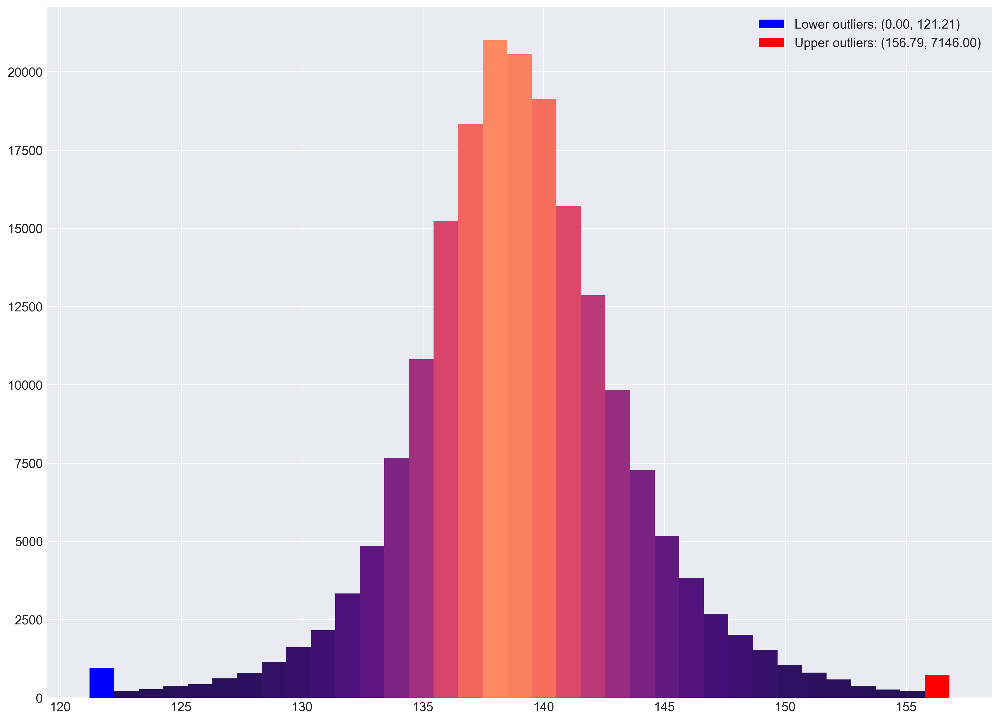

In [106]:
amsterdamumcdb.outliers_histogram(data=sodium['value'], bins=35).show()

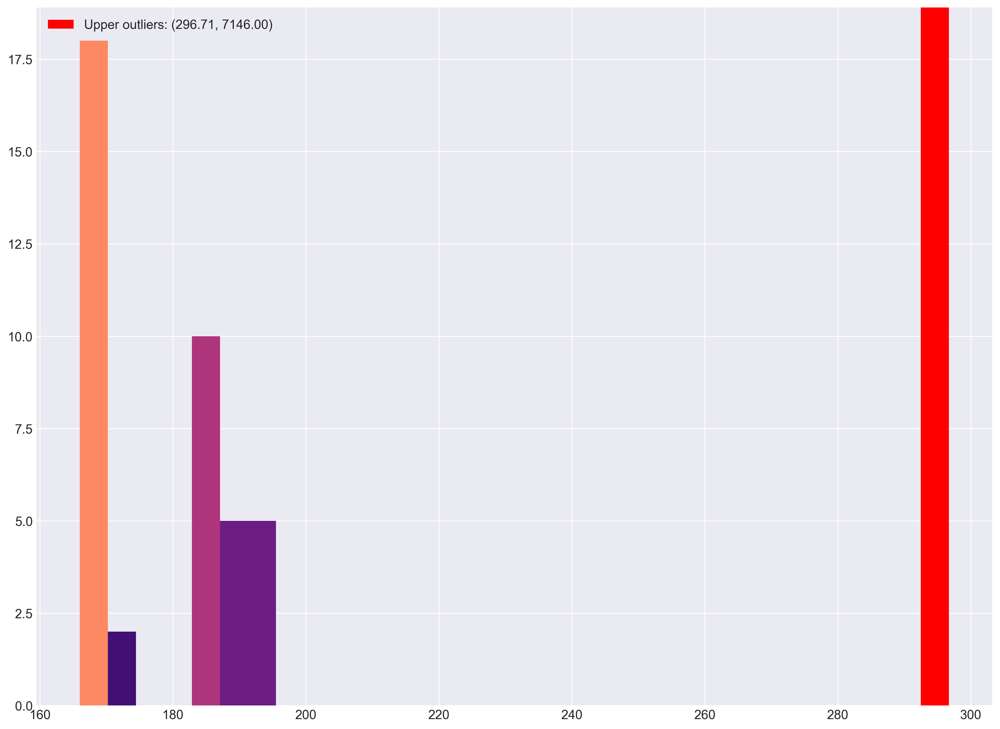

In [107]:
amsterdamumcdb.outliers_histogram(data=sodium.loc[(sodium['value'] > 165) & (sodium['manual_entry'] == True), 'value']).show()

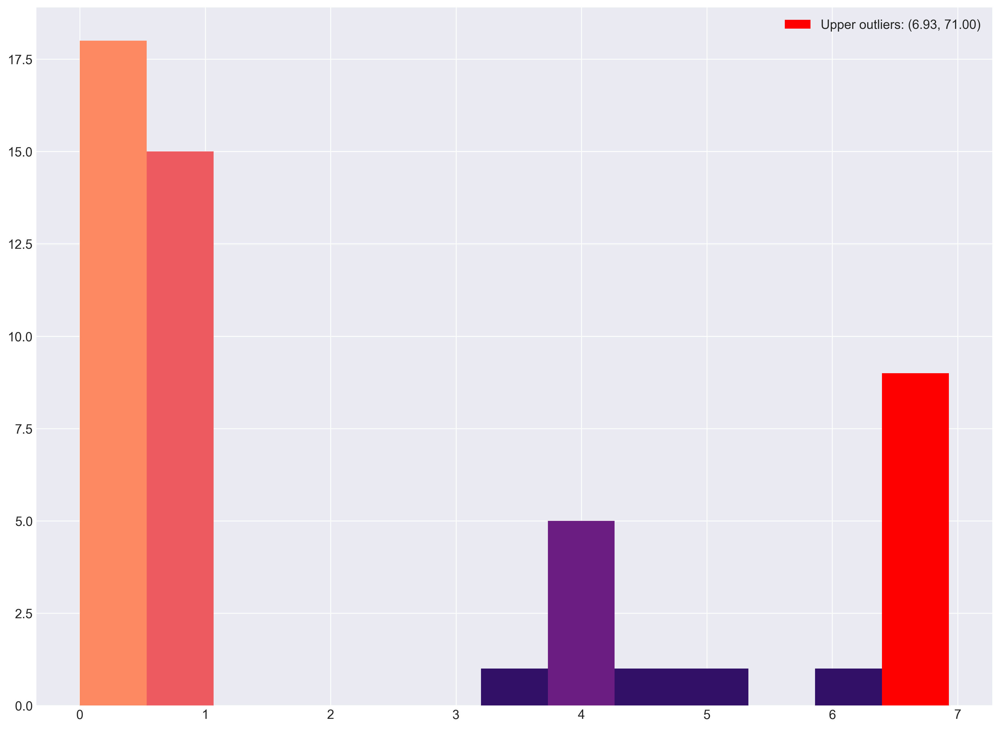

In [108]:
amsterdamumcdb.outliers_histogram(data=sodium.loc[(sodium['value'] < 95) & (sodium['manual_entry'] == True), 'value']).show()

In [109]:
#remove extreme outliers, most likely data entry errors (manual_entry = True)
sodium.loc[(sodium['value'] > 165) & (sodium['manual_entry'] == True), 'value'] = np.NaN
sodium.loc[(sodium['value'] < 95) & (sodium['manual_entry'] == True), 'value'] = np.NaN
sodium = sodium.dropna()

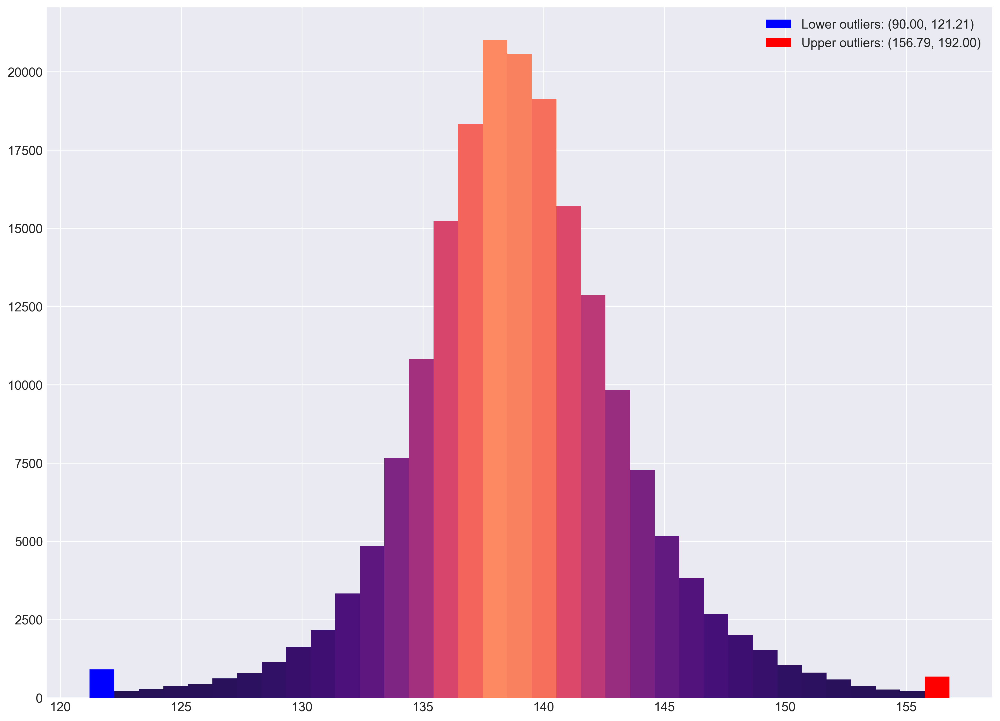

In [110]:
#amsterdamumcdb.outliers_histogram(data=sodium.loc[sodium['manual_entry'] == False, 'value']).show()
amsterdamumcdb.outliers_histogram(data=sodium['value'], bins=35).show()

In [111]:
#calculate the sodium score
sodium['a2_sodium_score'] = 0
sodium.loc[(sodium['value'] >= 180), 'a2_sodium_score'] = 4
sodium.loc[(sodium['value'] >= 160) & (sodium['value'] < 180), 'a2_sodium_score'] = 3
sodium.loc[(sodium['value'] >= 155) & (sodium['value'] < 160), 'a2_sodium_score'] = 2
sodium.loc[(sodium['value'] >= 150) & (sodium['value'] < 155), 'a2_sodium_score'] = 1
sodium.loc[(sodium['value'] >= 130) & (sodium['value'] < 150), 'a2_sodium_score'] = 0
sodium.loc[(sodium['value'] >= 120) & (sodium['value'] < 129), 'a2_sodium_score'] = 2
sodium.loc[(sodium['value'] > 111) & (sodium['value'] < 120), 'a2_sodium_score'] = 3
sodium.loc[(sodium['value'] <= 110), 'a2_sodium_score'] = 4

#### APACHE II: Serum potassium (mmol/l)

In [112]:
# APACHE II: Serum potassium (mmol/l) - possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('(^|(?<=\W))K(alium)?($|(?=\W))', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
80,6835,Kalium,97,mmol/l
109,7101,Kalium in urine,97,mmol/l
255,9556,Kalium Astrup,97,mmol/l
355,9927,Kalium (bloed),97,mmol/l
356,9929,Kalium (overig),97,mmol/l
509,10271,Kalium (urine),97,mmol/l
510,10272,Kalium (verz. urine),97,mmol/l
523,10285,K (onv.ISE) (bloed),97,mmol/l
545,10337,Kalium (faeces),97,mmol/l
859,12228,Kalium (verz. urine),316,mmol/24uur


In [113]:
#get serum K
sql_potassium = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    n.registeredby,
    CASE 
        WHEN n.registeredby NOT ILIKE '%Systeem%' THEN TRUE
        ELSE FALSE
    END AS manual_entry,
    (n.measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
    n.admissionid = a.admissionid
WHERE n.itemid IN (
    6835, --Kalium mmol/l
    9556, --Kalium Astrup mmol/l
    9927, --Kalium (bloed) mmol/l
    10285 --K (onv.ISE) (bloed) mmol/l
    )
--measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
AND (n.measuredat - a.admittedat) <= 1000*60*60*24 AND (n.measuredat - a.admittedat) >= -(1000*60*30)    
"""
potassium = pd.read_sql(sql_potassium, con)
potassium.head()

,admissionid,itemid,item,value,registeredby,manual_entry,time
0,12,6835,Kalium,3.9,ICV_IC-Verpleegkundig,True,375
1,12,6835,Kalium,4.1,ICV_Medisch,True,15
2,43,6835,Kalium,3.8,ICV_IC-Verpleegkundig,True,830
3,43,6835,Kalium,3.9,ICV_Medisch,True,50
4,102,6835,Kalium,3.6,ICV_Medisch,True,60


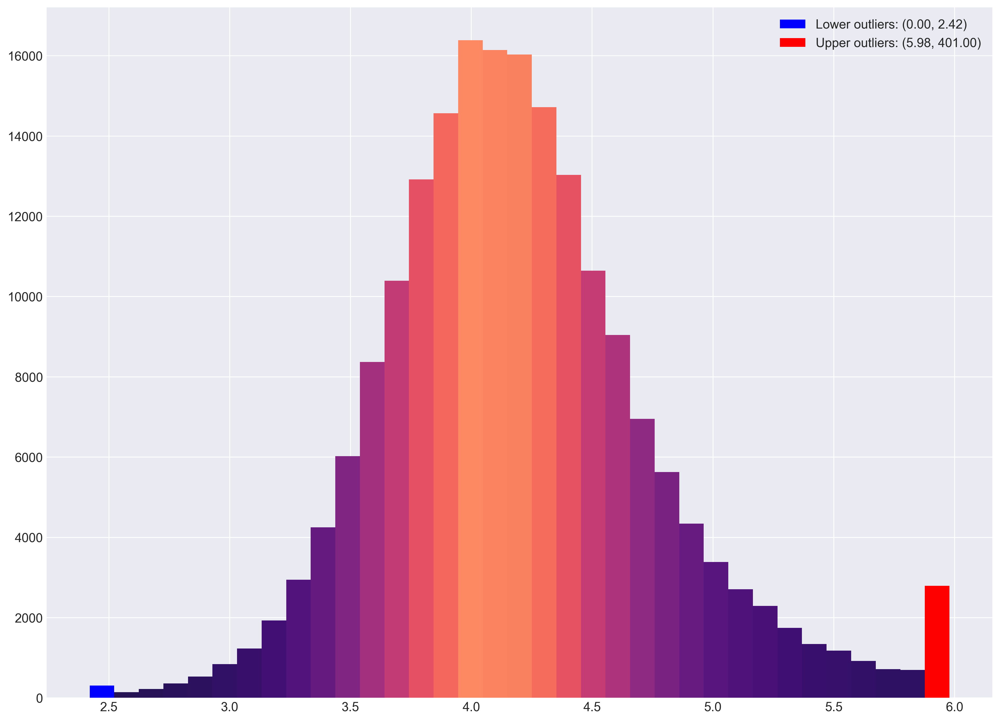

In [114]:
amsterdamumcdb.outliers_histogram(data=potassium['value'], bins=35).show()

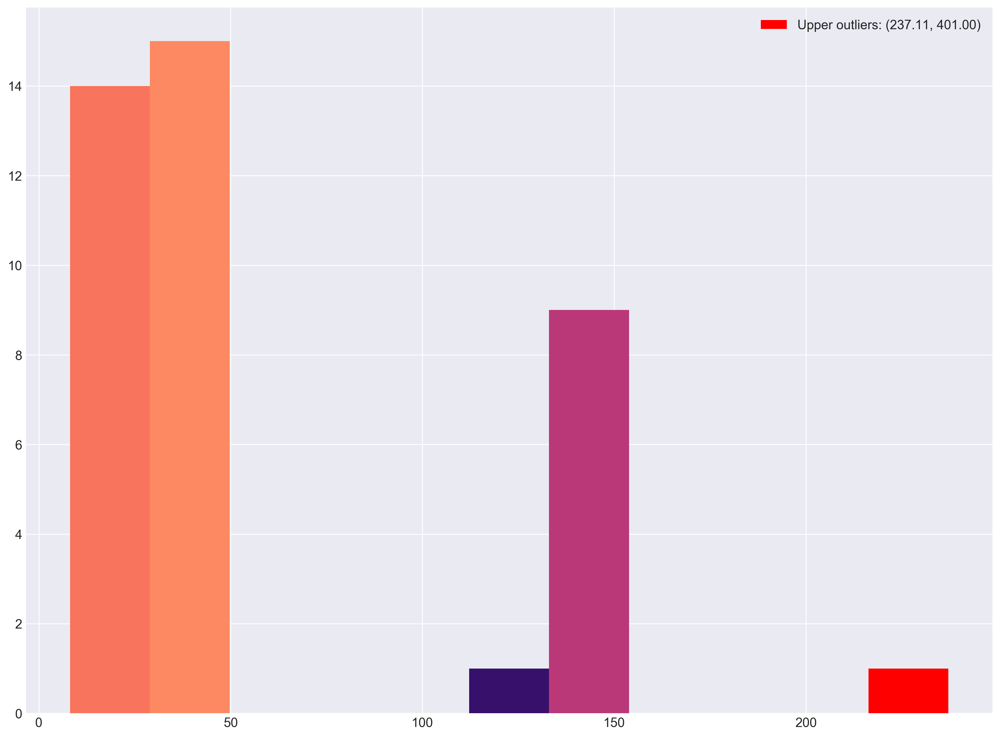

In [115]:
amsterdamumcdb.outliers_histogram(data=potassium.loc[(potassium['value'] > 8) & (potassium['manual_entry'] == True), 'value']).show()

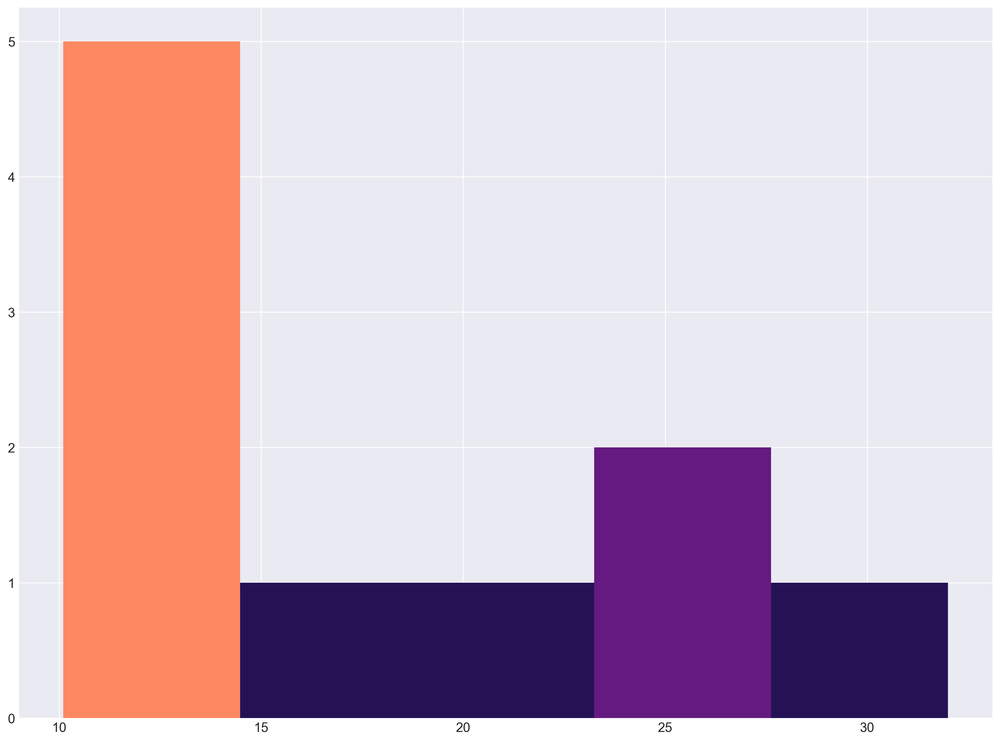

In [116]:
#most likely sample collected from/near potossium i.v. line
amsterdamumcdb.outliers_histogram(data=potassium.loc[(potassium['value'] > 10) & (potassium['manual_entry'] == False), 'value']).show()

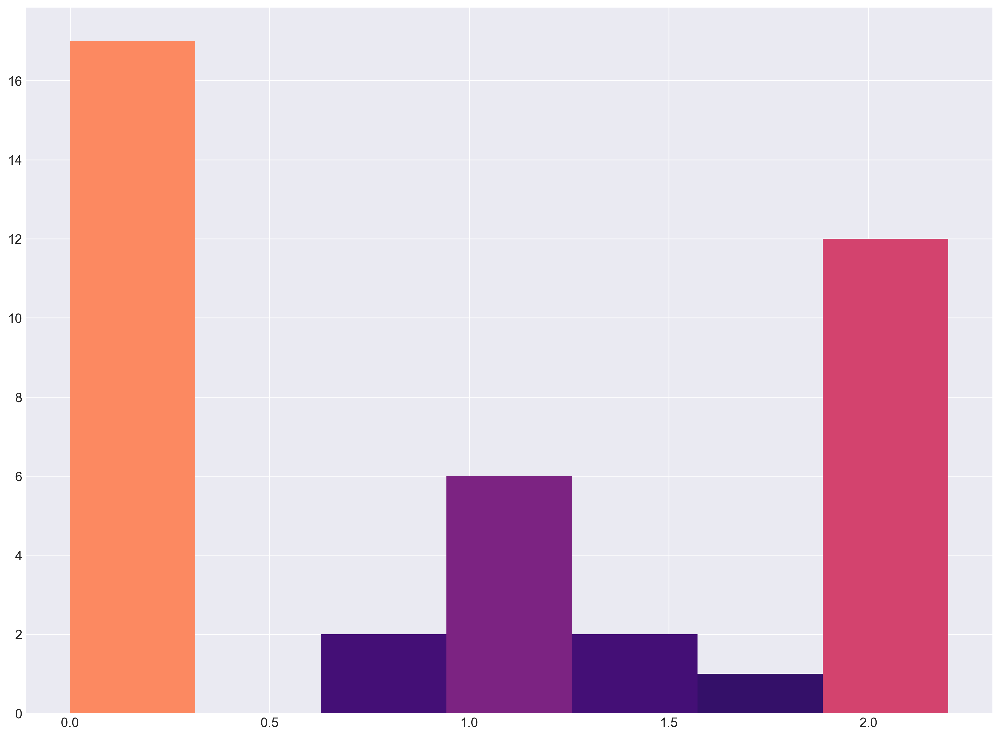

In [117]:
amsterdamumcdb.outliers_histogram(data=potassium.loc[(potassium['value'] <= 2.2) & (potassium['manual_entry'] == True), 'value']).show()

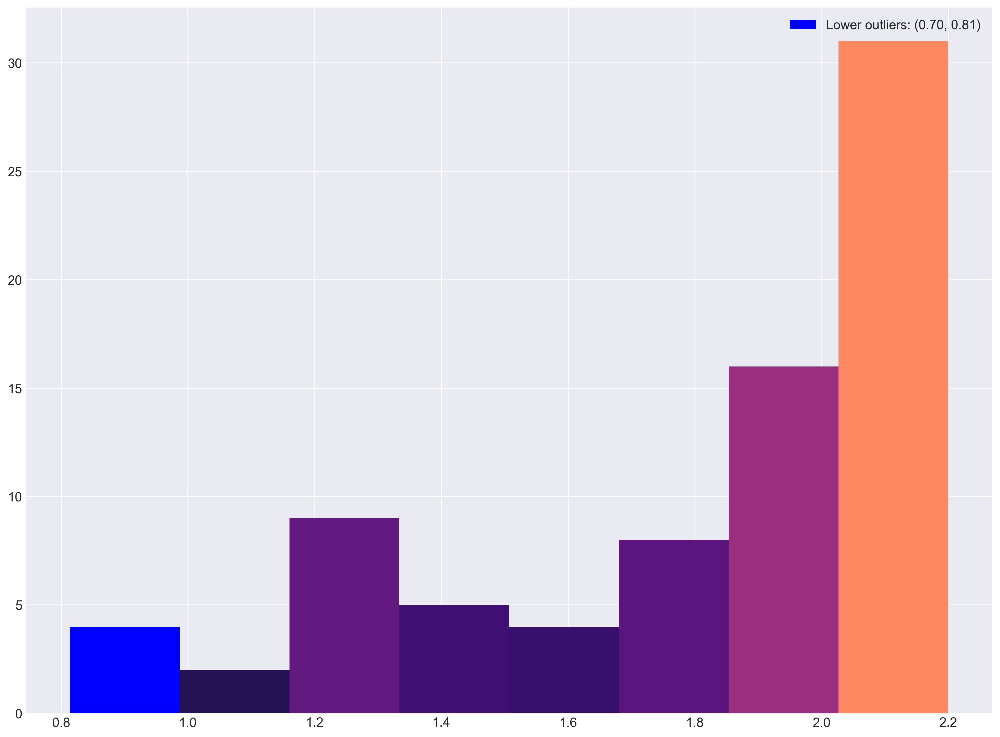

In [118]:
#most likely sample collected from/near i.v. line 
amsterdamumcdb.outliers_histogram(data=potassium.loc[(potassium['value'] <= 2.2) & (potassium['manual_entry'] == False), 'value']).show()

In [119]:
#looking at the data it's relevatively easy to spot most lab collection errors (i.e. single outliers between relatively 
# normal values
# TO DO: algorithm to remove these errors, but not 'real' outliers
potassium.loc[potassium['admissionid'].isin(
    potassium.loc[(potassium['value'] <= 2.2) & (potassium['manual_entry'] == False), 'admissionid'])
             ].sort_values(by='admissionid').head()

#just remove all outliers <= 2.2. for APACHE II

,admissionid,itemid,item,value,registeredby,manual_entry,time
8562,165,9927,Kalium (bloed),2.3,Systeem,False,985
8563,165,9927,Kalium (bloed),2.4,Systeem,False,668
8564,165,9927,Kalium (bloed),2.6,Systeem,False,1132
8565,165,9927,Kalium (bloed),3.2,Systeem,False,1262
8566,165,9927,Kalium (bloed),3.3,Systeem,False,424


In [120]:
#remove extreme outliers, most likely data entry errors (manual_entry = True)
potassium.loc[(potassium['value'] > 8) & (potassium['manual_entry'] == True), 'value'] = np.NaN
potassium.loc[(potassium['value'] < 2) & (potassium['manual_entry'] == True), 'value'] = np.NaN
potassium.loc[(potassium['value'] <= 2.2) & (potassium['manual_entry'] == False), 'value'] = np.NaN
potassium.loc[(potassium['value'] > 10) & (potassium['manual_entry'] == False), 'value'] = np.NaN
potassium = potassium.dropna()

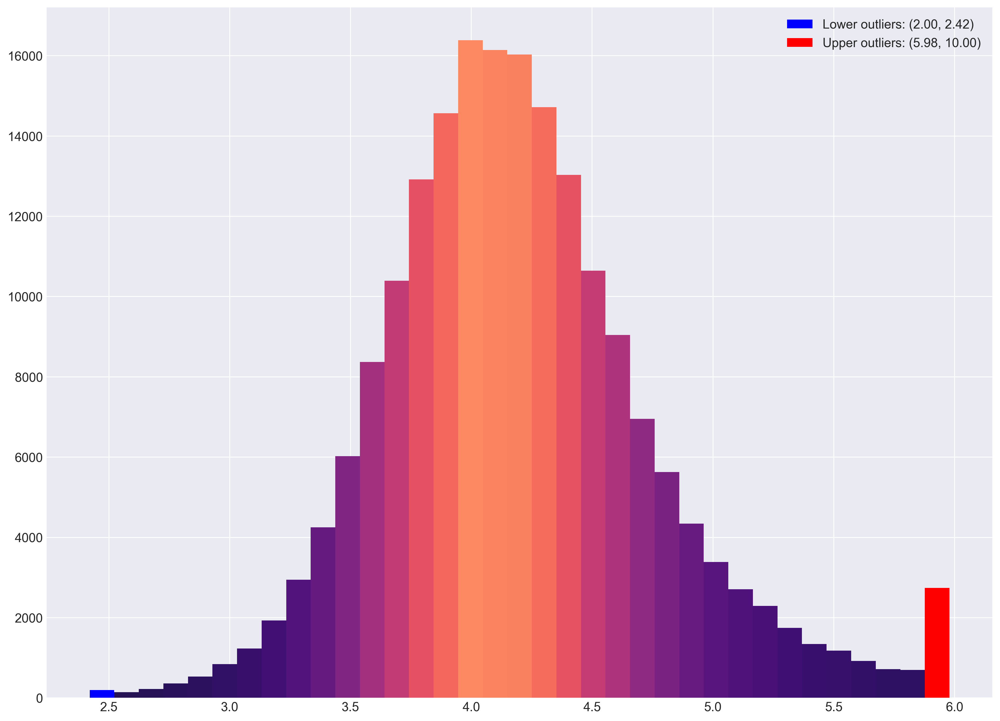

In [121]:
#amsterdamumcdb.outliers_histogram(data=potassium.loc[potassium['manual_entry'] == False, 'value']).show()
amsterdamumcdb.outliers_histogram(data=potassium['value'], bins=35).show()

In [122]:
#calculate the potassium score
potassium['a2_potassium_score'] = 0
potassium.loc[(potassium['value'] >= 7), 'a2_potassium_score'] = 4
potassium.loc[(potassium['value'] >= 6) & (potassium['value'] < 7), 'a2_potassium_score'] = 3
potassium.loc[(potassium['value'] >= 5.5) & (potassium['value'] < 6), 'a2_potassium_score'] = 1
potassium.loc[(potassium['value'] >= 3.5) & (potassium['value'] < 5.5), 'a2_potassium_score'] = 0
potassium.loc[(potassium['value'] >= 3) & (potassium['value'] < 3.5), 'a2_potassium_score'] = 1
potassium.loc[(potassium['value'] >= 2.5) & (potassium['value'] < 3), 'a2_potassium_score'] = 2
potassium.loc[(potassium['value'] < 2.5), 'a2_potassium_score'] = 4

#### APACHE II: Serum creatinine (mg/100 ml)

In [123]:
# APACHE II: Serum creatinine (mg/100 ml) - possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('(^|(?<=\W))(k|c)?reat(inin)?(e)?($|(?=\W))', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
81,6836,Kreatinine,56,µmol
110,7108,Kreatinine klaring,24,ml/min
111,7109,Kreatinine in urine,97,mmol/l
366,9941,Kreatinine (bloed),99,µmol/l
367,9942,Kreatinine (Jaffé) (overig),99,µmol/l
517,10279,Kreatinine (urine),97,mmol/l
770,11900,Kreat.klaring (urine),24,ml/min
771,11901,KREAT.KLAR (verz. urine),24,ml/min
848,12191,Kreatinine (Jaffé) (overig),97,mmol/l
849,12192,Kreatinine (verz. urine),97,mmol/l


In [124]:
#get serum creatinine
sql_creatinine = """
WITH baseline AS (
    SELECT n.admissionid,
    MIN(n.value) AS baseline_creatinine
    FROM numericitems n
    LEFT JOIN admissions a ON
        n.admissionid = a.admissionid
    WHERE itemid IN (
        6836, --Kreatinine µmol/l (erroneously documented as µmol)
        9941, --Kreatinine (bloed) µmol/l
        14216 --KREAT enzym. (bloed) µmol/l
    ) AND
    --search 1 year befor admission
    (n.measuredat - a.admittedat)/(60*60*1000) > -(365*24) AND (n.measuredat - a.admittedat) < (24*60*60*1000)
    GROUP BY n.admissionid
),
max_creat AS (
    SELECT n.admissionid,
    MAX(n.value) AS max_creatinine_7days
    FROM numericitems n
    LEFT JOIN admissions a ON
        n.admissionid = a.admissionid
    WHERE itemid IN (
        6836, --Kreatinine µmol/l (erroneously documented as µmol)
        9941, --Kreatinine (bloed) µmol/l
        14216 --KREAT enzym. (bloed) µmol/l
    ) AND
    --within 7 days of admission
    (n.measuredat - a.admittedat) > 0 AND (n.measuredat - a.admittedat) < (7*24*60*60*1000)
    GROUP BY n.admissionid
)
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    n.registeredby,
    CASE 
        WHEN n.registeredby NOT ILIKE '%Systeem%' THEN TRUE
        ELSE FALSE
    END AS manual_entry,
    (n.measuredat - a.admittedat)/(1000*60) AS time,
    b.baseline_creatinine,
    m.max_creatinine_7days,
    CASE
        -- AKI definition: 3 fold increase:
        WHEN baseline_creatinine > 0 AND m.max_creatinine_7days/baseline_creatinine > 3 THEN TRUE
        -- AKI definition: increase to >= 354 umol/l AND at least 44 umol/l increase:
        WHEN max_creatinine_7days >= 354 AND max_creatinine_7days - baseline_creatinine >= 44 THEN TRUE 
        ELSE FALSE
    END AS acute_renal_failure
FROM numericitems n
LEFT JOIN admissions a ON
    n.admissionid = a.admissionid
LEFT JOIN baseline b ON -- get the baseline kreat (before admission)
    n.admissionid = b.admissionid
LEFT JOIN max_creat m ON --get the highest within a week of admission
    n.admissionid = m.admissionid
WHERE n.itemid IN (
    6836, --Kreatinine µmol/l (erroneously documented as µmol)
    9941, --Kreatinine (bloed) µmol/l
    14216 --KREAT enzym. (bloed) µmol/l
    )
-- measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
AND (n.measuredat - a.admittedat) <= 1000*60*60*24 AND (n.measuredat - a.admittedat) >= -(1000*60*30)
"""
creatinine = pd.read_sql(sql_creatinine, con)
creatinine.head()

,admissionid,itemid,item,value,registeredby,manual_entry,time,baseline_creatinine,max_creatinine_7days,acute_renal_failure
0,12,6836,Kreatinine,77.0,ICV_Medisch,True,15,77.0,77.0,False
1,43,6836,Kreatinine,66.0,ICV_IC-Verpleegkundig,True,830,66.0,70.0,False
2,43,6836,Kreatinine,70.0,ICV_Medisch,True,50,66.0,70.0,False
3,102,6836,Kreatinine,84.0,ICV_Medisch,True,60,84.0,84.0,False
4,130,6836,Kreatinine,106.0,ICV_Medisch,True,121,106.0,106.0,False


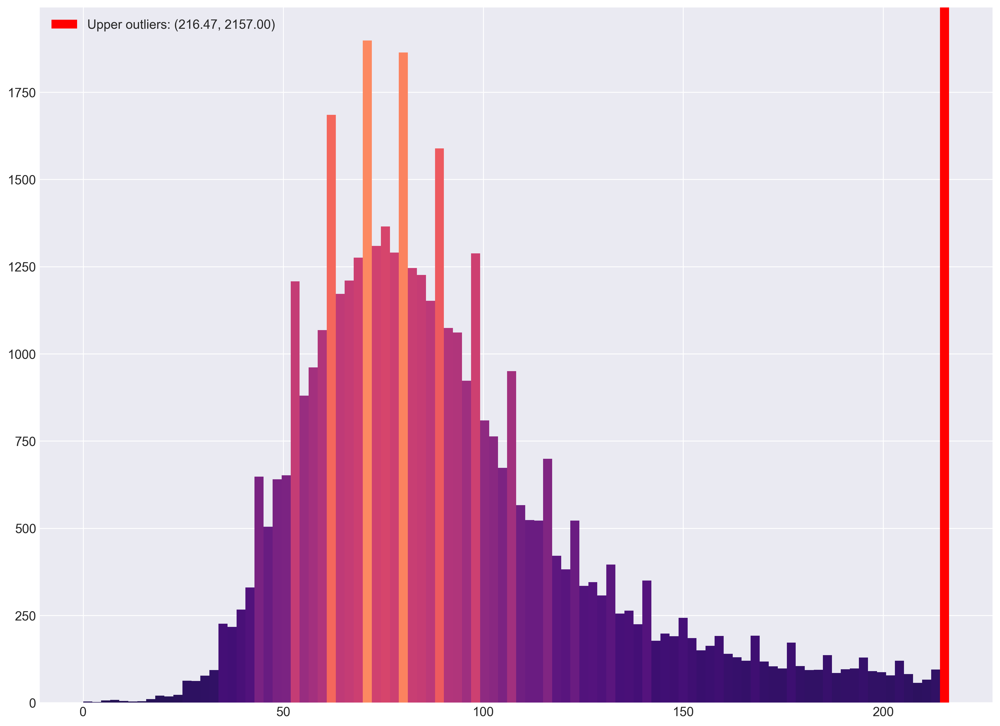

In [125]:
amsterdamumcdb.outliers_histogram(data=creatinine['value']).show()

In [126]:
#looking at the data it's relevatively easy to spot most lab collection errors (i.e. single outliers between relatively 
# normal values
# TO DO: algorithm to remove these errors, but not 'real' outliers
creatinine.loc[creatinine['admissionid'].isin(
    creatinine.loc[(creatinine['value']> 1000) & (creatinine['manual_entry'] == True), 'admissionid'])
             ].sort_values(by='admissionid')

,admissionid,itemid,item,value,registeredby,manual_entry,time,baseline_creatinine,max_creatinine_7days,acute_renal_failure
421,5819,6836,Kreatinine,385.0,ICV_Medisch Staflid,True,1392,385.0,1013.0,True
422,5819,6836,Kreatinine,680.0,ICV_IC-Verpleegkundig,True,672,385.0,1013.0,True
423,5819,6836,Kreatinine,1013.0,ICV_IC-Verpleegkundig,True,12,385.0,1013.0,True
16717,7637,9941,Kreatinine (bloed),1078.0,Systeem,False,1111,1078.0,2157.0,True
16718,7637,9941,Kreatinine (bloed),1144.0,Systeem,False,718,1078.0,2157.0,True
16719,7637,9941,Kreatinine (bloed),1720.0,Systeem,False,156,1078.0,2157.0,True
16720,7637,9941,Kreatinine (bloed),2157.0,ICV_Medisch Staflid,True,1,1078.0,2157.0,True
27746,13151,9941,Kreatinine (bloed),1291.0,Systeem,False,70,1291.0,1355.0,True
27747,13151,9941,Kreatinine (bloed),1355.0,ICV_IC-Verpleegkundig,True,409,1291.0,1355.0,True


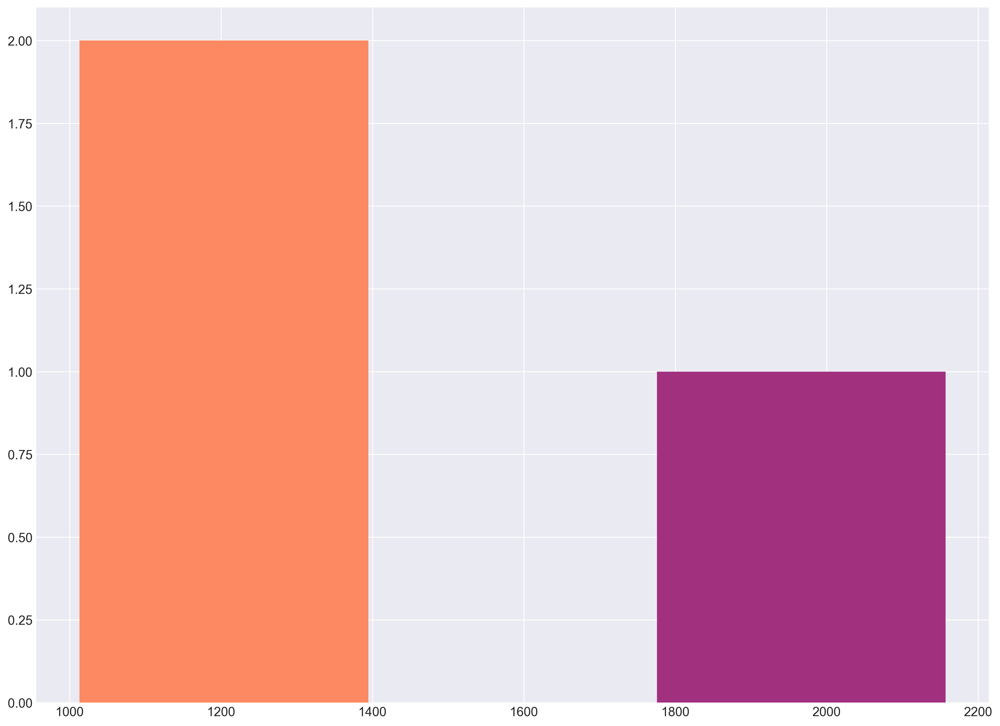

In [127]:
amsterdamumcdb.outliers_histogram(data=creatinine.loc[(creatinine['value'] > 1000) & (creatinine['manual_entry'] == True), 'value']).show()

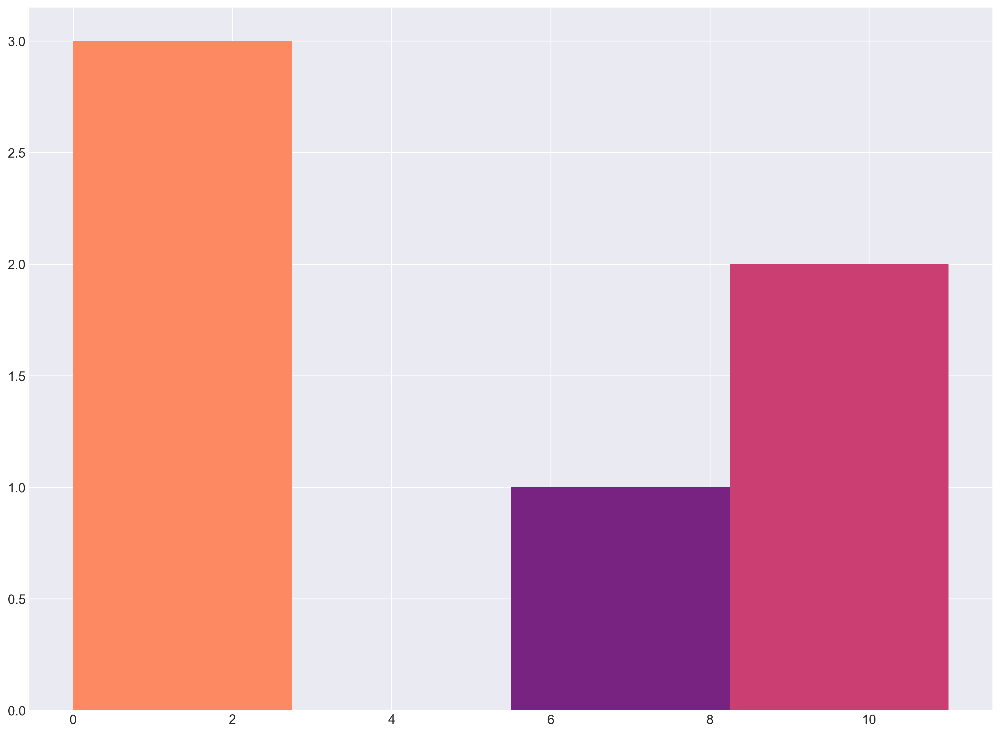

In [128]:
amsterdamumcdb.outliers_histogram(data=creatinine.loc[(creatinine['value'] < 30) & (creatinine['manual_entry'] == True), 'value']).show()

In [129]:
#looking at the data it's relevatively easy to spot most lab collection errors (i.e. single outliers between relatively 
# normal values
# TO DO: algorithm to remove these errors, but not 'real' outliers
creatinine.loc[creatinine['admissionid'].isin(
    creatinine.loc[(creatinine['value'] < 30) & (creatinine['manual_entry'] == True), 'admissionid'])
             ].sort_values(by='admissionid')

,admissionid,itemid,item,value,registeredby,manual_entry,time,baseline_creatinine,max_creatinine_7days,acute_renal_failure
523,7132,6836,Kreatinine,0.0,ICV_IC-Verpleegkundig,True,514,0.0,113.0,False
524,7132,6836,Kreatinine,107.0,ICV_Medisch,True,875,0.0,113.0,False
525,7132,6836,Kreatinine,113.0,ICV_IC-Verpleegkundig,True,275,0.0,113.0,False
1008,13794,6836,Kreatinine,11.0,ICV_IC-Verpleegkundig,True,949,11.0,118.0,True
1009,13794,6836,Kreatinine,112.0,ICV_IC-Verpleegkundig,True,649,11.0,118.0,True
1010,13794,6836,Kreatinine,113.0,ICV_IC-Verpleegkundig,True,109,11.0,118.0,True
32604,15626,9941,Kreatinine (bloed),219.0,Systeem,False,144,0.0,330.0,False
32605,15626,9941,Kreatinine (bloed),330.0,Systeem,False,1091,0.0,330.0,False
1156,15626,6836,Kreatinine,0.0,ICV_IC-Verpleegkundig,True,191,0.0,330.0,False
1157,15626,6836,Kreatinine,219.0,ICV_IC-Verpleegkundig,True,131,0.0,330.0,False


In [130]:
#remove extreme outliers, most likely data entry errors (manual_entry = True)
creatinine.loc[(creatinine['value'] < 30) & (creatinine['manual_entry'] == True), 'value'] = np.NaN
creatinine = creatinine.dropna(subset=['value'])

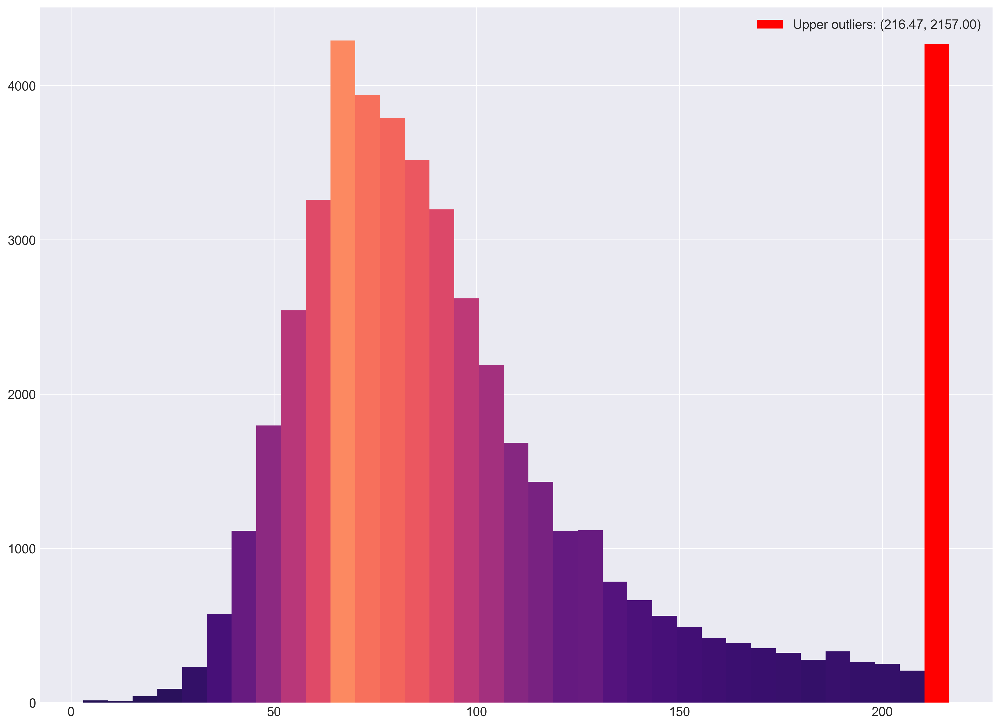

In [131]:
#amsterdamumcdb.outliers_histogram(data=creatinine.loc[creatinine['manual_entry'] == False, 'value']).show()
amsterdamumcdb.outliers_histogram(data=creatinine['value'], bins=35).show()

In [132]:
#conversion umol/l to mg/dl
#creatinine molar mass: 113.120 g·mol−1
creatinine['value_non_si'] = (creatinine['value']/10e6)*(10e3/10)*113.120
creatinine.head()

,admissionid,itemid,item,value,registeredby,manual_entry,time,baseline_creatinine,max_creatinine_7days,acute_renal_failure,value_non_si
0,12,6836,Kreatinine,77.0,ICV_Medisch,True,15,77.0,77.0,False,0.871024
1,43,6836,Kreatinine,66.0,ICV_IC-Verpleegkundig,True,830,66.0,70.0,False,0.746592
2,43,6836,Kreatinine,70.0,ICV_Medisch,True,50,66.0,70.0,False,0.791840
3,102,6836,Kreatinine,84.0,ICV_Medisch,True,60,84.0,84.0,False,0.950208
4,130,6836,Kreatinine,106.0,ICV_Medisch,True,121,106.0,106.0,False,1.199072


In [133]:
#calculate the creatinine score

#if acute renal failure (AKI definition), double the points
creatinine['score_multiplier'] = 1
creatinine.loc[(creatinine['acute_renal_failure'] == True), 'score_multiplier'] = 2

creatinine['a2_creatinine_score'] = 0
creatinine.loc[(creatinine['value_non_si'] >= 3.5), 'a2_creatinine_score'] = 4 * creatinine['score_multiplier']
creatinine.loc[(creatinine['value_non_si'] >= 2) & (creatinine['value_non_si'] < 3.5), 'a2_creatinine_score'] = 3 * creatinine['score_multiplier']
creatinine.loc[(creatinine['value_non_si'] >= 1.5) & (creatinine['value_non_si'] < 2), 'a2_creatinine_score'] = 2 * creatinine['score_multiplier']
creatinine.loc[(creatinine['value_non_si'] >= 0.6) & (creatinine['value_non_si'] < 1.5), 'a2_creatinine_score'] = 0
creatinine.loc[(creatinine['value_non_si'] < 0.6), 'a2_creatinine_score'] = 2 * creatinine['score_multiplier']

#### APACHE II: Hematocrit (%)

In [134]:
# APACHE II: Hematocrit (%) - possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('(^|(?<=\W))(k|c)?H((a)?ematocri(e)?)?t($|(?=\W))',
                                                               flags=re.IGNORECASE)]

,itemid,item,unitid,unit
43,6777,Hematocriet,8,l
591,11423,Ht (bloed),191,Geen
608,11545,Ht(v.Bgs) (bloed),191,Geen
615,11559,Ht (overig),191,Geen
1475,18861,Ht pleuravocht (pleurapunct.),191,Geen
1654,20661,ECMO - Ht,191,Geen


In [135]:
#get hematocrit
sql_ht = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    n.registeredby,
    CASE 
        WHEN n.registeredby NOT ILIKE '%Systeem%' THEN TRUE
        ELSE FALSE
    END AS manual_entry,
    (n.measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
    n.admissionid = a.admissionid
WHERE n.itemid IN (
    6777, --Hematocriet
    11423, --Ht (bloed)
    11545 --Ht(v.Bgs) (bloed)
    )
-- measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
AND (n.measuredat - a.admittedat) <= 1000*60*60*24 AND (n.measuredat - a.admittedat) >= -(1000*60*30)    
 
"""
ht = pd.read_sql(sql_ht, con)
ht.head()

,admissionid,itemid,item,value,registeredby,manual_entry,time
0,12,6777,Hematocriet,0.26,ICV_IC-Verpleegkundig,True,375
1,12,6777,Hematocriet,0.27,ICV_Medisch,True,15
2,12,6777,Hematocriet,0.27,ICV_Medisch,True,75
3,43,6777,Hematocriet,0.23,ICV_Medisch,True,20
4,43,6777,Hematocriet,0.29,ICV_IC-Verpleegkundig,True,830


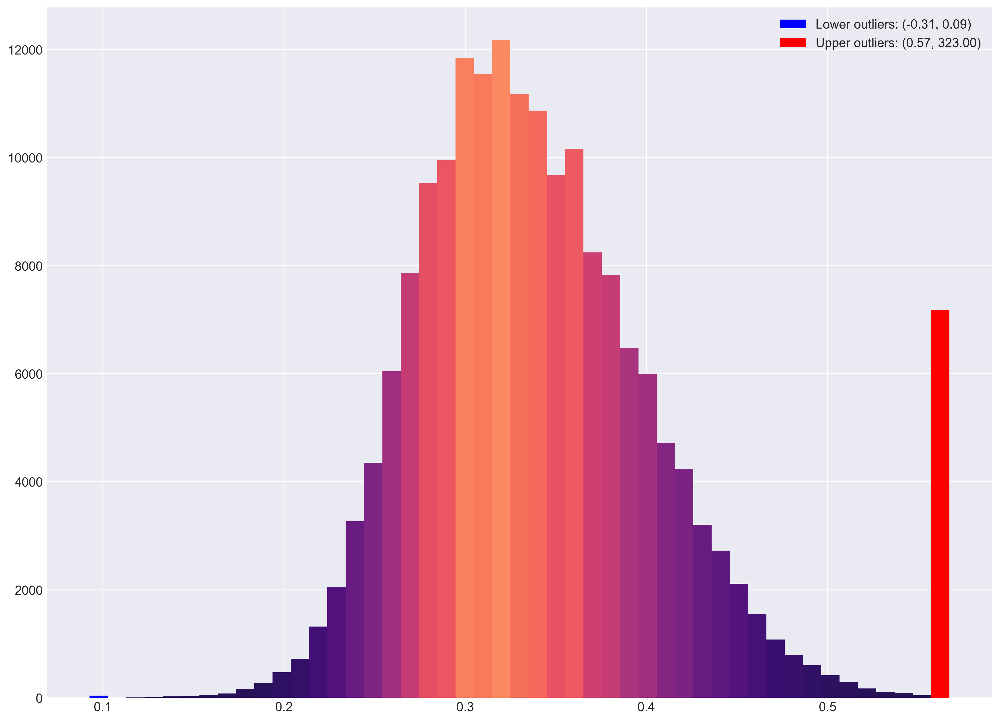

In [136]:
amsterdamumcdb.outliers_histogram(data=ht['value'],bins=47).show()

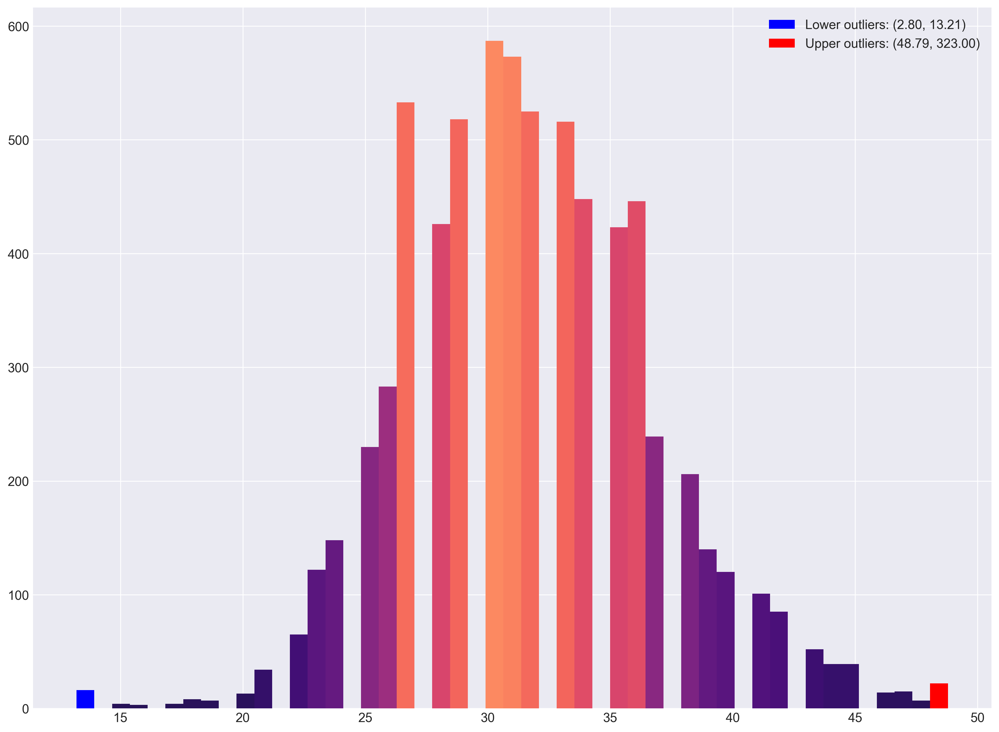

In [137]:
amsterdamumcdb.outliers_histogram(data=ht.loc[(ht['value'] > 1) & (ht['manual_entry'] == True), 'value']).show()

In [138]:
#manually entered values in (0-100%) % instead of fraction (0-1)
ht.loc[(ht['value'] > 1) & (ht['manual_entry'] == True), 'value'] = ht.loc[
    (ht['value'] > 1) & (ht['manual_entry'] == True), 'value']/100

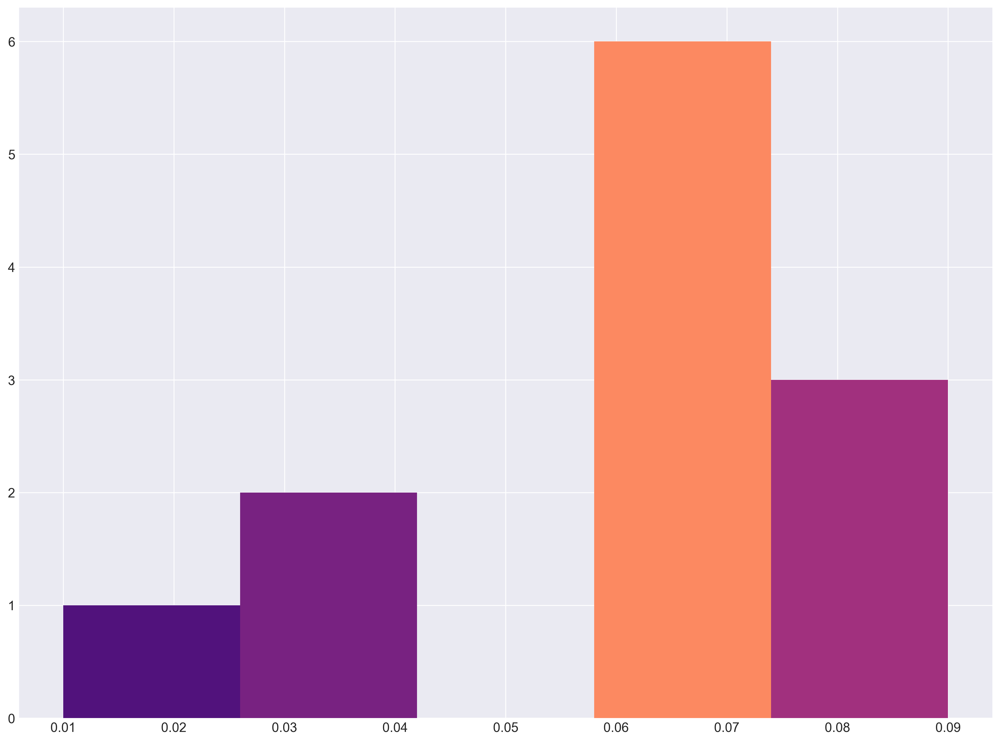

In [139]:
amsterdamumcdb.outliers_histogram(data=ht.loc[(ht['value'] < .1) & (ht['manual_entry'] == False), 'value']).show()

In [140]:
#looking at the data it's relevatively easy to spot most lab collection errors (i.e. single outliers between relatively 
# normal values
# TO DO: algorithm to remove these errors, but not 'real' outliers
ht.loc[ht['admissionid'].isin(
    ht.loc[(ht['value'] < .1) & (ht['manual_entry'] == False), 'admissionid'])
             ].sort_values(by='admissionid').head(5)

,admissionid,itemid,item,value,registeredby,manual_entry,time
4846,920,11423,Ht (bloed),0.06,Systeem,False,192
65037,920,11545,Ht(v.Bgs) (bloed),0.28,Systeem,False,579
4849,920,11423,Ht (bloed),0.29,Systeem,False,505
65038,920,11545,Ht(v.Bgs) (bloed),0.30,Systeem,False,496
4847,920,11423,Ht (bloed),0.20,Systeem,False,405


In [141]:
#looking at the data it's relevatively easy to spot most lab collection errors (i.e. single outliers between relatively 
# normal values
# TO DO: algorithm to remove these errors, but not 'real' outliers
ht.loc[ht['admissionid'].isin(
    ht.loc[(ht['value'] > .67) & (ht['manual_entry'] == False), 'admissionid'])
             ].sort_values(by=['admissionid','time']).head(5)
#amsterdamumcdb.outliers_histogram(data=ht.loc[(ht['value'] > .67) & (ht['value'] < .90) & (ht['manual_entry'] == True), 'value']).show()

,admissionid,itemid,item,value,registeredby,manual_entry,time
70296,1963,11545,Ht(v.Bgs) (bloed),0.26,Systeem,False,151
70294,1963,11545,Ht(v.Bgs) (bloed),0.25,Systeem,False,181
70295,1963,11545,Ht(v.Bgs) (bloed),0.25,Systeem,False,184
70299,1963,11545,Ht(v.Bgs) (bloed),0.80,Systeem,False,190
70297,1963,11545,Ht(v.Bgs) (bloed),0.29,Systeem,False,217


In [142]:
#remove extreme outliers, most likely sample collection error (near transfusion site)
ht.loc[(ht['value'] < .1), 'value'] = np.NaN
ht.loc[(ht['value'] > .67), 'value'] = np.NaN
ht = ht.dropna()

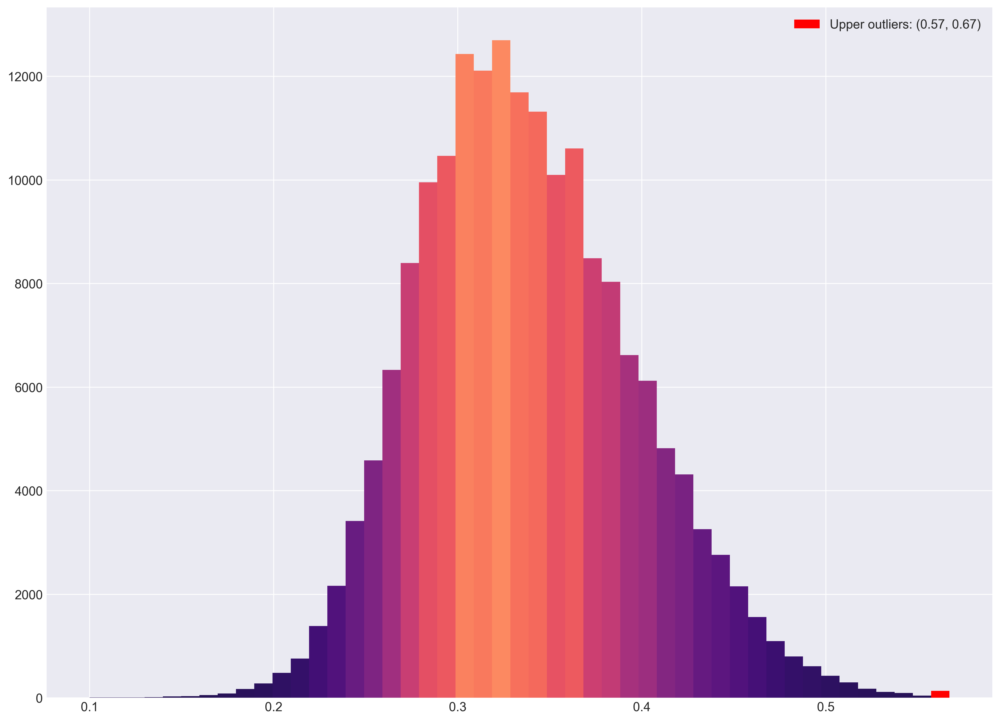

In [143]:
#amsterdamumcdb.outliers_histogram(data=ht.loc[ht['manual_entry'] == False, 'value']).show()
amsterdamumcdb.outliers_histogram(data=ht['value'], bins=47).show()

In [144]:
#calculate the hematocrit score
ht['a2_ht_score'] = 0
ht.loc[(ht['value'] >= 0.60), 'a2_ht_score'] = 4
ht.loc[(ht['value'] >= 0.50) & (ht['value'] < 0.60), 'a2_ht_score'] = 2
ht.loc[(ht['value'] >= 0.46) & (ht['value'] < 0.50), 'a2_ht_score'] = 1
ht.loc[(ht['value'] >= 0.30) & (ht['value'] < 0.46), 'a2_ht_score'] = 0
ht.loc[(ht['value'] >= 0.20) & (ht['value'] < 0.30), 'a2_ht_score'] = 2
ht.loc[(ht['value'] < 0.20), 'a2_ht_score'] = 4

#### APACHE II: White blood count (total/mm3) (in 1000s)

In [145]:
# APACHE II: White blood count (total/mm3) (in 1000s) - possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('(^|(?<=\W))leu(k|c)o(cyt\w|\'s)\w?($|(?=\W))',
                                                               flags=re.IGNORECASE)]

,itemid,item,unitid,unit
45,6779,Leucocyten,101,10^9/l
389,9965,Leuco's (bloed),101,10^9/l
390,9966,Leuco's (overig),101,10^9/l
623,11663,Leuco's/uL (liquor),197,/µl
1375,18442,Leuco's ascitesvocht (ascitesvocht),101,10^9/l
1376,18443,Leuco's dialysaat (dialysaat),101,10^9/l
1377,18444,Leuco's drainvocht (drain),101,10^9/l
1378,18445,Leuco's peritoneaalvocht (perito.vocht capd),101,10^9/l
1379,18446,Leuco's pleuravocht (pleurapunct.),101,10^9/l


In [146]:
#get white blood count
sql_wbc = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    n.registeredby,
    CASE 
        WHEN n.registeredby NOT ILIKE '%Systeem%' THEN TRUE
        ELSE FALSE
    END AS manual_entry,
    (n.measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
    n.admissionid = a.admissionid
WHERE n.itemid IN (
    6779, --Leucocyten 10^9/l
    9965 --Leuco's (bloed) 10^9/l
    )
-- measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
AND (n.measuredat - a.admittedat) <= 1000*60*60*24 AND (n.measuredat - a.admittedat) >= -(1000*60*30)    

"""
wbc = pd.read_sql(sql_wbc, con)
wbc.head()

,admissionid,itemid,item,value,registeredby,manual_entry,time
0,12,6779,Leucocyten,13.7,ICV_IC-Verpleegkundig,True,375
1,43,6779,Leucocyten,9.8,ICV_Medisch,True,20
2,43,6779,Leucocyten,10.6,ICV_IC-Verpleegkundig,True,830
3,102,6779,Leucocyten,8.8,ICV_Medisch,True,60
4,130,6779,Leucocyten,11.5,ICV_Medisch,True,1141


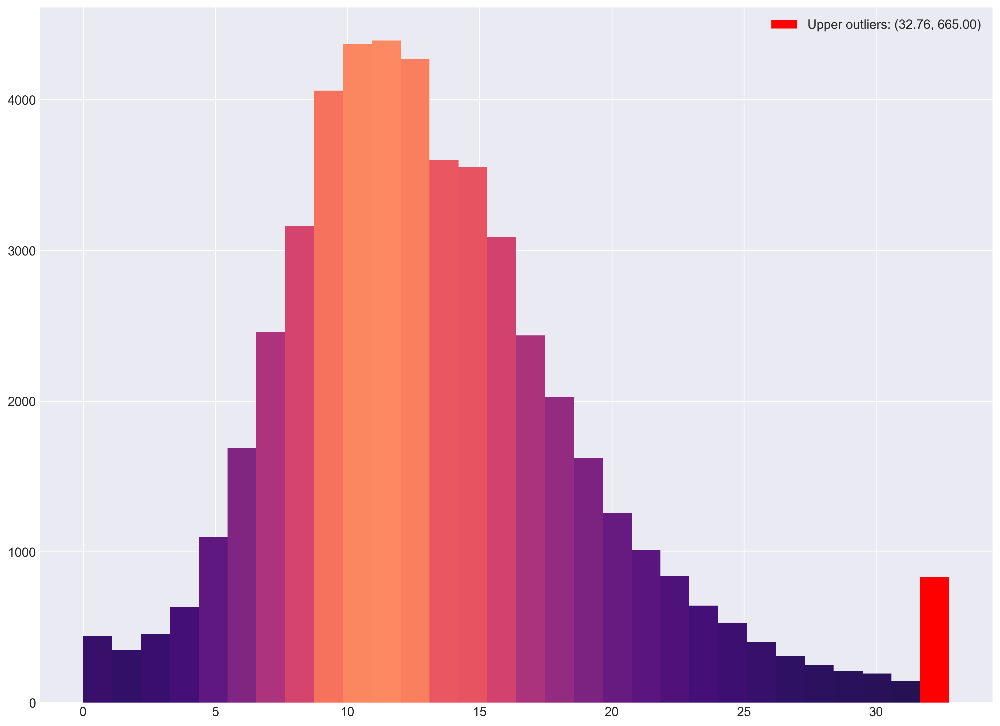

In [147]:
amsterdamumcdb.outliers_histogram(data=wbc['value'], bins=30).show()

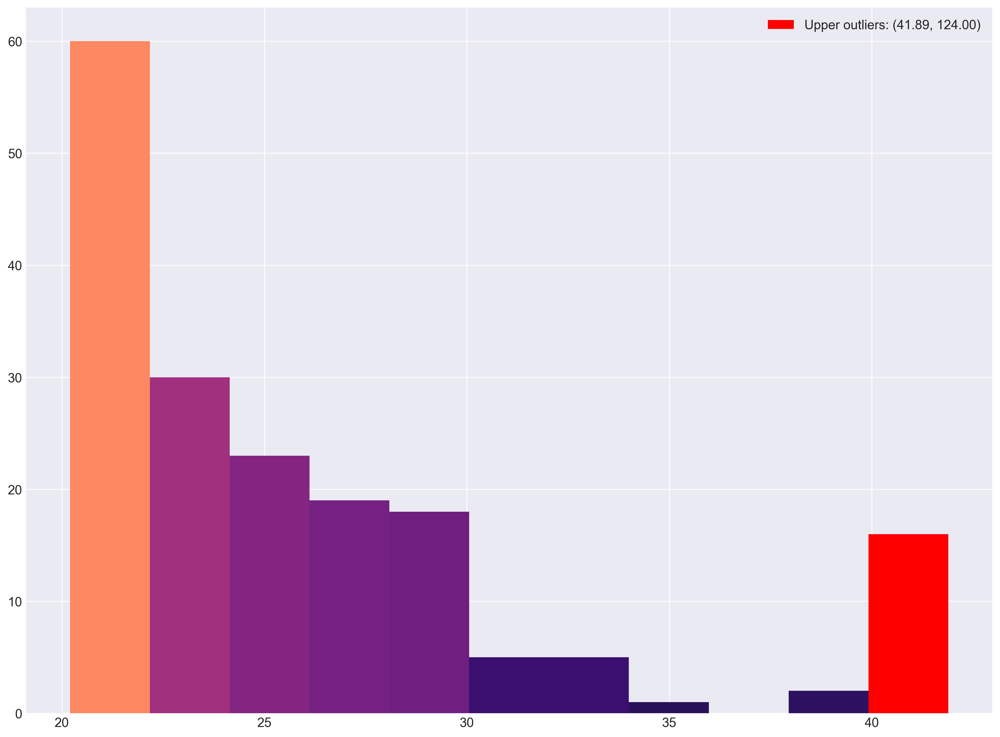

In [148]:
amsterdamumcdb.outliers_histogram(data=wbc.loc[(wbc['value'] > 20) & (wbc['manual_entry'] == True), 'value']).show()

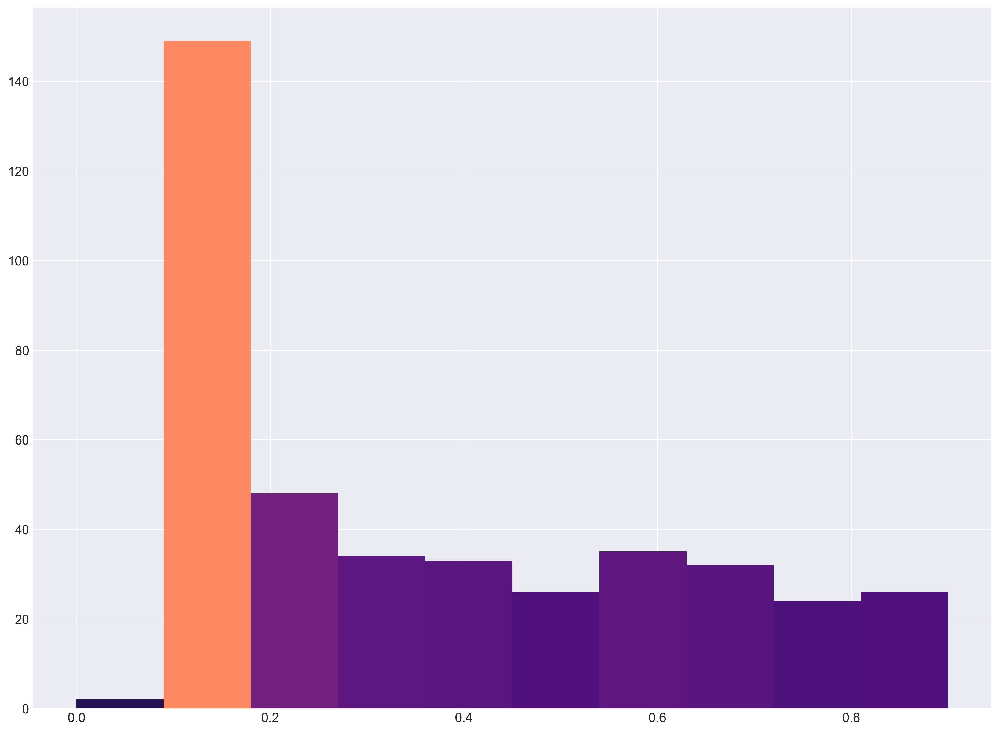

In [149]:
amsterdamumcdb.outliers_histogram(data=wbc.loc[(wbc['value'] < 1), 'value']).show()

In [150]:
#looking at the data it's relevatively easy to spot most lab collection errors (i.e. single outliers between relatively 
# normal values
# TO DO: algorithm to remove these errors, but not 'real' outliers
wbc.loc[wbc['admissionid'].isin(
    wbc.loc[(wbc['value'] > 60) & (wbc['manual_entry'] == False), 'admissionid'])
             ].sort_values(by='admissionid').head(5)

,admissionid,itemid,item,value,registeredby,manual_entry,time
2315,268,9965,Leuco's (bloed),80.800003,Systeem,False,1050
2316,268,9965,Leuco's (bloed),125.000000,Systeem,False,598
2317,268,9965,Leuco's (bloed),177.000000,Systeem,False,49
5461,1778,9965,Leuco's (bloed),72.900002,Systeem,False,150
5462,1778,9965,Leuco's (bloed),76.300003,Systeem,False,827


In [151]:
#separator error: e.g. 117 > 11.7
wbc.loc[(wbc['value'] > 70) & (wbc['manual_entry'] == True), 'value'] = wbc.loc[
    (wbc['value'] > 70) & (wbc['manual_entry'] == True), 'value']/10

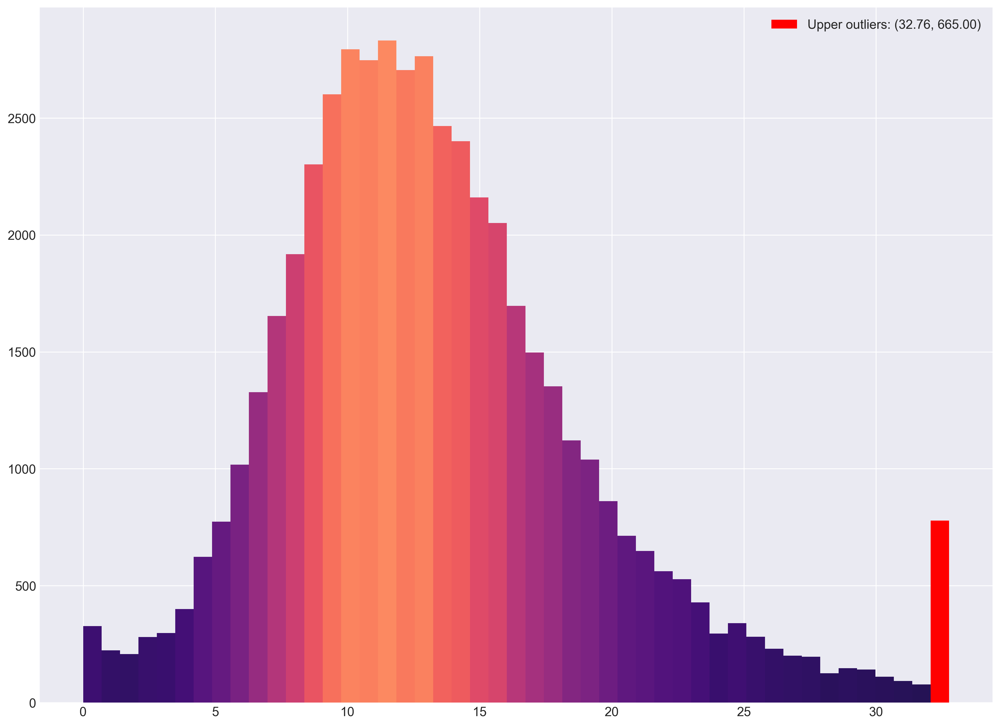

In [152]:
amsterdamumcdb.outliers_histogram(data=wbc['value'], bins=47).show()

In [153]:
#calculate the WBC score
wbc['a2_wbc_score'] = 0
wbc.loc[(wbc['value'] >= 40), 'a2_wbc_score'] = 4
wbc.loc[(wbc['value'] >= 20) & (wbc['value'] < 40), 'a2_wbc_score'] = 2
wbc.loc[(wbc['value'] >= 15) & (wbc['value'] < 20), 'a2_wbc_score'] = 1
wbc.loc[(wbc['value'] >= 3) & (wbc['value'] < 15), 'a2_wbc_score'] = 0
wbc.loc[(wbc['value'] >= 1) & (wbc['value'] < 3), 'a2_wbc_score'] = 2
wbc.loc[(wbc['value'] < 1), 'a2_wbc_score'] = 4

#### APACHE II: Glasgow Coma Score (GCS) - Score = 15 minus actual GCS

In [154]:
# APACHE II: Glasgow Coma Score (GSC) - Score = 15 minus actual GCS - possible parameters
listitems_itemids[listitems_itemids['item'].str.contains('(^|\_|(?<=\W))\w*(Eye|ogen|Motor|Verb|GCS|EMV)\w*($|\_|(?=\W))',
                                                               flags=re.IGNORECASE)]

,itemid,item,valueid,value
49,6732,Actief openen van de ogen,1,Spontane reactie
50,6732,Actief openen van de ogen,2,Reactie op verbale prikkel
51,6732,Actief openen van de ogen,3,Reactie op pijnprikkel
52,6732,Actief openen van de ogen,4,Geen reactie
53,6734,Beste motore reactie van de armen,1,Volgt verbale commando's op
54,6734,Beste motore reactie van de armen,2,Localiseert pijn
55,6734,Beste motore reactie van de armen,3,Spastische reactie (terugtrekken)
56,6734,Beste motore reactie van de armen,4,Decortatie reflex (abnormaal buigen)
57,6734,Beste motore reactie van de armen,5,Strekken
58,6734,Beste motore reactie van de armen,6,Geen reactie


In [155]:
#get Glasgow coma scale-score
sql_gcs = """
WITH gcs_components AS (
    SELECT 
        eyes.admissionid,
        --eyes.itemid,
        --eyes.item,
        --eyes.value,
        --eyes.valueid,
        CASE eyes.itemid
            WHEN 6732 THEN 5 - eyes.valueid     --Actief openen van de ogen
            WHEN 13077 THEN eyes.valueid        --A_Eye
            WHEN 14470 THEN eyes.valueid - 4    --RA_Eye   
            WHEN 16628 THEN eyes.valueid - 4    --MCA_Eye
            WHEN 19635 THEN eyes.valueid - 4    --E_EMV_NICE_24uur
            WHEN 19638 THEN eyes.valueid - 8    --E_EMV_NICE_Opname
        END AS eyes_score,
        --motor.value,
        --motor.valueid,
        CASE motor.itemid
            WHEN 6734 THEN 7 - motor.valueid    --Beste motore reactie van de armen
            WHEN 13072 THEN motor.valueid       --A_Motoriek
            WHEN 14476 THEN motor.valueid - 6   --RA_Motoriek
            WHEN 16634 THEN motor.valueid - 6   --MCA_Motoriek
            WHEN 19636 THEN motor.valueid - 6   --M_EMV_NICE_24uur
            WHEN 19639 THEN motor.valueid - 12  --M_EMV_NICE_Opname
        END AS motor_score,
        --verbal.value,
        --verbal.valueid,
        CASE verbal.itemid
            WHEN 6735 THEN 6 - verbal.valueid   --Beste verbale reactie
            WHEN 13066 THEN verbal.valueid      --A_Verbal
            WHEN 14482 THEN verbal.valueid - 5  --RA_Verbal
            WHEN 16640 THEN verbal.valueid - 5  --MCA_Verbal
            WHEN 19637 THEN verbal.valueid - 9 --V_EMV_NICE_24uur
            WHEN 19640 THEN verbal.valueid - 15 --V_EMV_NICE_Opname
        END AS verbal_score,
        eyes.registeredby,
        (eyes.measuredat - a.admittedat)/(1000*60) AS time       
    FROM listitems eyes
    LEFT JOIN admissions a ON
        eyes.admissionid = a.admissionid
    LEFT JOIN listitems motor ON
        eyes.admissionid = motor.admissionid AND
        eyes.measuredat = motor.measuredat AND
        motor.itemid IN (
            6734, --Beste motore reactie van de armen
            13072, --A_Motoriek
            14476, --RA_Motoriek
            16634, --MCA_Motoriek
            19636, --M_EMV_NICE_24uur
            19639 --M_EMV_NICE_Opname   
        )
    LEFT JOIN listitems verbal ON
        eyes.admissionid = verbal.admissionid AND
        eyes.measuredat = verbal.measuredat AND
        verbal.itemid IN (
            6735, --Beste verbale reactie
            13066, --A_Verbal
            14482, --RA_Verbal
            16640, --MCA_Verbal
            19637, --V_EMV_NICE_24uur
            19640 --V_EMV_NICE_Opname
        )
    WHERE eyes.itemid IN (
        6732, --Actief openen van de ogen
        13077, --A_Eye
        14470, --RA_Eye    
        16628, --MCA_Eye
        19635, --E_EMV_NICE_24uur
        19638 --E_EMV_NICE_Opname
        )
    -- measurements within 24 hours of ICU stay:
    AND (eyes.measuredat - a.admittedat) <= 1000*60*60*24 AND (eyes.measuredat - a.admittedat) >= 0 
), gcs AS (
    SELECT *, 
        eyes_score + motor_score + (
            CASE 
                WHEN verbal_score < 1 THEN 1
                ELSE verbal_score 
            END
        ) AS gcs_score
    FROM gcs_components
), gcs_prioritized AS (
    SELECT *,
        ROW_NUMBER() OVER(
            PARTITION BY admissionid
            ORDER BY --orders by discipline
                CASE registeredby
                    WHEN 'ICV_Medisch Staflid' THEN 1
                    WHEN 'ICV_Medisch' THEN 2
                    WHEN 'ANES_Anesthesiologie'THEN 3
                    WHEN 'ICV_Physician assistant' THEN 4
                    WHEN 'ICH_Neurochirurgie'THEN 5
                    WHEN 'ICV_IC-Verpleegkundig' THEN 6
                    WHEN 'ICV_MC-Verpleegkundig' THEN 7
                    ELSE 8
                END, gcs_score
        ) AS priority 
    FROM gcs
    ORDER BY admissionid, gcs_score ASC
)
SELECT * 
FROM gcs_prioritized
WHERE priority = 1
"""
gcs = pd.read_sql(sql_gcs, con)
#len(gcs.groupby('admissionid').size())
gcs.head()

,admissionid,eyes_score,motor_score,verbal_score,registeredby,time,gcs_score,priority
0,0,4,6.0,5.0,ICV_Medisch,734,15.0,1
1,1,4,6.0,5.0,ICV_Medisch,1372,15.0,1
2,2,4,6.0,5.0,ICV_Medisch,1256,15.0,1
3,4,1,1.0,1.0,ICV_Medisch,103,3.0,1
4,5,4,6.0,5.0,ICV_Medisch Staflid,22,15.0,1


In [156]:
#calculate the GCS score
gcs['a2_gcs_score'] = 15 - gcs['gcs_score']
gcs.head()

,admissionid,eyes_score,motor_score,verbal_score,registeredby,time,gcs_score,priority,a2_gcs_score
0,0,4,6.0,5.0,ICV_Medisch,734,15.0,1,0.0
1,1,4,6.0,5.0,ICV_Medisch,1372,15.0,1,0.0
2,2,4,6.0,5.0,ICV_Medisch,1256,15.0,1,0.0
3,4,1,1.0,1.0,ICV_Medisch,103,3.0,1,12.0
4,5,4,6.0,5.0,ICV_Medisch Staflid,22,15.0,1,0.0


## APACHE II: B: Age Points

In [157]:
#calculate the age score
admissions['a2_age_score'] = 0

#since whe are using generalized ages in the database, it doesn't perfectly with the APACHE groups, so use an average
#of the definitions in APACHE II
admissions.loc[(admissions['agegroup'] == '80+'), 'a2_age_score'] = 6
admissions.loc[(admissions['agegroup'] == '70-79'), 'a2_age_score'] = (5+6)/2
admissions.loc[(admissions['agegroup'] == '60-69'), 'a2_age_score'] = (3+5)/2
admissions.loc[(admissions['agegroup'] == '50-59'), 'a2_age_score'] = (2+3)/2
admissions.loc[(admissions['agegroup'] == '40-49'), 'a2_age_score'] = (0+2)/2
admissions.loc[(admissions['agegroup'] == '18-39'), 'a2_age_score'] = 0

### APACHE II: Final score calculation

Merge all (A) physiology scores and (B) Age scores into a single dataframe

In [158]:
#merge the scores
apache_ii = admissions['admissionid']

#max temperature score 
scores = temperature[temperature['validated'] == True].groupby('admissionid')['a2_temperature_score'].max().to_frame(
    'a2_temperature_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max mean arterial blood pressure
scores = mean_abp[mean_abp['validated'] == True].groupby('admissionid')['a2_mean_abp_score'].max().to_frame(
    'a2_mean_abp_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max heart rate score
scores = heart_rate[heart_rate['validated'] == True].groupby('admissionid')['a2_heart_rate_score'].max().to_frame(
    'a2_heart_rate_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max respiratory rate score
scores = resp_rate[resp_rate['validated'] == True].groupby('admissionid')['a2_resp_rate_score'].max().to_frame(
    'a2_resp_rate_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max oxygenation score
scores = oxygenation.groupby('admissionid')['a2_oxygenation_score'].max().to_frame(
    'a2_oxygenation_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max arterial pH score
scores = pH.groupby('admissionid')['a2_pH_score'].max().to_frame(
    'a2_pH_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max sodium score
scores = sodium.groupby('admissionid')['a2_sodium_score'].max().to_frame(
    'a2_sodium_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max potassium score
scores = potassium.groupby('admissionid')['a2_potassium_score'].max().to_frame(
    'a2_potassium_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max creatinine score
scores = creatinine.groupby('admissionid')['a2_creatinine_score'].max().to_frame(
    'a2_creatinine_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max hematocrit score
scores = ht.groupby('admissionid')['a2_ht_score'].max().to_frame(
    'a2_ht_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max white blood cell count score
scores = wbc.groupby('admissionid')['a2_wbc_score'].max().to_frame(
    'a2_wbc_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#max GCS score
scores = gcs.groupby('admissionid')['a2_gcs_score'].max().to_frame(
    'a2_gcs_score').sort_values(by=['admissionid']).reset_index()
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')
 
#B. Age score
scores = admissions[['admissionid','a2_age_score']]
apache_ii = pd.merge(apache_ii, scores, on='admissionid', how='left')

#calculate total score (add al values in columns)
total_scores = apache_ii.set_index('admissionid').sum(axis=1, skipna=True).to_frame('apache_ii_total_score')
apache_ii = pd.merge(apache_ii, total_scores, on='admissionid', how='left')
apache_ii.head()

,admissionid,a2_temperature_score,a2_mean_abp_score,a2_heart_rate_score,a2_resp_rate_score,a2_oxygenation_score,a2_pH_score,a2_sodium_score,a2_potassium_score,a2_creatinine_score,a2_ht_score,a2_wbc_score,a2_gcs_score,a2_age_score,apache_ii_total_score
0,0,2.0,3.0,0.0,4.0,1.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,6.0,20.0
1,1,1.0,2.0,0.0,2.0,0.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,4.0,13.0
2,2,0.0,2.0,2.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,4.0,12.0
3,4,1.0,2.0,2.0,0.0,3.0,2.0,0.0,0.0,0.0,0.0,2.0,12.0,5.5,29.5
4,5,1.0,2.0,2.0,3.0,0.0,2.0,0.0,0.0,0.0,1.0,2.0,0.0,2.5,15.5


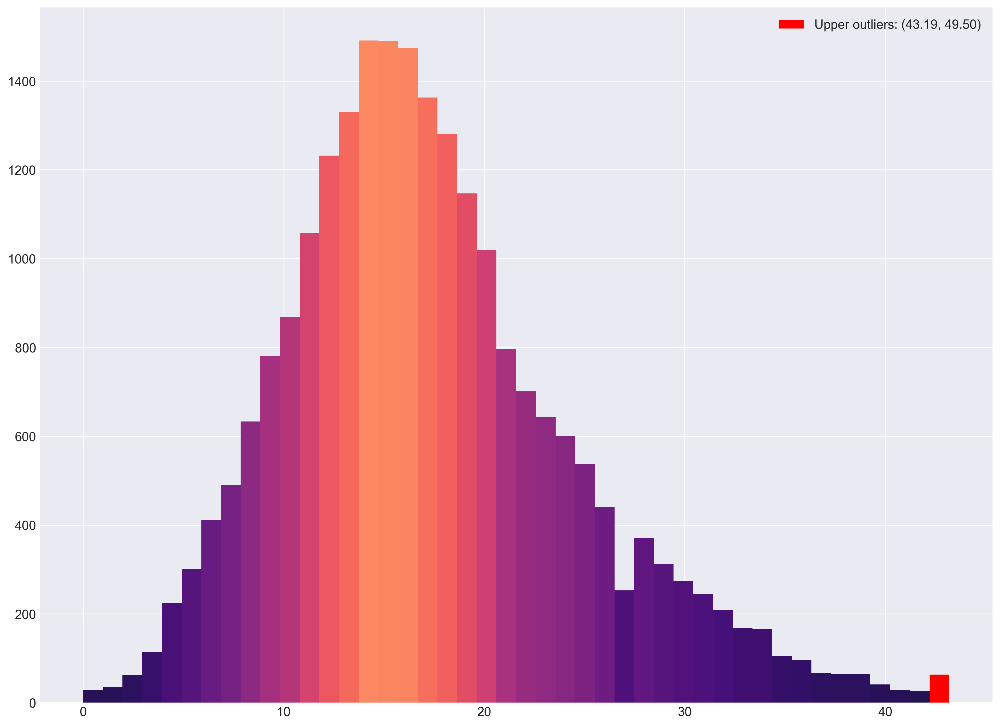

In [159]:
amsterdamumcdb.outliers_histogram(data=apache_ii['apache_ii_total_score'], bins=44).show()

Add location for easier selection:

In [160]:
apache_ii = pd.merge(apache_ii, admissions[['admissionid','location','urgency']], on='admissionid', how='left')
apache_ii.loc[:,'urgency'] = pd.to_numeric(apache_ii.loc[:,'urgency'])

In [161]:
apache_ii_total = apache_ii.apache_ii_total_score.median()
apache_ii_iqr1_total = apache_ii.apache_ii_total_score.quantile(0.25)
apache_ii_iqr2_total = apache_ii.apache_ii_total_score.quantile(0.75)

apache_ii_ICU = apache_ii.loc[apache_ii['location'].str.contains('IC'), 'apache_ii_total_score'].median()
apache_ii_iqr1_ICU = apache_ii.loc[apache_ii['location'].str.contains('IC'), 'apache_ii_total_score'].quantile(0.25)
apache_ii_iqr2_ICU = apache_ii.loc[apache_ii['location'].str.contains('IC'), 'apache_ii_total_score'].quantile(0.75)

apache_ii_MCU = apache_ii.loc[apache_ii['location'].str.contains('^MC$'), 'apache_ii_total_score'].median()
apache_ii_iqr1_MCU = apache_ii.loc[apache_ii['location'].str.contains('^MC$'), 'apache_ii_total_score'].quantile(0.25)
apache_ii_iqr2_MCU = apache_ii.loc[apache_ii['location'].str.contains('^MC$'), 'apache_ii_total_score'].quantile(0.75)

In [162]:
apache_ii_total_urgent = apache_ii.loc[apache_ii['urgency'] == 1].apache_ii_total_score.median()
apache_ii_iqr1_total_urgent = apache_ii.loc[apache_ii['urgency'] == 1].apache_ii_total_score.quantile(0.25)
apache_ii_iqr2_total_urgent = apache_ii.loc[apache_ii['urgency'] == 1].apache_ii_total_score.quantile(0.75)

apache_ii_ICU_urgent = apache_ii.loc[(apache_ii['urgency'] == 1) & apache_ii['location'].str.contains('IC'), 'apache_ii_total_score'].median()
apache_ii_iqr1_ICU_urgent = apache_ii.loc[(apache_ii['urgency'] == 1) & apache_ii['location'].str.contains('IC'), 'apache_ii_total_score'].quantile(0.25)
apache_ii_iqr2_ICU_urgent = apache_ii.loc[(apache_ii['urgency'] == 1) & apache_ii['location'].str.contains('IC'), 'apache_ii_total_score'].quantile(0.75)

apache_ii_MCU_urgent = apache_ii.loc[(apache_ii['urgency'] == 1) & apache_ii['location'].str.contains('^MC$'), 'apache_ii_total_score'].median()
apache_ii_iqr1_MCU_urgent = apache_ii.loc[(apache_ii['urgency'] == 1) & apache_ii['location'].str.contains('^MC$'), 'apache_ii_total_score'].quantile(0.25)
apache_ii_iqr2_MCU_urgent = apache_ii.loc[(apache_ii['urgency'] == 1) & apache_ii['location'].str.contains('^MC$'), 'apache_ii_total_score'].quantile(0.75)

In [163]:
apache_ii_total_nonurgent = apache_ii.loc[apache_ii['urgency'] == 0].apache_ii_total_score.median()
apache_ii_iqr1_total_nonurgent = apache_ii.loc[apache_ii['urgency'] == 0].apache_ii_total_score.quantile(0.25)
apache_ii_iqr2_total_nonurgent = apache_ii.loc[apache_ii['urgency'] == 0].apache_ii_total_score.quantile(0.75)

apache_ii_ICU_nonurgent = apache_ii.loc[(apache_ii['urgency'] == 0) & apache_ii['location'].str.contains('IC'), 'apache_ii_total_score'].median()
apache_ii_iqr1_ICU_nonurgent = apache_ii.loc[(apache_ii['urgency'] == 0) & apache_ii['location'].str.contains('IC'), 'apache_ii_total_score'].quantile(0.25)
apache_ii_iqr2_ICU_nonurgent = apache_ii.loc[(apache_ii['urgency'] == 0) & apache_ii['location'].str.contains('IC'), 'apache_ii_total_score'].quantile(0.75)

apache_ii_MCU_nonurgent = apache_ii.loc[(apache_ii['urgency'] == 0) & apache_ii['location'].str.contains('^MC$'), 'apache_ii_total_score'].median()
apache_ii_iqr1_MCU_nonurgent = apache_ii.loc[(apache_ii['urgency'] == 0) & apache_ii['location'].str.contains('^MC$'), 'apache_ii_total_score'].quantile(0.25)
apache_ii_iqr2_MCU_nonurgent = apache_ii.loc[(apache_ii['urgency'] == 0) & apache_ii['location'].str.contains('^MC$'), 'apache_ii_total_score'].quantile(0.75)

### SOFA
At day 1 (=first 24 hours of ICU/MCU admission)

#### Respiration PaO2/FiO2, mmHg
Since the original Vincent (1996) article did not specify estimation of FiO2 for patients without ventilatory support, we use the Stichting NICE conversion table based on oxygen flow and device used.
https://www.stichting-nice.nl/download/file?link=20191205120834MinimaleDatasetMDSvolledignl

In [164]:
# Oxygen device possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('(^|\_|(?<=\W))(O2|zuurstof|toediening)\w*($|\_|(?=\W))',
                                                               flags=re.IGNORECASE)]

,itemid,item,unitid,unit
198,8845,O2 l/min,26,l/min
214,8869,O2 Volume,0,None
282,9664,O2 Volume(2),0,None
520,10282,O2-Content (bloed),88,ml/dl
521,10283,O2-CONTENT (overig),88,ml/dl
565,10387,Zuurstof toediening (bloed),26,l/min
593,11425,O2sat (overig),191,Geen
879,12279,O2 concentratie,191,Geen
882,12282,O2 concentratie (Set),191,Geen
905,12311,O2-Saturatie (bloed),191,Geen


In [165]:
# Oxygen device possible parameters
listitems_itemids[listitems_itemids['item'].str.contains('(^|\_|(?<=\W))\w*(O2|zuurstof|toediening)\w*($|\_|(?=\W))',
                                                               flags=re.IGNORECASE)]

,itemid,item,valueid,value
88,8189,Toedieningsweg,1,Diep Nasaal
89,8189,Toedieningsweg,2,Nasaal
90,8189,Toedieningsweg,3,Kapje
91,8189,Toedieningsweg,4,Kunstneus
92,8189,Toedieningsweg,7,O2-bril
93,8189,Toedieningsweg,8,Kinnebak
94,8189,Toedieningsweg,9,Nebulizer
95,8189,Toedieningsweg,10,Waterset
96,8189,Toedieningsweg,11,Trach.stoma
97,8189,Toedieningsweg,12,B.Lucht


In [166]:
#get PaO2/FiO2 ratio
sql_oxy_flow = """
SELECT 
    oxy_dev.admissionid,
    oxy_dev.valueid,
    oxy_dev.value as O2_device,
    oxy_dev.measuredat,
    oxy_flow.value AS O2_flow 
FROM listitems oxy_dev
LEFT JOIN admissions a ON
    oxy_dev.admissionid = a.admissionid
LEFT JOIN numericitems oxy_flow ON
    oxy_dev.admissionid = oxy_flow.admissionid AND
    oxy_dev.measuredat = oxy_flow.measuredat AND
    oxy_flow.itemid IN (
        8845, -- O2 l/min
        10387, --Zuurstof toediening (bloed)
        18587 --Zuurstof toediening
    )
WHERE oxy_dev.itemid = 8189 -- Toedieningsweg (Oxygen device)
    -- measurements within 24 hours of ICU stay:
    AND (oxy_dev.measuredat - a.admittedat) <= 1000*60*60*24 AND (oxy_dev.measuredat - a.admittedat) >= 0 
"""
oxy_flow = pd.read_sql(sql_oxy_flow, con)
#len(gcs.groupby('admissionid').size())
oxy_flow.head()

,admissionid,valueid,o2_device,measuredat,o2_flow
0,0,3,Kapje,69120000,10.0
1,0,7,O2-bril,60720000,6.0
2,0,7,O2-bril,65520000,6.0
3,0,17,Non-Rebreathing masker,69180000,15.0
4,0,17,Non-Rebreathing masker,72720000,15.0


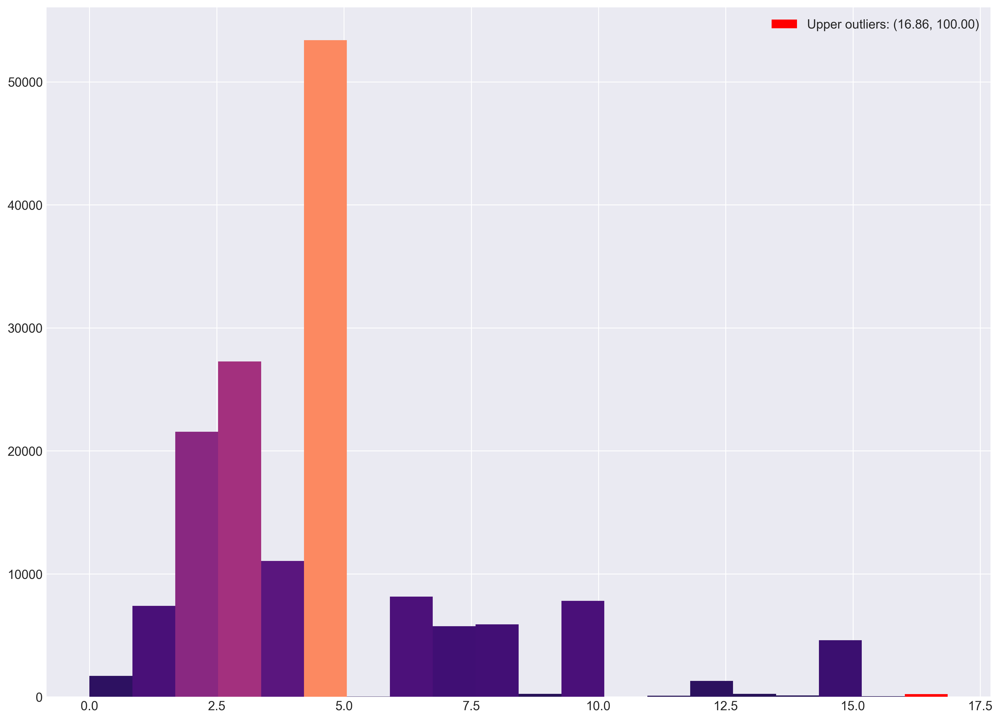

In [167]:
amsterdamumcdb.outliers_histogram(data=oxy_flow['o2_flow'].dropna(), bins=20).show()

In [168]:
oxy_flow.loc[(oxy_flow['o2_flow'] < 1), 'o2_flow'].unique()

array([0. , 0.5])

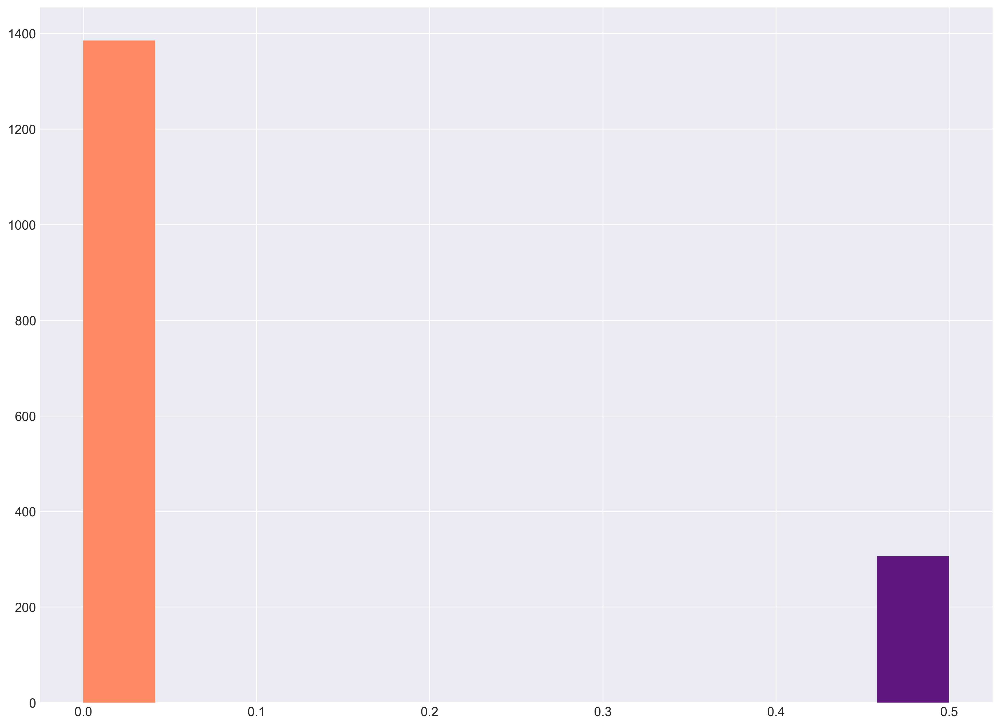

In [169]:
amsterdamumcdb.outliers_histogram(data=oxy_flow.loc[(oxy_flow['o2_flow'] < 1), 'o2_flow']).show()

In [170]:
oxy_flow.loc[(oxy_flow['o2_flow'] > 15), 'o2_flow'].unique()

array([ 16. ,  20. , 100. ,  17. ,  22. ,  25. ,  15.7,  18. ,  30. ,
        19. ])

In [171]:
oxy_flow.loc[(oxy_flow['o2_flow'] > 15)]

,admissionid,valueid,o2_device,measuredat,o2_flow
1516,216,1,Diep Nasaal,29820000,16.0
1523,216,17,Non-Rebreathing masker,29820000,16.0
4392,638,17,Non-Rebreathing masker,85380000,20.0
4484,654,1,Diep Nasaal,129600000,20.0
4492,654,3,Kapje,133200000,20.0
4493,654,1,Diep Nasaal,133200000,20.0
4494,654,1,Diep Nasaal,136800000,20.0
4495,654,3,Kapje,136800000,20.0
4496,654,1,Diep Nasaal,140400000,20.0
4497,654,3,Kapje,140400000,20.0


D:\GitHub\nescio\paper\amsterdamumcdb.py:39: RuntimeWarning: invalid value encountered in true_divide
  col = (n-n.min())/(n.max()-n.min())
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


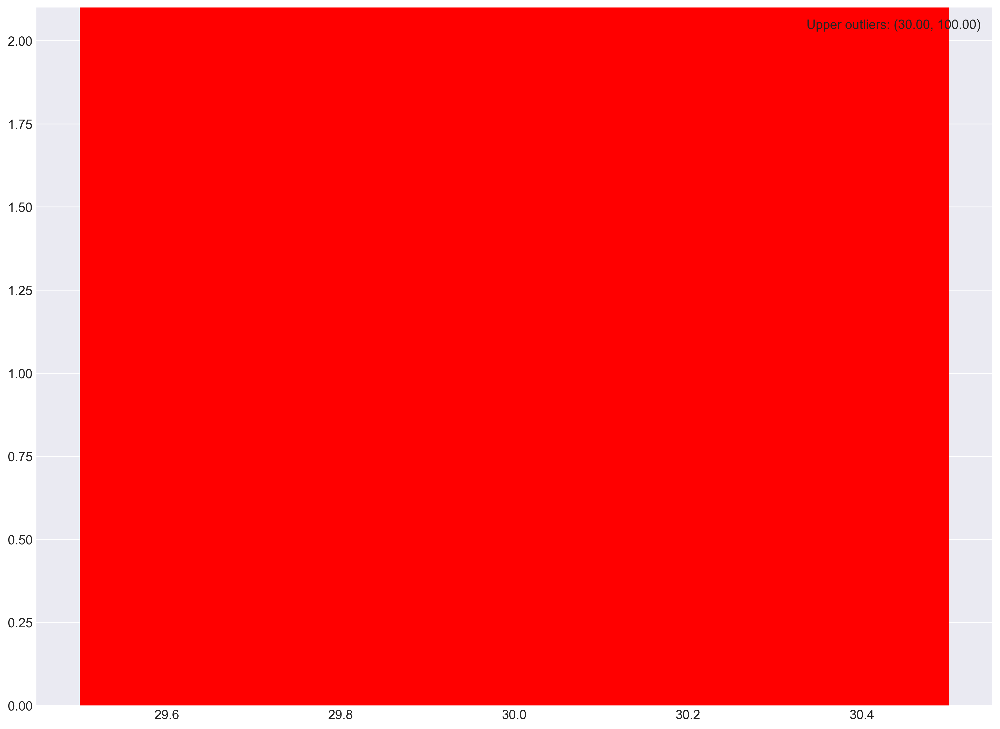

In [172]:
amsterdamumcdb.outliers_histogram(data=oxy_flow.loc[(oxy_flow['o2_flow'] > 25), 'o2_flow']).show()

In [173]:
#get PaO2 and FiO2 values
# simultaneously retrieve PaCO2 and the 'nearest' FiO2 from the ventilator or estimated FiO2 based on applied oxygen
# device. Ideally documentation of measurements should be at the same time, but since this is not garanteed allow a window.
#
# in more recent data PaCO2 and PaO2 were documented in kPa instead of mmHg.
sql_sofa_respiration = """
WITH fio2_table AS (
    SELECT n.admissionid,
        n.measuredat,
        l.valueid,
        l.value AS O2_device,
        CASE
            WHEN n.itemid IN (
                --FiO2 settings on respiratory support
                6699, --FiO2 %: setting on Evita ventilator
                12279, --O2 concentratie --measurement by Servo-i/Servo-U ventilator
                12369, --SET %O2: used with BiPap Vision ventilator
                16246 --Zephyros FiO2: Non-invasive ventilation
            ) THEN TRUE
            ELSE FALSE
        END AS ventilatory_support,
        CASE
            WHEN n.itemid IN (
                --FiO2 settings on respiratory support
                6699, --FiO2 %: setting on Evita ventilator
                12279, --O2 concentratie --measurement by Servo-i/Servo-U ventilator
                12369, --SET %O2: used with BiPap Vision ventilator
                16246 --Zephyros FiO2: Non-invasive ventilation
            ) THEN 
                CASE 
                    WHEN NOT n.value IS NULL THEN n.value --use the settings
                    ELSE 0.21
                END
            ELSE -- estimate the FiO2
                CASE
                    WHEN l.valueid IN (
                        2, -- Nasaal
                        7 --O2-bril
                    ) THEN 
                        CASE
                            WHEN n.value >= 1 AND n.value < 2 THEN 0.22
                            WHEN n.value >= 2 AND n.value < 3 THEN 0.25
                            WHEN n.value >= 3 AND n.value < 4 THEN 0.27
                            WHEN n.value >= 4 AND n.value < 5 THEN 0.30
                            WHEN n.value >= 5 THEN 0.35
                            ELSE 0.21
                        END
                    WHEN l.valueid IN (
                        1, --Diep Nasaal
                        3, --Kapje
                        8, --Kinnebak
                        9, --Nebulizer
                        4, --Kunstneus
                        18, --Spreekcanule
                        19 --Spreekklepje
                    ) THEN
                        CASE
                            WHEN n.value >= 1 AND n.value < 2 THEN 0.22 -- not defined by NICE
                            WHEN n.value >= 2 AND n.value < 3 THEN 0.25
                            WHEN n.value >= 3 AND n.value < 4 THEN 0.27
                            WHEN n.value >= 4 AND n.value < 5 THEN 0.30
                            WHEN n.value >= 5 AND n.value < 6 THEN 0.35
                            WHEN n.value >= 6 AND n.value < 7 THEN 0.40
                            WHEN n.value >= 7 AND n.value < 8 THEN 0.45
                            WHEN n.value >= 8 THEN 0.50
                            ELSE 0.21
                        END
                    WHEN l.valueid IN (
                        10, --Waterset
                        11, --Trach.stoma
                        13, --Ambu
                        14, --Guedel
                        15, --DL-tube
                        16, --CPAP
                        17 --Non-Rebreathing masker
                    ) THEN
                        CASE
                            WHEN n.value >= 6 AND n.value < 7 THEN 0.60
                            WHEN n.value >= 7 AND n.value < 8 THEN 0.70
                            WHEN n.value >= 8 AND n.value < 9 THEN 0.80
                            WHEN n.value >= 9 AND n.value < 10 THEN 0.85
                            WHEN n.value >= 10 THEN 0.90
                            ELSE 0.21  
                        END
                    WHEN l.valueid IN (
                        12 --B.Lucht
                    ) THEN 0.21
                ELSE 0.21
            END
        END AS fio2
    FROM numericitems n
    LEFT JOIN admissions a ON
        n.admissionid = a.admissionid
    LEFT JOIN listitems l ON
        n.admissionid = l.admissionid AND
        n.measuredat = l.measuredat AND
        l.itemid = 8189 -- Toedieningsweg (Oxygen device)
    WHERE 
        n.itemid IN (
            --Oxygen Flow settings without respiratory support
            8845, -- O2 l/min
            10387, --Zuurstof toediening (bloed)
            18587, --Zuurstof toediening

            --FiO2 settings on respiratory support
            6699, --FiO2 %: setting on Evita ventilator
            12279, --O2 concentratie --measurement by Servo-i/Servo-U ventilator
            12369, --SET %O2: used with BiPap Vision ventilator
            16246 --Zephyros FiO2: Non-invasive ventilation
        )
    --measurements within 24 hours of ICU stay:
    AND (n.measuredat - a.admittedat) <= 1000*60*60*24 AND (n.measuredat - a.admittedat) >= 0
    AND n.value > 0 --ignore stand by values from Evita ventilator
), 
oxygenation AS (
    SELECT 
        pao2.admissionid,
        CASE pao2.unitid 
            WHEN 152 THEN pao2.value * 7.50061683 -- Conversion: kPa to mmHg
            ELSE pao2.value 
        END AS pao2,
        f.value AS specimen_source,
        CASE 
            WHEN pao2.registeredby NOT ILIKE '%Systeem%' THEN TRUE
            ELSE FALSE
        END AS manual_entry,
        (pao2.measuredat - a.admittedat)/(1000*60) AS time,
        fio2_table.fio2,
        fio2_table.ventilatory_support,
        (fio2_table.measuredat - pao2.measuredat)/(60*1000) AS FiO2_time_difference,
        ROW_NUMBER() OVER(
            PARTITION BY pao2.admissionid, pao2.measuredat
            ORDER BY ABS(fio2_table.measuredat - pao2.measuredat)
        ) AS priority --give priority to nearest FiO2 measurement
    FROM numericitems pao2
    LEFT JOIN admissions a ON
        pao2.admissionid = a.admissionid
    LEFT JOIN freetextitems f ON
        pao2.admissionid = f.admissionid AND
        pao2.measuredat = f.measuredat AND
        f.itemid = 11646 --Afname (bloed): source of specimen
    LEFT JOIN numericitems paco2 ON 
        pao2.admissionid = paco2.admissionid AND
        pao2.measuredat = paco2.measuredat AND
        paco2.itemid IN (
            6846, --PCO2
            9990, --pCO2 (bloed)
            21213 --PCO2 (bloed) - kPa
        )
    LEFT JOIN fio2_table ON 
        pao2.admissionid = fio2_table.admissionid AND
        fio2_table.measuredat > pao2.measuredat - 60*60*1000 AND --no earlier than 60 minutes before pao2 measurement
        fio2_table.measuredat < pao2.measuredat + 15*60*1000 --no later than 15 minutes after pao2 measurement
    WHERE 
        pao2.itemid IN (
            7433, --PO2
            9996, --PO2 (bloed)
            21214 --PO2 (bloed) - kPa
        ) 
    --measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
    AND (pao2.measuredat - a.admittedat) <= 1000*60*60*24 AND (pao2.measuredat - a.admittedat) >= -(1000*60*30) AND
    (f.value ILIKE '%art.%' OR f.value IS NULL)  -- source is arterial or undefined (assume arterial)
)
SELECT * FROM oxygenation
WHERE priority = 1
"""
sofa_respiration = pd.read_sql(sql_sofa_respiration, con)
sofa_respiration.head()

,admissionid,pao2,specimen_source,manual_entry,time,fio2,ventilatory_support,fio2_time_difference,priority
0,0,90.0,None,True,342,50.0,True,0.0,1
1,0,149.0,None,True,432,51.0,True,0.0,1
2,0,104.0,None,True,552,41.0,True,0.0,1
3,0,32.0,None,True,612,41.0,True,0.0,1
4,0,105.0,None,True,732,41.0,True,0.0,1


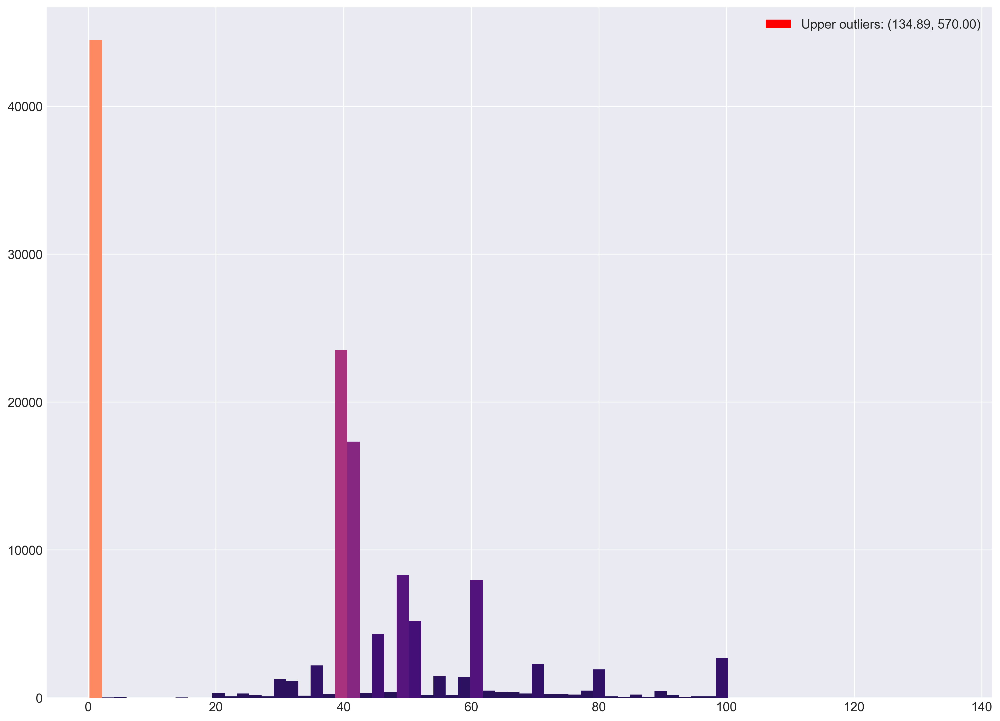

In [174]:
amsterdamumcdb.outliers_histogram(data=sofa_respiration['fio2'].dropna()).show()

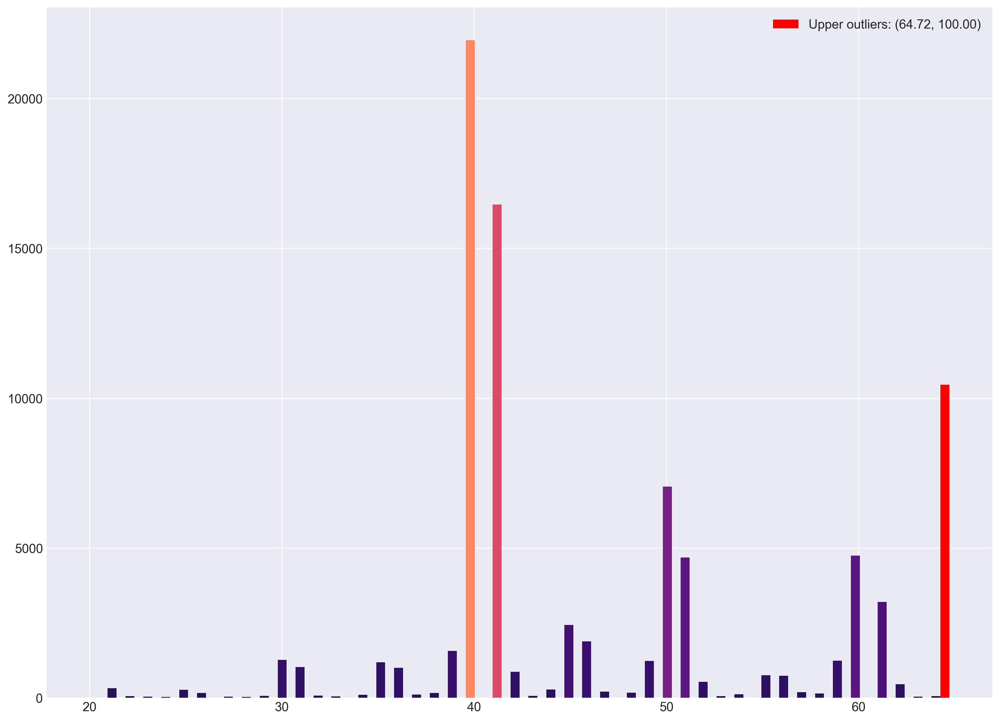

In [175]:
amsterdamumcdb.outliers_histogram(data=sofa_respiration.loc[(sofa_respiration['fio2'] >= 20) & 
                                                            (sofa_respiration['fio2'] <=100), 'fio2']).show()

In [176]:
#remove extreme outliers
sofa_respiration.loc[(sofa_respiration['fio2'] > 100), 'fio2'] = np.NaN

#convert FiO2 in % to fraction
sofa_respiration.loc[(sofa_respiration['fio2'] <= 100) & 
                     (sofa_respiration['fio2'] >= 20) , 'fio2'] = sofa_respiration['fio2']/100

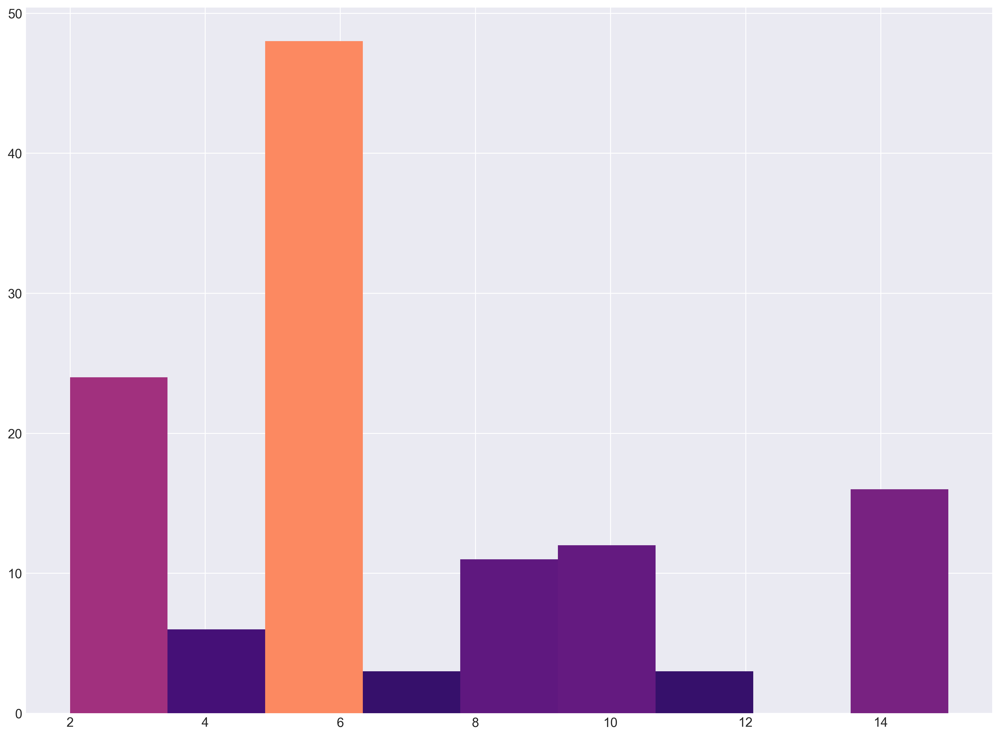

In [177]:
amsterdamumcdb.outliers_histogram(data=sofa_respiration.loc[(sofa_respiration['fio2'] > 1), 'fio2']).show()

In [178]:
#remove extreme outliers (FiO2) (possible O2 flow?)
sofa_respiration.loc[(sofa_respiration['fio2'] > 1), 'fio2'] = np.NaN

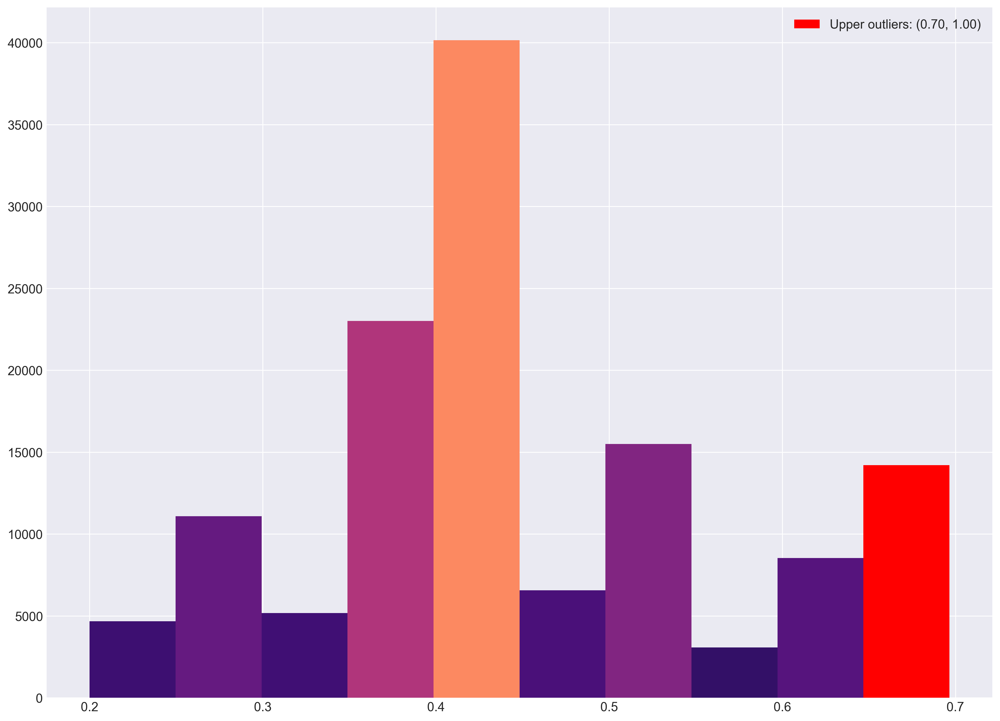

In [179]:
amsterdamumcdb.outliers_histogram(data=sofa_respiration['fio2'].dropna(), bins=10).show()

In [180]:
#based on APACHE II data cleanup:
#remove lower outliers, most likely incorrectly labeled as 'arterial' instead of '(mixed/central) venous'
sofa_respiration.loc[sofa_respiration['pao2'] < 50, 'pao2'] = np.NaN
sofa_respiration = sofa_respiration.dropna(subset=['pao2'])

In [181]:
#get platelets (thrombocytes)
sql_sofa_platelets = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    n.registeredby,
    CASE 
        WHEN n.registeredby NOT ILIKE '%Systeem%' THEN TRUE
        ELSE FALSE
    END AS manual_entry,
    (n.measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
    n.admissionid = a.admissionid
WHERE n.itemid IN (
    9964, --Thrombo's (bloed)
    6797, --Thrombocyten
    10409, --Thrombo's citr. bloed (bloed)
    14252 --Thrombo CD61 (bloed)
    )
--measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
AND (n.measuredat - a.admittedat) <= 1000*60*60*24 AND (n.measuredat - a.admittedat) >= -(1000*60*30)    
"""
sofa_platelets = pd.read_sql(sql_sofa_platelets, con)
sofa_platelets.head()

,admissionid,itemid,item,value,registeredby,manual_entry,time
0,12,6797,Thrombocyten,117.0,ICV_IC-Verpleegkundig,True,375
1,43,6797,Thrombocyten,105.0,ICV_IC-Verpleegkundig,True,830
2,43,6797,Thrombocyten,106.0,ICV_Medisch,True,20
3,102,6797,Thrombocyten,124.0,ICV_Medisch,True,60
4,130,6797,Thrombocyten,110.0,ICV_Medisch,True,181


In [182]:
sofa_respiration.loc[:,'pf_ratio'] = sofa_respiration['pao2']/sofa_respiration['fio2']
sofa_respiration.head()

,admissionid,pao2,specimen_source,manual_entry,time,fio2,ventilatory_support,fio2_time_difference,priority,pf_ratio
0,0,90.0,None,True,342,0.50,True,0.0,1,180.000000
1,0,149.0,None,True,432,0.51,True,0.0,1,292.156863
2,0,104.0,None,True,552,0.41,True,0.0,1,253.658537
4,0,105.0,None,True,732,0.41,True,0.0,1,256.097561
5,0,90.0,None,True,927,0.41,True,-15.0,1,219.512195


In [183]:
#calculate SOFA respiration score:
sofa_respiration.loc[:,'sofa_respiration_score'] = 0
sofa_respiration.loc[(sofa_respiration['pf_ratio'] < 400) & 
                     (sofa_respiration['pf_ratio'] >= 300), 'sofa_respiration_score'] = 1
sofa_respiration.loc[(sofa_respiration['pf_ratio'] < 300), 'sofa_respiration_score'] = 2
sofa_respiration.loc[(sofa_respiration['pf_ratio'] < 200) & (sofa_respiration['pf_ratio'] >= 100) &
                     (sofa_respiration['ventilatory_support'] == True), 'sofa_respiration_score'] = 3
sofa_respiration.loc[(sofa_respiration['pf_ratio'] < 100) & 
                     (sofa_respiration['ventilatory_support'] == True), 'sofa_respiration_score'] = 4
sofa_respiration.head()

,admissionid,pao2,specimen_source,manual_entry,time,fio2,ventilatory_support,fio2_time_difference,priority,pf_ratio,sofa_respiration_score
0,0,90.0,None,True,342,0.50,True,0.0,1,180.000000,3
1,0,149.0,None,True,432,0.51,True,0.0,1,292.156863,2
2,0,104.0,None,True,552,0.41,True,0.0,1,253.658537,2
4,0,105.0,None,True,732,0.41,True,0.0,1,256.097561,2
5,0,90.0,None,True,927,0.41,True,-15.0,1,219.512195,2


#### SOFA: Coagulation - Platelets x 10^3/mm^3

In [184]:
#  SOFA: Coagulation - Platelets x 10^3/mm^3 - possible parameters
numericitems_itemids[numericitems_itemids['item'].str.contains('(^|(?<=\W))t(h)?rombo(cyten)?($|(?=\W))', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
57,6797,Thrombocyten,101,10^9/l
388,9964,Thrombo's (bloed),101,10^9/l
550,10356,THROMBO'S (overig),101,10^9/l
573,10409,Thrombo's citr. bloed (bloed),101,10^9/l
1080,14252,Thrombo CD61 (bloed),101,10^9/l
1614,20018,Streef Thrombo's onderwaarde,101,10^9/l


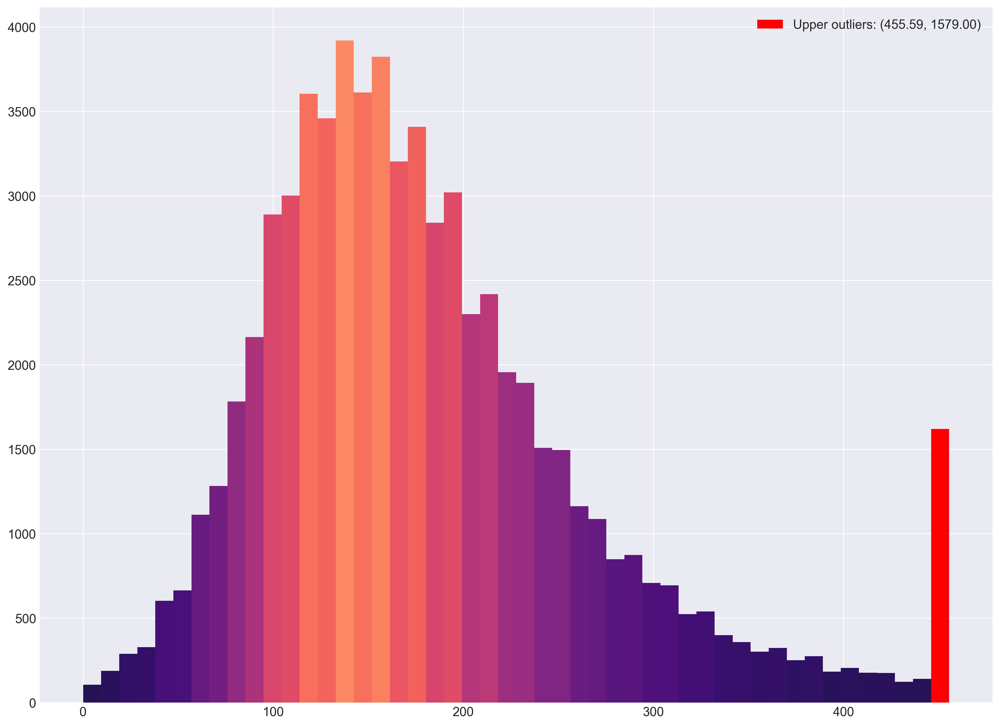

In [185]:
amsterdamumcdb.outliers_histogram(data=sofa_platelets['value'],bins=48).show()

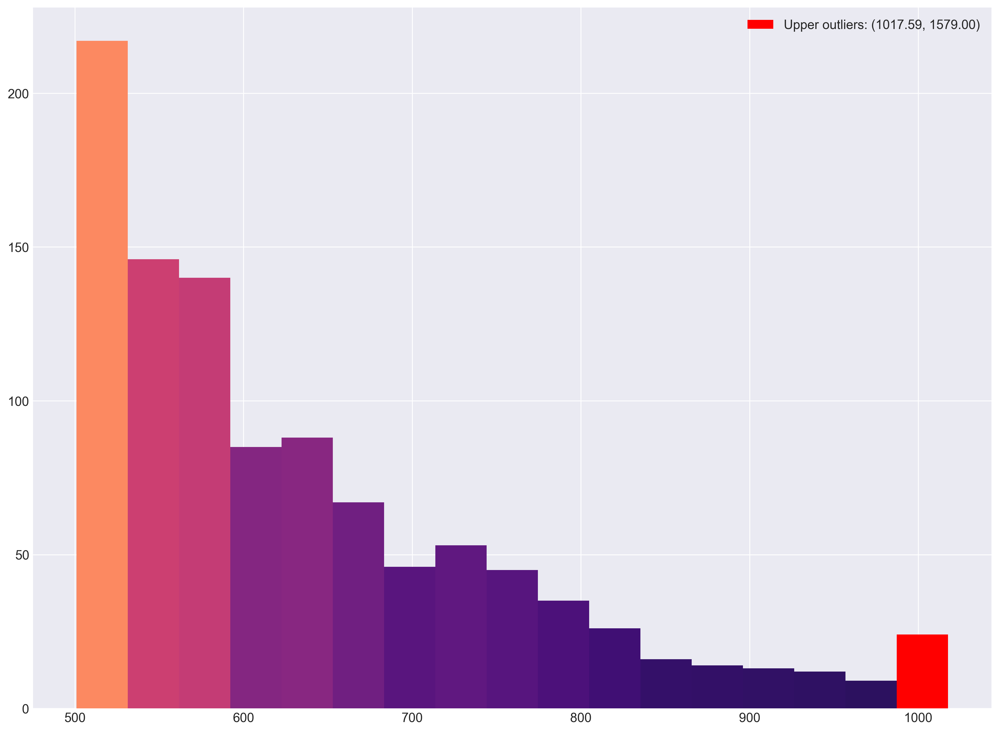

In [186]:
amsterdamumcdb.outliers_histogram(data=sofa_platelets.loc[(sofa_platelets['value'] > 500) & (sofa_platelets['manual_entry'] == False), 'value']).show()

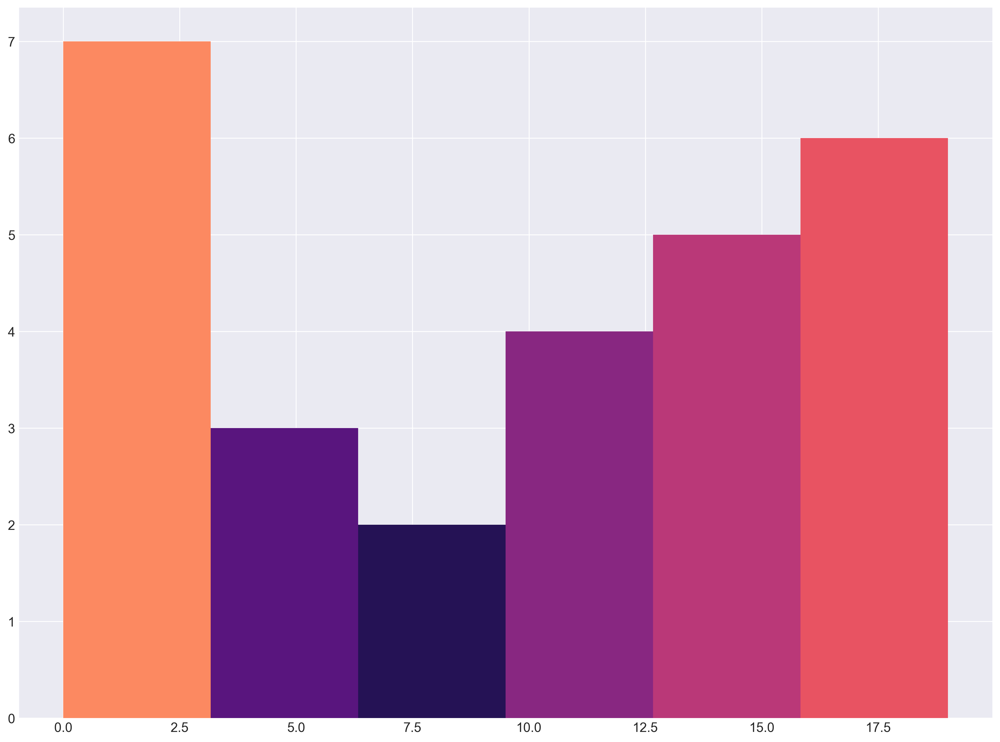

In [187]:
amsterdamumcdb.outliers_histogram(data=sofa_platelets.loc[(sofa_platelets['value'] < 20) & (sofa_platelets['manual_entry'] == True), 'value']).show()

In [188]:
#calculate SOFA coagulation score:
sofa_platelets.loc[:,'sofa_coagulation_score'] = 0
sofa_platelets.loc[(sofa_platelets['value'] < 150) & 
                     (sofa_platelets['value'] >= 100), 'sofa_coagulation_score'] = 1
sofa_platelets.loc[(sofa_platelets['value'] < 100) & 
                     (sofa_platelets['value'] >= 50), 'sofa_coagulation_score'] = 3
sofa_platelets.loc[(sofa_platelets['value'] < 50) & 
                     (sofa_platelets['value'] >= 20), 'sofa_coagulation_score'] = 3
sofa_platelets.loc[(sofa_platelets['value'] < 20), 'sofa_coagulation_score'] = 4

sofa_platelets.head()

,admissionid,itemid,item,value,registeredby,manual_entry,time,sofa_coagulation_score
0,12,6797,Thrombocyten,117.0,ICV_IC-Verpleegkundig,True,375,1
1,43,6797,Thrombocyten,105.0,ICV_IC-Verpleegkundig,True,830,1
2,43,6797,Thrombocyten,106.0,ICV_Medisch,True,20,1
3,102,6797,Thrombocyten,124.0,ICV_Medisch,True,60,1
4,130,6797,Thrombocyten,110.0,ICV_Medisch,True,181,1


#### SOFA: Liver - Bilirubin, µmol/l

In [189]:
#  SOFA:Liver - Bilirubin, µmol/l
numericitems_itemids[numericitems_itemids['item'].str.contains('(^|(?<=\W))bili(rubine)?($|(?=\W))', flags=re.IGNORECASE)]

,itemid,item,unitid,unit
67,6812,Bilirubine geconjugeerd,56,µmol
68,6813,Bili Totaal,56,µmol
370,9945,Bilirubine (bloed),99,µmol/l
371,9946,BILIRUBINE (overig),99,µmol/l
559,10377,Bili (Liq) (liquor),99,µmol/l
827,12079,Gecon.Bili (bloed),214,x TOT
828,12080,Gecon.Bili (overig),214,x TOT
1285,17993,Bilirubine ascitesvocht (ascitesvocht),99,µmol/l
1354,18361,Gecon.Bili (bloed),99,µmol/l
1469,18851,Bilirubine drainvocht (drain),99,µmol/l


In [190]:
#get bilirubin
sql_sofa_bilirubin = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    n.registeredby,
    CASE 
        WHEN n.registeredby NOT ILIKE '%Systeem%' THEN TRUE
        ELSE FALSE
    END AS manual_entry,
    (n.measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
    n.admissionid = a.admissionid
    WHERE n.itemid IN (
        6813, --Bili Totaal
        9945 --Bilirubine (bloed)
    )
--measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
AND (n.measuredat - a.admittedat) <= 1000*60*60*24 AND (n.measuredat - a.admittedat) >= -(1000*60*30)
"""
sofa_bilirubin = pd.read_sql(sql_sofa_bilirubin, con)
sofa_bilirubin.head()

,admissionid,itemid,item,value,registeredby,manual_entry,time
0,12,6813,Bili Totaal,16.0,ICV_Medisch,True,15
1,291,6813,Bili Totaal,15.0,ICV_IC-Verpleegkundig,True,29
2,291,6813,Bili Totaal,18.0,ICV_Medisch,True,809
3,559,6813,Bili Totaal,11.0,ICV_IC-Verpleegkundig,True,55
4,564,6813,Bili Totaal,15.0,ICV_IC-Verpleegkundig,True,93


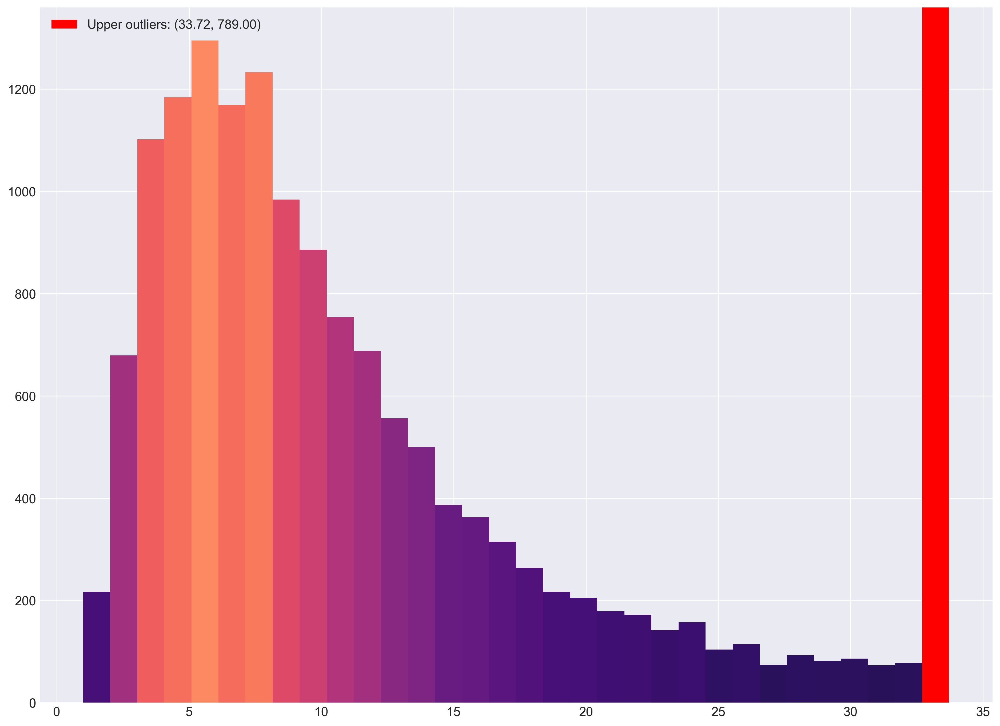

In [191]:
amsterdamumcdb.outliers_histogram(data=sofa_bilirubin['value'],bins=32).show()

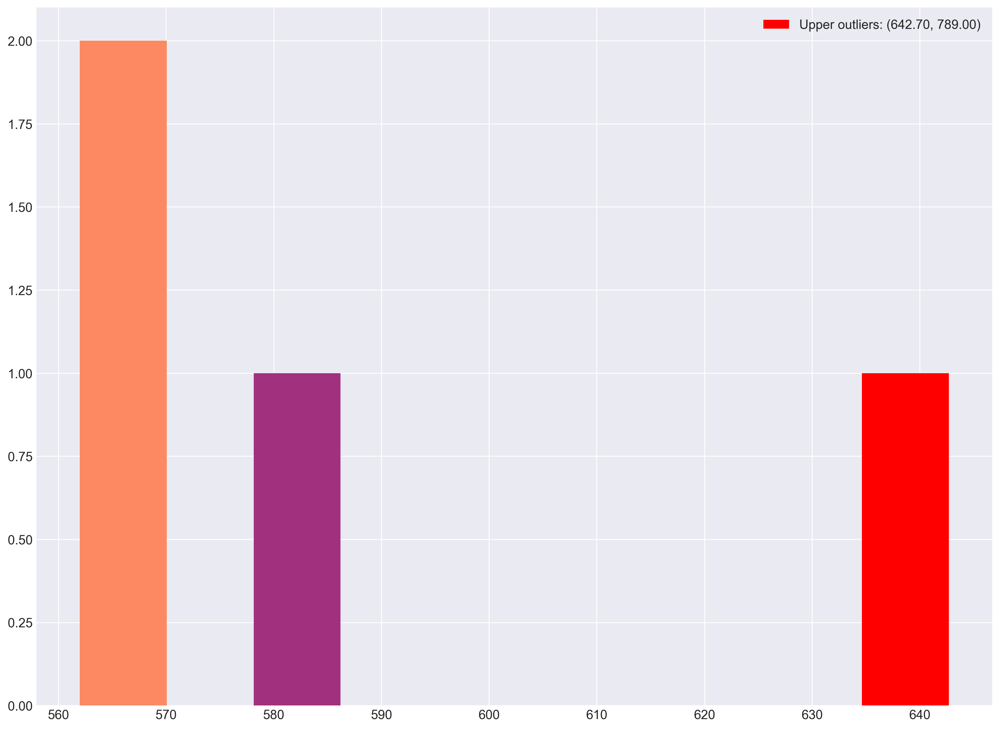

In [192]:
amsterdamumcdb.outliers_histogram(data=sofa_bilirubin.loc[(sofa_bilirubin['value'] > 500) & (sofa_bilirubin['manual_entry'] == False), 'value']).show()

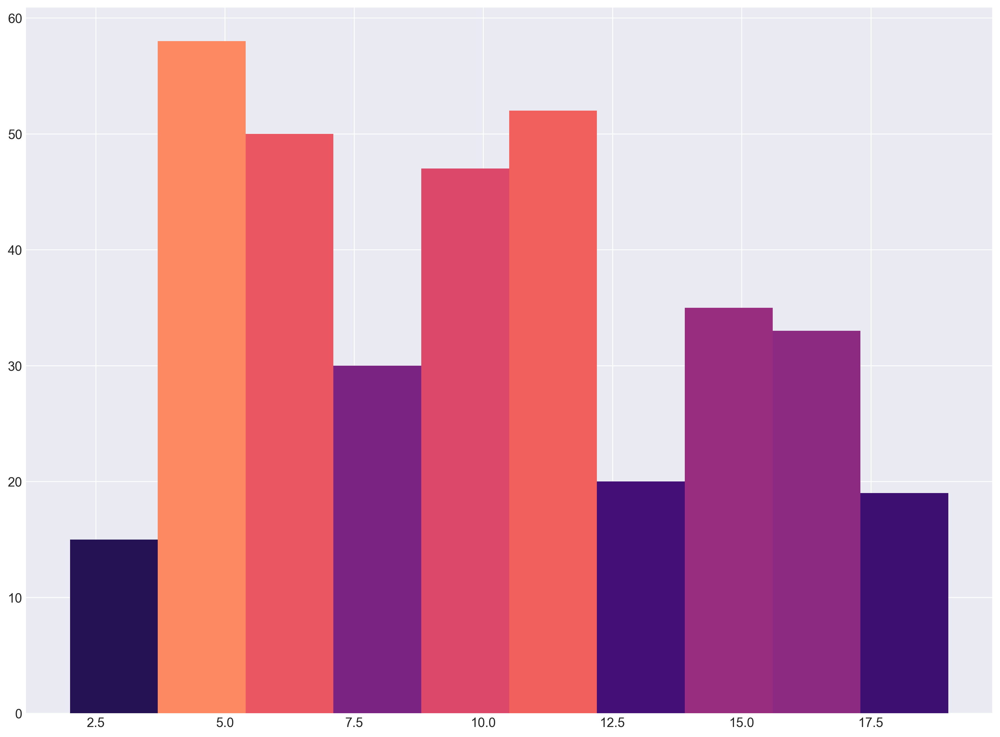

In [193]:
amsterdamumcdb.outliers_histogram(data=sofa_bilirubin.loc[(sofa_bilirubin['value'] < 20) & (sofa_bilirubin['manual_entry'] == True), 'value']).show()

In [194]:
#calculate SOFA liver score:
sofa_bilirubin.loc[:,'sofa_liver_score'] = 0
sofa_bilirubin.loc[(sofa_bilirubin['value'] >= 20) & (sofa_bilirubin['value'] < 33), 'sofa_liver_score'] = 1
sofa_bilirubin.loc[(sofa_bilirubin['value'] >= 33) & (sofa_platelets['value'] < 102), 'sofa_liver_score'] = 2
sofa_bilirubin.loc[(sofa_bilirubin['value'] >= 102) & (sofa_platelets['value'] < 204), 'sofa_liver_score'] = 3
sofa_bilirubin.loc[(sofa_bilirubin['value'] >= 204), 'sofa_liver_score'] = 4

sofa_bilirubin.head()

,admissionid,itemid,item,value,registeredby,manual_entry,time,sofa_liver_score
0,12,6813,Bili Totaal,16.0,ICV_Medisch,True,15,0
1,291,6813,Bili Totaal,15.0,ICV_IC-Verpleegkundig,True,29,0
2,291,6813,Bili Totaal,18.0,ICV_Medisch,True,809,0
3,559,6813,Bili Totaal,11.0,ICV_IC-Verpleegkundig,True,55,0
4,564,6813,Bili Totaal,15.0,ICV_IC-Verpleegkundig,True,93,0


#### SOFA: Cardiovascular - Hypotension

In [195]:
sql_sofa_cardiovascular = """
WITH dosing AS (
    SELECT  
        drugitems.admissionid, 
        itemid,
        item,
        (start - admissions.admittedat)/(1000*60) AS start_time, 
        (stop - admissions.admittedat)/(1000*60) AS stop_time, 
        duration,
        rate,
        rateunit,
        dose,
        doseunit,
        doseunitid,
        doserateperkg,
        doserateunitid,
        doserateunit,
        CASE
            WHEN weightgroup LIKE '59' THEN 55
            WHEN weightgroup LIKE '60' THEN 65
            WHEN weightgroup LIKE '70' THEN 75
            WHEN weightgroup LIKE '80' THEN 85
            WHEN weightgroup LIKE '90' THEN 95
            WHEN weightgroup LIKE '100' THEN 105
            WHEN weightgroup LIKE '110' THEN 115
            ELSE 80 --mean weight for all years
        END as patientweight
    FROM drugitems 
    LEFT JOIN admissions 
    ON drugitems.admissionid = admissions.admissionid
    WHERE ordercategoryid = 65 -- continuous i.v. perfusor
    AND itemid IN (
            7179, -- Dopamine (Inotropin)
            7178, -- Dobutamine (Dobutrex)
            6818, -- Adrenaline (Epinefrine)
            7229  -- Noradrenaline (Norepinefrine)
        )
    AND rate > 0.1
)
SELECT 
    admissionid,
    itemid,
    item,
    duration,
    rate,
    rateunit,
    start_time,
    stop_time,
    CASE 
    --recalculate the dose to µg/kg/min ('gamma')
    WHEN doserateperkg = B'0' AND doseunitid = 11 AND doserateunitid = 4 --unit: µg/min -> µg/kg/min
        THEN CASE 
            WHEN patientweight > 0
            THEN dose/patientweight
            ELSE dose/80 --mean weight
        END
    WHEN doserateperkg = B'0' AND doseunitid = 10 AND
    doserateunitid = 4 --unit: mg/min  -> µg/kg/min
        THEN CASE 
            WHEN patientweight > 0
            THEN dose*1000/patientweight
            ELSE dose*1000/80 --mean weight
        END
    WHEN doserateperkg = B'0' AND doseunitid = 10 AND doserateunitid = 5 --unit: mg/uur  -> µg/kg/min
        THEN CASE
            WHEN patientweight > 0
            THEN dose*1000/patientweight/60
            ELSE dose*1000/80 --mean weight
        END
    WHEN doserateperkg = B'1' AND doseunitid = 11 AND doserateunitid = 5 --unit: µg/kg/min (no conversion needed)
        THEN dose
    WHEN doserateperkg = B'1' AND doseunitid = 11 AND doserateunitid = 5 --unit: µg/kg/uur -> µg/kg/min
        THEN dose/60 
    END AS gamma
    FROM dosing
    WHERE
    -- medication given within 24 hours of ICU stay:
    start_time <= 24*60 AND stop_time >= 0
    ORDER BY admissionid, start_time
"""
sofa_cardiovascular = pd.read_sql(sql_sofa_cardiovascular,con)
sofa_cardiovascular.head()

,admissionid,itemid,item,duration,rate,rateunit,start_time,stop_time,gamma
0,1,7179,Dopamine (Inotropin),301,2.0,ml/uur,50,351,1.666667
1,2,7229,Noradrenaline (Norepinefrine),36,2.0,ml/uur,22,58,0.083333
2,2,7229,Noradrenaline (Norepinefrine),20,3.0,ml/uur,58,78,0.125000
3,2,7229,Noradrenaline (Norepinefrine),15,2.0,ml/uur,78,93,0.083333
4,2,7229,Noradrenaline (Norepinefrine),18,1.0,ml/uur,93,111,0.041667


In [196]:
sofa_cardiovascular_meds = sofa_cardiovascular.groupby(['admissionid','itemid', 'item']).agg(
        total_duration=pd.NamedAgg(column='duration', aggfunc='sum'), 
        max_gamma=pd.NamedAgg(column='gamma', aggfunc='max')
    ).reset_index()

sofa_cardiovascular_meds.head()

,admissionid,itemid,item,total_duration,max_gamma
0,1,7179,Dopamine (Inotropin),301,1.666667
1,2,7229,Noradrenaline (Norepinefrine),89,0.125000
2,4,7179,Dopamine (Inotropin),494,5.000000
3,5,7229,Noradrenaline (Norepinefrine),28,0.166667
4,7,7229,Noradrenaline (Norepinefrine),1606,0.083333


In [197]:
#calculate SOFA cardiovascular score:
sofa_cardiovascular_meds.loc[:,'sofa_cardiovascular_score'] = 0

#dopamine (itemid 7179) <= 5 or dobutamine (itemid 7178) any dose
sofa_cardiovascular_meds.loc[( 
    ((sofa_cardiovascular_meds['itemid'] == 7179) & (sofa_cardiovascular_meds['max_gamma'] <= 5)) | 
    ((sofa_cardiovascular_meds['itemid'] == 7178))
), 'sofa_cardiovascular_score'] = 2

#dopamine (itemid 7179) > 5, epinephrine (itemid 6818) <= 0.1, norepinephrine (itemid 7229) <= 0.1
sofa_cardiovascular_meds.loc[( 
    ((sofa_cardiovascular_meds['itemid'] == 7179) & (sofa_cardiovascular_meds['max_gamma'] > 5) & 
     (sofa_cardiovascular_meds['max_gamma'] < 15)) | 
    ((sofa_cardiovascular_meds['itemid'] == 6818) & (sofa_cardiovascular_meds['max_gamma'] <= 0.1)) | 
    ((sofa_cardiovascular_meds['itemid'] == 7229) & (sofa_cardiovascular_meds['max_gamma'] <= 0.1))  
), 'sofa_cardiovascular_score'] = 3

#dopamine (itemid 7179) > 15, epinephrine (itemid 6818) > 0.1, norepinephrine (itemid 7229) > 0.1

sofa_cardiovascular_meds.loc[( 
    ((sofa_cardiovascular_meds['itemid'] == 7179) & (sofa_cardiovascular_meds['max_gamma'] > 15)) | 
    ((sofa_cardiovascular_meds['itemid'] == 6818) & (sofa_cardiovascular_meds['max_gamma'] > 0.1)) | 
    ((sofa_cardiovascular_meds['itemid'] == 7229) & (sofa_cardiovascular_meds['max_gamma'] > 0.1))  
), 'sofa_cardiovascular_score'] = 4
                             
sofa_cardiovascular_meds.head()

,admissionid,itemid,item,total_duration,max_gamma,sofa_cardiovascular_score
0,1,7179,Dopamine (Inotropin),301,1.666667,2
1,2,7229,Noradrenaline (Norepinefrine),89,0.125000,4
2,4,7179,Dopamine (Inotropin),494,5.000000,2
3,5,7229,Noradrenaline (Norepinefrine),28,0.166667,4
4,7,7229,Noradrenaline (Norepinefrine),1606,0.083333,3


In [198]:
#use mean_abp 'cleansed' dataframe from APACHE score
sofa_cardiovascular_map = mean_abp.groupby(['admissionid', 'itemid', 'item']).agg(
        lowest_mean_abp=pd.NamedAgg(column='value', aggfunc='min')
    ).reset_index()
sofa_cardiovascular_map.head()

,admissionid,itemid,item,lowest_mean_abp
0,0,6642,ABP gemiddeld,68.0
1,1,6642,ABP gemiddeld,59.0
2,2,6642,ABP gemiddeld,64.0
3,3,6642,ABP gemiddeld,91.0
4,4,6642,ABP gemiddeld,52.0


In [199]:
#calculate SOFA cardiovascular score:
sofa_cardiovascular_map.loc[:,'sofa_cardiovascular_score'] = 0
#MAP < 70 
sofa_cardiovascular_map.loc[(sofa_cardiovascular_map['lowest_mean_abp'] < 70), 'sofa_cardiovascular_score'] = 1

sofa_cardiovascular_map.head()

,admissionid,itemid,item,lowest_mean_abp,sofa_cardiovascular_score
0,0,6642,ABP gemiddeld,68.0,1
1,1,6642,ABP gemiddeld,59.0,1
2,2,6642,ABP gemiddeld,64.0,1
3,3,6642,ABP gemiddeld,91.0,0
4,4,6642,ABP gemiddeld,52.0,1


In [200]:
#combine the scores from MAP and cardiovascular medication
sofa_cardiovascular = pd.concat([sofa_cardiovascular_map, sofa_cardiovascular_meds], sort=False).sort_values(by='admissionid')
sofa_cardiovascular.head()

,admissionid,itemid,item,lowest_mean_abp,sofa_cardiovascular_score,total_duration,max_gamma
0,0,6642,ABP gemiddeld,68.0,1,NaN,NaN
1,1,6642,ABP gemiddeld,59.0,1,NaN,NaN
0,1,7179,Dopamine (Inotropin),NaN,2,301.0,1.666667
1,2,7229,Noradrenaline (Norepinefrine),NaN,4,89.0,0.125000
2,2,6642,ABP gemiddeld,64.0,1,NaN,NaN


#### SOFA: Central nervous system

In [201]:
gcs.head()

,admissionid,eyes_score,motor_score,verbal_score,registeredby,time,gcs_score,priority,a2_gcs_score
0,0,4,6.0,5.0,ICV_Medisch,734,15.0,1,0.0
1,1,4,6.0,5.0,ICV_Medisch,1372,15.0,1,0.0
2,2,4,6.0,5.0,ICV_Medisch,1256,15.0,1,0.0
3,4,1,1.0,1.0,ICV_Medisch,103,3.0,1,12.0
4,5,4,6.0,5.0,ICV_Medisch Staflid,22,15.0,1,0.0


In [202]:
#use the 'cleansed' APACHE II GCS dataframe
sofa_cns = gcs.groupby(['admissionid']).agg(
        min_gcs=pd.NamedAgg(column='gcs_score', aggfunc='min')
    ).reset_index()
sofa_cns.head()

,admissionid,min_gcs
0,0,15.0
1,1,15.0
2,2,15.0
3,4,3.0
4,5,15.0


In [203]:
#calculate SOFA cardiovascular score:
sofa_cns.loc[:,'sofa_cns_score'] = 0
#MAP < 70 
sofa_cns.loc[(sofa_cns['min_gcs'] >= 13) & (sofa_cns['min_gcs'] < 15), 'sofa_cns_score'] = 1
sofa_cns.loc[(sofa_cns['min_gcs'] >= 10) & (sofa_cns['min_gcs'] < 13), 'sofa_cns_score'] = 2
sofa_cns.loc[(sofa_cns['min_gcs'] >= 6) & (sofa_cns['min_gcs'] < 10), 'sofa_cns_score'] = 3
sofa_cns.loc[(sofa_cns['min_gcs'] < 6), 'sofa_cns_score'] = 4
sofa_cns.head()

,admissionid,min_gcs,sofa_cns_score
0,0,15.0,0
1,1,15.0,0
2,2,15.0,0
3,4,3.0,4
4,5,15.0,0


#### SOFA: Renal - Creatinine or urine output

In [204]:
# SOFA urine output - possible parameters
#get urineoutput
sql_renal_params = """
SELECT DISTINCT itemid, item FROM numericitems
WHERE fluidout > 0
"""
renal_params = pd.read_sql(sql_renal_params, con)
renal_params.head()

,itemid,item
0,8699,Thoraxdrain1 Productie
1,8700,Thoraxdrain2 Productie
2,8701,Thoraxdrain3 Productie
3,8717,Wonddrain1 Productie
4,8719,Wonddrain2 Productie


In [205]:
renal_params

,itemid,item
0,8699,Thoraxdrain1 Productie
1,8700,Thoraxdrain2 Productie
2,8701,Thoraxdrain3 Productie
3,8717,Wonddrain1 Productie
4,8719,Wonddrain2 Productie
5,8720,Wonddrain3 Productie
6,8721,Wonddrain4 Productie
7,8770,Ventrikeldrain1 Uit
8,8772,Pericarddrain Uit
9,8774,Maaghevel


In [206]:
#get urineoutput
sql_sofa_renal_urine_output = """ 
SELECT 
    n.admissionid,
    n.itemid,
    n.item,
    n.value,
    n.registeredby,
    (n.measuredat - a.admittedat)/(1000*60) AS time
FROM numericitems n
LEFT JOIN admissions a ON
    n.admissionid = a.admissionid
WHERE n.itemid IN (
    8794, --UrineCAD
    8796, --UrineSupraPubis
    8798, --UrineSpontaan
    8800, --UrineIncontinentie
    8803, --UrineUP
    10743, --Nefrodrain li Uit
    10745, --Nefrodrain re Uit
    19921, --UrineSplint Li
    19922 --UrineSplint Re
    )
-- measurements within 24 hours of ICU stay (use 30 minutes before admission to allow for time differences):
AND (n.measuredat - a.admittedat) <= 1000*60*60*24 AND (n.measuredat - a.admittedat) >= 0    
 
"""
sofa_renal_urine_output = pd.read_sql(sql_sofa_renal_urine_output, con)
sofa_renal_urine_output.head()

,admissionid,itemid,item,value,registeredby,time
0,0,8794,UrineCAD,40.0,ICV_IC-Verpleegkundig,1272
1,0,8794,UrineCAD,50.0,ICV_IC-Verpleegkundig,912
2,0,8794,UrineCAD,50.0,ICV_IC-Verpleegkundig,1212
3,0,8794,UrineCAD,60.0,ICV_IC-Verpleegkundig,1152
4,0,8794,UrineCAD,60.0,ICV_IC-Verpleegkundig,1392


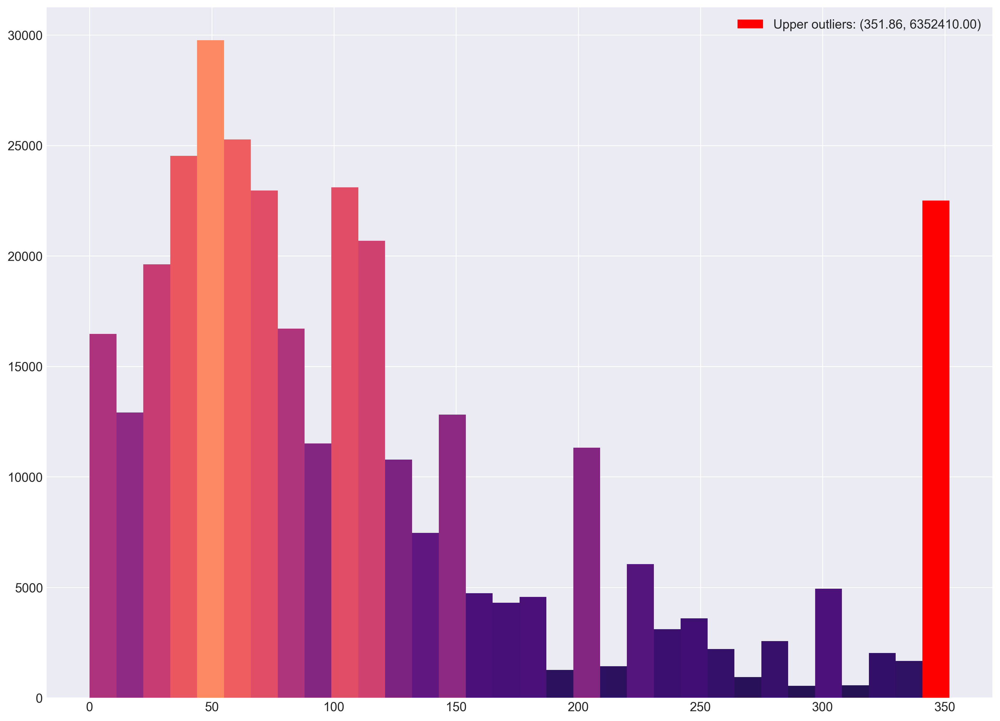

In [207]:
amsterdamumcdb.outliers_histogram(data=sofa_renal_urine_output['value'], bins=32).show()

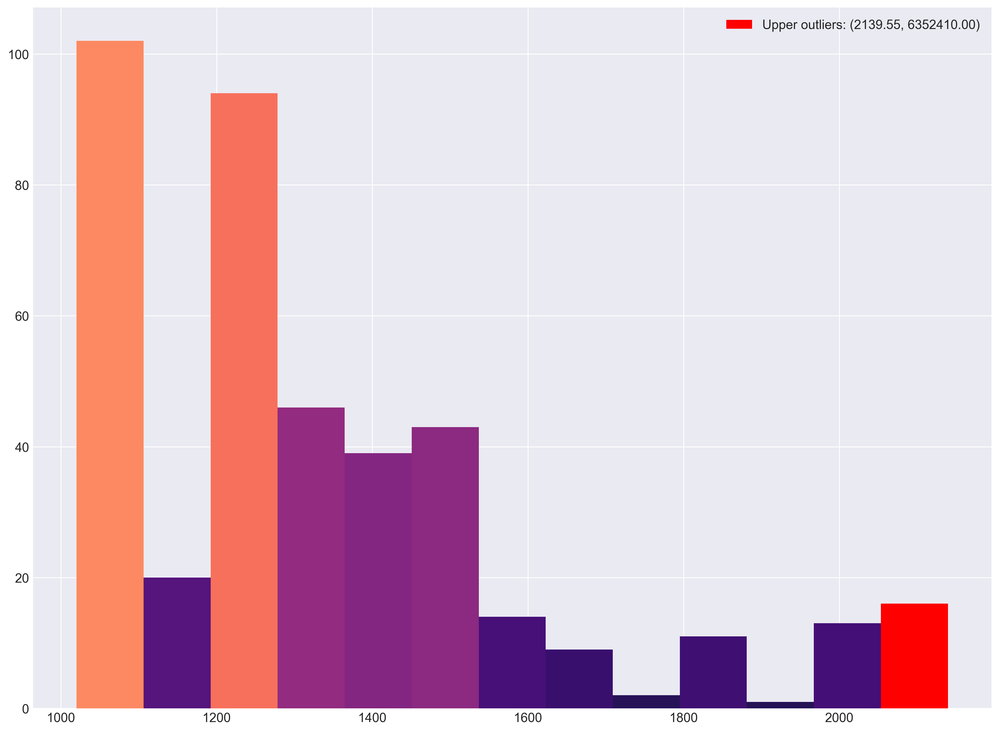

In [208]:
amsterdamumcdb.outliers_histogram(data=sofa_renal_urine_output.loc[(sofa_renal_urine_output['value'] > 1000), 'value']).show()

In [209]:
#looking at the data it's relevatively easy to spot most lab collection errors (i.e. single outliers between relatively 
# normal values
# TO DO: algorithm to remove these errors, but not 'real' outliers
sofa_renal_urine_output.loc[sofa_renal_urine_output['admissionid'].isin(
    sofa_renal_urine_output.loc[(sofa_renal_urine_output['value'] > 2500), 'admissionid'])
             ].sort_values(by='admissionid').head(5)

,admissionid,itemid,item,value,registeredby,time
57618,4170,8794,UrineCAD,85.0,ICV_MC-Verpleegkundig,743
57633,4170,8794,UrineCAD,2550.0,ICV_IC-Verpleegkundig,23
57632,4170,8794,UrineCAD,380.0,ICV_IC-Verpleegkundig,143
57631,4170,8794,UrineCAD,320.0,ICV_IC-Verpleegkundig,203
57630,4170,8794,UrineCAD,320.0,ICV_IC-Verpleegkundig,83


In [210]:
#probably decimal error when entering volumes > 2500
sofa_renal_urine_output.loc[(sofa_renal_urine_output['value'] > 2500), 'value'] = sofa_renal_urine_output['value']/10

In [211]:
#remove extreme outliers, most likely data entry error)
sofa_renal_urine_output.loc[(sofa_renal_urine_output['value'] > 4500), 'value'] = np.NaN
sofa_renal_urine_output = sofa_renal_urine_output.dropna()

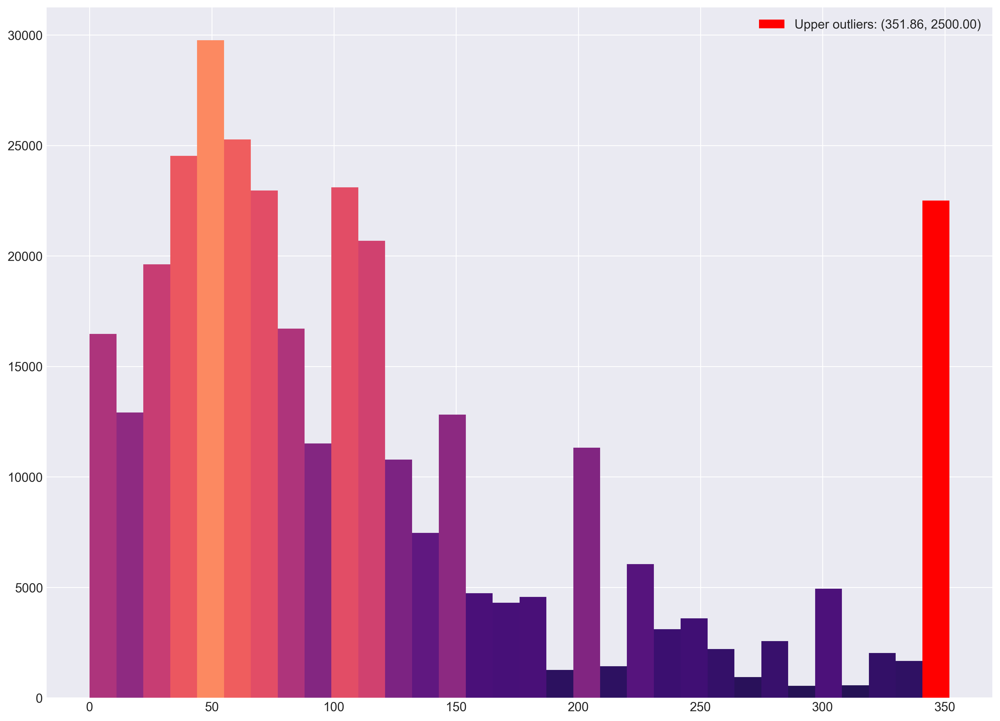

In [212]:
amsterdamumcdb.outliers_histogram(data=sofa_renal_urine_output['value'], bins=32).show()

In [213]:
#get urine output per 24 hours
#use mean_abp 'clean' dataframe from APACHE score
sofa_renal_daily_urine_output = sofa_renal_urine_output.groupby(['admissionid']).agg(
        daily_urine_output=pd.NamedAgg(column='value', aggfunc='sum')
    ).reset_index()
sofa_renal_daily_urine_output.head()

,admissionid,daily_urine_output
0,0,2005.0
1,1,2540.0
2,2,1785.0
3,3,2301.0
4,4,1155.0


In [214]:
#calculate SOFA renal score for urine output:
sofa_renal_daily_urine_output.loc[:,'sofa_renal_score'] = 0

#urine output < 500 ml/day
sofa_renal_daily_urine_output.loc[( 
    ((sofa_renal_daily_urine_output['daily_urine_output'] < 500) & 
     (sofa_renal_daily_urine_output['daily_urine_output'] > 200))
), 'sofa_renal_score'] = 3

#urine output < 200 ml/day
sofa_renal_daily_urine_output.loc[( 
    ((sofa_renal_daily_urine_output['daily_urine_output'] < 200))
), 'sofa_renal_score'] = 4
             
sofa_renal_daily_urine_output.head()

,admissionid,daily_urine_output,sofa_renal_score
0,0,2005.0,0
1,1,2540.0,0
2,2,1785.0,0
3,3,2301.0,0
4,4,1155.0,0


In [215]:
#get highest creatinine per 24 hours 
#use creatinine 'cleansed' dataframe from APACHE score
sofa_renal_creatinine = creatinine.groupby(['admissionid']).agg(
        max_creatinine=pd.NamedAgg(column='value', aggfunc='max')
    ).reset_index()
sofa_renal_creatinine.head()

,admissionid,max_creatinine
0,0,86.0
1,1,91.0
2,2,81.0
3,3,113.0
4,4,98.0


In [216]:
#calculate SOFA renal score for creatinine:
sofa_renal_creatinine.loc[:,'sofa_renal_score'] = 0

#creatinine 110-170 umol/l
sofa_renal_creatinine.loc[( 
    ((sofa_renal_creatinine['max_creatinine'] >= 110) & 
     (sofa_renal_creatinine['max_creatinine'] < 171))
), 'sofa_renal_score'] = 1

#creatinine 171-299 umol/l
sofa_renal_creatinine.loc[( 
    ((sofa_renal_creatinine['max_creatinine'] >= 171) & 
     (sofa_renal_creatinine['max_creatinine'] < 300))
), 'sofa_renal_score'] = 2

#creatinine 300-440 umol/l
sofa_renal_creatinine.loc[( 
    ((sofa_renal_creatinine['max_creatinine'] >= 300) & 
     (sofa_renal_creatinine['max_creatinine'] <= 440))
), 'sofa_renal_score'] = 3

#creatinine >440 umol/l
sofa_renal_creatinine.loc[( 
    ((sofa_renal_creatinine['max_creatinine'] > 440))
), 'sofa_renal_score'] = 4

sofa_renal_creatinine.head()

,admissionid,max_creatinine,sofa_renal_score
0,0,86.0,0
1,1,91.0,0
2,2,81.0,0
3,3,113.0,1
4,4,98.0,0


In [217]:
#combine the scores from creatinine and urine output
sofa_renal = pd.concat([sofa_renal_creatinine, sofa_renal_daily_urine_output], sort=False).sort_values(by='admissionid')
sofa_renal.head()

,admissionid,max_creatinine,sofa_renal_score,daily_urine_output
0,0,86.0,0,NaN
0,0,NaN,0,2005.0
1,1,91.0,0,NaN
1,1,NaN,0,2540.0
2,2,81.0,0,NaN


In [218]:
sofa_renal.head()

,admissionid,max_creatinine,sofa_renal_score,daily_urine_output
0,0,86.0,0,NaN
0,0,NaN,0,2005.0
1,1,91.0,0,NaN
1,1,NaN,0,2540.0
2,2,81.0,0,NaN


In [219]:
#merge the scores
sofa = admissions['admissionid']

#max respiration score 
scores = sofa_respiration.groupby('admissionid')['sofa_respiration_score'].max().to_frame(
    'sofa_respiration_score').sort_values(by=['admissionid']).reset_index()
sofa = pd.merge(sofa, scores, on='admissionid', how='left')

#max coagulation score 
scores = sofa_platelets.groupby('admissionid')['sofa_coagulation_score'].max().to_frame(
    'sofa_coagulation_score').sort_values(by=['admissionid']).reset_index()
sofa = pd.merge(sofa, scores, on='admissionid', how='left')

#max liver score 
scores = sofa_bilirubin.groupby('admissionid')['sofa_liver_score'].max().to_frame(
    'sofa_liver_score').sort_values(by=['admissionid']).reset_index()
sofa = pd.merge(sofa, scores, on='admissionid', how='left')

#max cardiovascular score 
scores = sofa_cardiovascular.groupby('admissionid')['sofa_cardiovascular_score'].max().to_frame(
    'sofa_cardiovascular_score').sort_values(by=['admissionid']).reset_index()
sofa = pd.merge(sofa, scores, on='admissionid', how='left')

#max central nervous system score 
scores = sofa_cns.groupby('admissionid')['sofa_cns_score'].max().to_frame(
    'sofa_cns_score').sort_values(by=['admissionid']).reset_index()
sofa = pd.merge(sofa, scores, on='admissionid', how='left')

#max renal score 
scores = sofa_renal.groupby('admissionid')['sofa_renal_score'].max().to_frame(
    'sofa_renal_score').sort_values(by=['admissionid']).reset_index()
sofa = pd.merge(sofa, scores, on='admissionid', how='left')

#calculate total score (add al values in columns)
total_scores = sofa.set_index('admissionid').sum(axis=1, skipna=True).to_frame('sofa_total_score')
sofa = pd.merge(sofa, total_scores, on='admissionid', how='left')
sofa.head()

,admissionid,sofa_respiration_score,sofa_coagulation_score,sofa_liver_score,sofa_cardiovascular_score,sofa_cns_score,sofa_renal_score,sofa_total_score
0,0,3.0,0.0,NaN,1.0,0.0,0.0,4.0
1,1,2.0,1.0,NaN,2.0,0.0,0.0,5.0
2,2,2.0,0.0,NaN,4.0,0.0,0.0,6.0
3,4,3.0,0.0,0.0,2.0,4.0,0.0,9.0
4,5,1.0,0.0,0.0,4.0,0.0,0.0,5.0


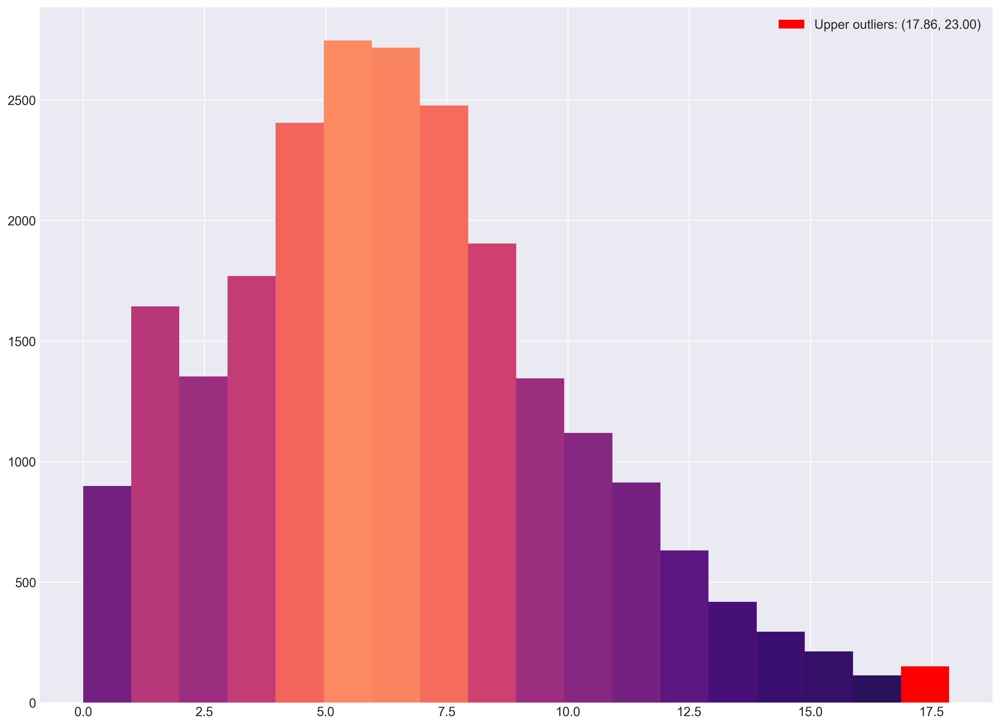

In [220]:
amsterdamumcdb.outliers_histogram(data=sofa['sofa_total_score'],bins=18).show()

Add location for easier selection:

In [221]:
sofa = pd.merge(sofa, admissions[['admissionid','location','urgency']], on='admissionid', how='left')
sofa.loc[:,'urgency'] = pd.to_numeric(sofa.loc[:,'urgency'])

In [222]:
sofa_total = sofa.sofa_total_score.median()
sofa_iqr1_total = sofa.sofa_total_score.quantile(0.25)
sofa_iqr2_total = sofa.sofa_total_score.quantile(0.75)

sofa_ICU = sofa.loc[sofa['location'].str.contains('IC'), 'sofa_total_score'].median()
sofa_iqr1_ICU = sofa.loc[sofa['location'].str.contains('IC'), 'sofa_total_score'].quantile(0.25)
sofa_iqr2_ICU = sofa.loc[sofa['location'].str.contains('IC'), 'sofa_total_score'].quantile(0.75)

sofa_MCU = sofa.loc[sofa['location'].str.contains('^MC$'), 'sofa_total_score'].median()
sofa_iqr1_MCU = sofa.loc[sofa['location'].str.contains('^MC$'), 'sofa_total_score'].quantile(0.25)
sofa_iqr2_MCU = sofa.loc[sofa['location'].str.contains('^MC$'), 'sofa_total_score'].quantile(0.75)

In [223]:
sofa_total_urgent = sofa.loc[sofa['urgency'] == 1].sofa_total_score.median()
sofa_iqr1_total_urgent = sofa.loc[sofa['urgency'] == 1].sofa_total_score.quantile(0.25)
sofa_iqr2_total_urgent = sofa.loc[sofa['urgency'] == 1].sofa_total_score.quantile(0.75)

sofa_ICU_urgent = sofa.loc[(sofa['urgency'] == 1) & sofa['location'].str.contains('IC'), 'sofa_total_score'].median()
sofa_iqr1_ICU_urgent = sofa.loc[(sofa['urgency'] == 1) & sofa['location'].str.contains('IC'), 'sofa_total_score'].quantile(0.25)
sofa_iqr2_ICU_urgent = sofa.loc[(sofa['urgency'] == 1) & sofa['location'].str.contains('IC'), 'sofa_total_score'].quantile(0.75)

sofa_MCU_urgent = sofa.loc[(sofa['urgency'] == 1) & sofa['location'].str.contains('^MC$'), 'sofa_total_score'].median()
sofa_iqr1_MCU_urgent = sofa.loc[(sofa['urgency'] == 1) & sofa['location'].str.contains('^MC$'), 'sofa_total_score'].quantile(0.25)
sofa_iqr2_MCU_urgent = sofa.loc[(sofa['urgency'] == 1) & sofa['location'].str.contains('^MC$'), 'sofa_total_score'].quantile(0.75)

In [224]:
sofa_total_nonurgent = sofa.loc[sofa['urgency'] == 0].sofa_total_score.median()
sofa_iqr1_total_nonurgent = sofa.loc[sofa['urgency'] == 0].sofa_total_score.quantile(0.25)
sofa_iqr2_total_nonurgent = sofa.loc[sofa['urgency'] == 0].sofa_total_score.quantile(0.75)

sofa_ICU_nonurgent = sofa.loc[(sofa['urgency'] == 0) & sofa['location'].str.contains('IC'), 'sofa_total_score'].median()
sofa_iqr1_ICU_nonurgent = sofa.loc[(sofa['urgency'] == 0) & sofa['location'].str.contains('IC'), 'sofa_total_score'].quantile(0.25)
sofa_iqr2_ICU_nonurgent = sofa.loc[(sofa['urgency'] == 0) & sofa['location'].str.contains('IC'), 'sofa_total_score'].quantile(0.75)

sofa_MCU_nonurgent = sofa.loc[(sofa['urgency'] == 0) & sofa['location'].str.contains('^MC$'), 'sofa_total_score'].median()
sofa_iqr1_MCU_nonurgent = sofa.loc[(sofa['urgency'] == 0) & sofa['location'].str.contains('^MC$'), 'sofa_total_score'].quantile(0.25)
sofa_iqr2_MCU_nonurgent = sofa.loc[(sofa['urgency'] == 0) & sofa['location'].str.contains('^MC$'), 'sofa_total_score'].quantile(0.75)

## Create the actual table in html

In [225]:
display(Markdown("""
<table>
    <thead>
        <tr>
            <th style="text-align:left;">Patient Characteristics</th>
            <th style="text-align:right;">Total</th>
            <th style="text-align:right;">ICU</th>
            <th style="text-align:right;">MCU</th>
        </tr>
        <tr>
    </thead>
    <tbody>
        <tr>
            <td style="text-align:left">Distinct patients, no.</td>
            <td>{no_patients_total}</td>
            <td>{no_patients_ICU}</td>
            <td>{no_patients_MCU}</td>
        </tr>    
        <tr>
            <td style="text-align:left">ICU admissions, no.</td>
            <td>{no_admissions_total}</td>
            <td>{no_admissions_ICU}</td>
            <td>{no_admissions_MCU}</td>
        </tr>    
        <tr>
            <td style="text-align:left">ICU length of stay, days (median [IQR])</td>
            <td>{los_total:.2f} [{los_iqr1_total:.2f}, {los_iqr2_total:.2f}]</td>
            <td>{los_ICU:.2f} [{los_iqr1_ICU:.2f}, {los_iqr2_ICU:.2f}]</td>
            <td>{los_MCU:.2f} [{los_iqr1_MCU:.2f}, {los_iqr2_MCU:.2f}]</td>
        </tr>    
        <tr>
            <th style="text-align:left" colspan=4>Gender</th>
        </tr>    
        <tr>
            <td style="text-align:left">Male, no. (%)</td>
            <td>{male_total} ({male_pct_total:.2f})</td>
            <td>{male_ICU} ({male_pct_ICU:.2f})</td>
            <td>{male_MCU} ({male_pct_MCU:.2f})</td>
        </tr>    
        <tr>          
            <td style="text-align:left">Female, no. (%)</td>
            <td>{female_total} ({female_pct_total:.2f})</td>
            <td>{female_ICU} ({female_pct_ICU:.2f})</td>
            <td>{female_MCU} ({female_pct_MCU:.2f})</td>
        </tr>    
        <tr>
            <td style="text-align:left">Unknown gender, no. (%)</td>
            <td>{gender_na_total} ({gender_na_pct_total:.2f})</td>
            <td>{gender_na_ICU} ({gender_na_pct_ICU:.2f})</td>
            <td>{gender_na_MCU} ({gender_na_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Age</th>
        </tr>
        <tr>
            <td style="text-align:left">18-39 years, no. (%)</td>
            <td>{age_18_39_total} ({age_18_39_pct_total:.2f})
            <td>{age_18_39_ICU} ({age_18_39_pct_ICU:.2f})
            <td>{age_18_39_MCU} ({age_18_39_pct_MCU:.2f})
        </tr>
        <tr>
            <td style="text-align:left">40-49 years, no. (%)</td>
            <td>{age_40_49_total} ({age_40_49_pct_total:.2f})
            <td>{age_40_49_ICU} ({age_40_49_pct_ICU:.2f})
            <td>{age_40_49_MCU} ({age_40_49_pct_MCU:.2f})
        </tr>
        <tr>
            <td style="text-align:left">50-59 years, no. (%)</td>
            <td>{age_50_59_total} ({age_50_59_pct_total:.2f})
            <td>{age_50_59_ICU} ({age_50_59_pct_ICU:.2f})
            <td>{age_50_59_MCU} ({age_50_59_pct_MCU:.2f})
        </tr>
        <tr>
            <td style="text-align:left">60-69 years, no. (%)</td>
            <td>{age_60_69_total} ({age_60_69_pct_total:.2f})
            <td>{age_60_69_ICU} ({age_60_69_pct_ICU:.2f})
            <td>{age_60_69_MCU} ({age_60_69_pct_MCU:.2f})
        </tr>
        <tr>
            <td style="text-align:left">70-79 years, no. (%)</td>
            <td>{age_70_79_total} ({age_70_79_pct_total:.2f})
            <td>{age_70_79_ICU} ({age_70_79_pct_ICU:.2f})
            <td>{age_70_79_MCU} ({age_70_79_pct_MCU:.2f})
        </tr>
        <tr>
            <td style="text-align:left">80+ years, no. (%)</td>
            <td>{age_80_total} ({age_80_pct_total:.2f})
            <td>{age_80_ICU} ({age_80_pct_ICU:.2f})
            <td>{age_80_MCU} ({age_80_pct_MCU:.2f})
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Admission Year</th>
        </tr>
        <tr>
            <td style="text-align:left">2003-2009, no. (%)</td>
            <td>{admission_year_2003_total} ({admission_year_2003_pct_total:.2f})
            <td>{admission_year_2003_ICU} ({admission_year_2003_pct_ICU:.2f})
            <td>{admission_year_2003_MCU} ({admission_year_2003_pct_MCU:.2f})
        </tr>
        <tr>
            <td style="text-align:left">2010-2016, no. (%)</td>
            <td>{admission_year_2010_total} ({admission_year_2010_pct_total:.2f})
            <td>{admission_year_2010_ICU} ({admission_year_2010_pct_ICU:.2f})
            <td>{admission_year_2010_MCU} ({admission_year_2010_pct_MCU:.2f})
        <tr>
            <th style="text-align:left" colspan=4>Admission type</th>
        </tr>
        <tr>
            <td style="text-align:left">Surgical admissions, no. (%)</td>
            <td>{surgical_total} ({surgical_pct_total:.2f})</td>
            <td>{surgical_ICU} ({surgical_pct_ICU:.2f})</td>
            <td>{surgical_MCU} ({surgical_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Medical admissions, no. (%)</td>
            <td>{medical_total} ({medical_pct_total:.2f})</td>
            <td>{medical_ICU} ({medical_pct_ICU:.2f})</td>
            <td>{medical_MCU} ({medical_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Surgical/Medical Unknown, no. (%)</td>
            <td>{medical_surgical_na_total} ({medical_surgical_na_pct_total:.2f})</td>
            <td>{medical_surgical_na_ICU} ({medical_surgical_na_pct_ICU:.2f})</td>
            <td>{medical_surgical_na_MCU} ({medical_surgical_na_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Urgent admissions, no. (%)</td>
            <td>{urgency_total} ({urgency_pct_total:.2f})</td>
            <td>{urgency_ICU} ({urgency_pct_ICU:.2f})</td>
            <td>{urgency_MCU} ({urgency_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Reason for admission</td>
        </tr>
        <tr>
            <td style="text-align:left">Cardiac surgery, no (%)</td>
            <td>{reason_car_surg_total} ({reason_car_surg_pct_total:.2f})</td>
            <td>{reason_car_surg_ICU} ({reason_car_surg_pct_ICU:.2f})</td>
            <td>{reason_car_surg_MCU} ({reason_car_surg_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Neurosurgery, no. (%)</td>
            <td>{reason_neu_surg_total} ({reason_neu_surg_pct_total:.2f})</td>
            <td>{reason_neu_surg_ICU} ({reason_neu_surg_pct_ICU:.2f})</td>
            <td>{reason_neu_surg_MCU} ({reason_neu_surg_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Gastro-intestinal surgery, no. (%)</td>
            <td>{reason_gi_surg_total} ({reason_gi_surg_pct_total:.2f})</td>
            <td>{reason_gi_surg_ICU} ({reason_gi_surg_pct_ICU:.2f})</td>
            <td>{reason_gi_surg_MCU} ({reason_gi_surg_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Cardiac arrest, no. (%)</td>
            <td>{reason_car_arrest_total} ({reason_car_arrest_pct_total:.2f})</td>
            <td>{reason_car_arrest_ICU} ({reason_car_arrest_pct_ICU:.2f})</td>
            <td>{reason_car_arrest_MCU} ({reason_car_arrest_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Vascular surgery, no. (%)</td>
            <td>{reason_vasc_surg_total} ({reason_vasc_surg_pct_total:.2f})</td>
            <td>{reason_vasc_surg_ICU} ({reason_vasc_surg_pct_ICU:.2f})</td>
            <td>{reason_vasc_surg_MCU} ({reason_vasc_surg_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Trauma, no. (%)</td>
            <td>{reason_trauma_total} ({reason_trauma_pct_total:.2f})</td>
            <td>{reason_trauma_ICU} ({reason_trauma_pct_ICU:.2f})</td>
            <td>{reason_trauma_MCU} ({reason_trauma_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Sepsis, no. (%)</td>
            <td>{reason_sepsis_total} ({reason_sepsis_pct_total:.2f})</td>
            <td>{reason_sepsis_ICU} ({reason_sepsis_pct_ICU:.2f})</td>
            <td>{reason_sepsis_MCU} ({reason_sepsis_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Respiratory failure, no. (%)</td>
            <td>{reason_resp_failure_total} ({reason_resp_failure_pct_total:.2f})</td>
            <td>{reason_resp_failure_ICU} ({reason_resp_failure_pct_ICU:.2f})</td>
            <td>{reason_resp_failure_MCU} ({reason_resp_failure_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Supportive therapies</td>
        </tr>
        <tr>
            <td style="text-align:left">Vasopressors and inotropes, no. (%)</td>
            <td>{vaso_ino_total} ({vaso_ino_pct_total:.2f})</td>
            <td>{vaso_ino_ICU} ({vaso_ino_pct_ICU:.2f})</td>
            <td>{vaso_ino_MCU} ({vaso_ino_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Mechanical ventilation, no. (%)</td>
            <td>{mv_total} ({mv_pct_total:.2f})</td>
            <td>{mv_ICU} ({mv_pct_ICU:.2f})</td>
            <td>{mv_MCU} ({mv_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Renal replacement therapy, no. (%)</td>
            <td>{renal_replacement_total} ({renal_replacement_pct_total:.2f})</td>
            <td>{renal_replacement_ICU} ({renal_replacement_pct_ICU:.2f})</td>
            <td>{renal_replacement_MCU} ({renal_replacement_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Outcome</th>
        </tr>
        <tr>
            <td style="text-align:left">Survival at unit discharge, no. (%)</td>
            <td>{alive_total} ({alive_pct_total:.2f})</td>
            <td>{alive_ICU}({alive_pct_ICU:.2f})</td>
            <td>{alive_MCU} ({alive_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Death at unit discharge, no. (%)</td>
            <td>{expired_total} ({expired_pct_total:.2f})</td>
            <td>{expired_ICU} ({expired_pct_ICU:.2f})</td>
            <td>{expired_MCU} ({expired_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Survival status unknown, no. (%)</td>
            <td>{alive_na_total} ({alive_na_pct_total:.2f})</td>
            <td>{alive_na_ICU} ({alive_na_pct_ICU:.2f})</td>
            <td>{alive_na_MCU} ({alive_na_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <td style="text-align:left">Death < 1 year after discharge, no. (%)</td>
            <td>{expired_1y_total} ({expired_1y_pct_total:.2f})</td>
            <td>{expired_1y_ICU} ({expired_1y_pct_ICU:.2f})</td>
            <td>{expired_1y_MCU} ({expired_1y_pct_MCU:.2f})</td>
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Severity Scores</th>
        </tr>
        <tr>
            <td style="text-align:left" colspan=4><i>Urgent patients</i></td>
        </tr>
        <tr>
            <td style="text-align:left">APACHE II score (median [IQR])</td>
            <td>{apache_ii_total_urgent:.0f} [{apache_ii_iqr1_total_urgent:.0f}, {apache_ii_iqr2_total_urgent:.0f}]</td>
            <td>{apache_ii_ICU_urgent:.0f} [{apache_ii_iqr1_ICU_urgent:.0f}, {apache_ii_iqr2_ICU_urgent:.0f}]</td>
            <td>{apache_ii_MCU_urgent:.0f} [{apache_ii_iqr1_MCU_urgent:.0f}, {apache_ii_iqr2_MCU_urgent:.0f}]</td>
        </tr>
        <tr>
            <td style="text-align:left">SOFA score (day 1) (median [IQR])</td>
            <td>{sofa_total_urgent:.0f} [{sofa_iqr1_total_urgent:.0f}, {sofa_iqr2_total_urgent:.0f}]</td>
            <td>{sofa_ICU_urgent:.0f} [{sofa_iqr1_ICU_urgent:.0f}, {sofa_iqr2_ICU_urgent:.0f}]</td>
            <td>{sofa_MCU_urgent:.0f} [{sofa_iqr1_MCU_urgent:.0f}, {sofa_iqr2_MCU_urgent:.0f}]</td>
        </tr>
        <tr>
            <td style="text-align:left" colspan=4><i>Elective patients</i></td>
        </tr>
        <tr>
            <td style="text-align:left">APACHE II score (median [IQR])</td>
            <td>{apache_ii_total_nonurgent:.0f} [{apache_ii_iqr1_total_nonurgent:.0f}, {apache_ii_iqr2_total_nonurgent:.0f}]</td>
            <td>{apache_ii_ICU_nonurgent:.0f} [{apache_ii_iqr1_ICU_nonurgent:.0f}, {apache_ii_iqr2_ICU_nonurgent:.0f}]</td>
            <td>{apache_ii_MCU_nonurgent:.0f} [{apache_ii_iqr1_MCU_nonurgent:.0f}, {apache_ii_iqr2_MCU_nonurgent:.0f}]</td>
        </tr>
        <tr>
            <td style="text-align:left">SOFA score (day 1) (median [IQR])</td>
            <td>{sofa_total_nonurgent:.0f} [{sofa_iqr1_total_nonurgent:.0f}, {sofa_iqr2_total_nonurgent:.0f}]</td>
            <td>{sofa_ICU_nonurgent:.0f} [{sofa_iqr1_ICU_nonurgent:.0f}, {sofa_iqr2_ICU_nonurgent:.0f}]</td>
            <td>{sofa_MCU_nonurgent:.0f} [{sofa_iqr1_MCU_nonurgent:.0f}, {sofa_iqr2_MCU_nonurgent:.0f}]</td>
        </tr>
    </tbody>
</table>
""".format(
            #No. patients
            no_patients_total = no_patients_total,
            no_patients_ICU = no_patients_ICU,
            no_patients_MCU = no_patients_MCU,

            #No. admissions
            no_admissions_total = no_admissions_total,
            no_admissions_ICU = no_admissions_ICU,
            no_admissions_MCU = no_admissions_MCU,

            #Length of stay
            los_total = los_total,
            los_iqr1_total = los_iqr1_total,
            los_iqr2_total = los_iqr2_total,

            los_ICU = los_ICU,
            los_iqr1_ICU = los_iqr1_ICU,
            los_iqr2_ICU = los_iqr2_ICU,

            los_MCU = los_MCU,
            los_iqr1_MCU = los_iqr1_MCU,
            los_iqr2_MCU = los_iqr2_MCU,

            #Gender
            ## Male
            male_total = male_total,
            male_pct_total = male_pct_total,

            male_ICU = male_ICU,
            male_pct_ICU = male_pct_ICU,

            male_MCU = male_MCU,
            male_pct_MCU = male_pct_MCU,


            ## Female
            female_total = female_total,
            female_pct_total = female_pct_total,

            female_ICU = female_ICU,
            female_pct_ICU = female_pct_ICU,

            female_MCU = female_MCU,
            female_pct_MCU = female_pct_MCU,

            ## Unknown
            gender_na_total = gender_na_total,
            gender_na_pct_total = gender_na_pct_total,

            gender_na_ICU = gender_na_ICU,
            gender_na_pct_ICU = gender_na_pct_ICU,

            gender_na_MCU = gender_na_MCU,
            gender_na_pct_MCU = gender_na_pct_MCU,

            #age
            ## 18-39
            age_18_39_total = age_18_39_total,
            age_18_39_pct_total = age_18_39_pct_total,
    
            age_18_39_ICU = age_18_39_ICU,
            age_18_39_pct_ICU = age_18_39_pct_ICU,
    
            age_18_39_MCU = age_18_39_MCU,
            age_18_39_pct_MCU = age_18_39_pct_MCU,

            ## 40-49
            age_40_49_total = age_40_49_total,
            age_40_49_pct_total = age_40_49_pct_total,
    
            age_40_49_ICU = age_40_49_ICU,
            age_40_49_pct_ICU = age_40_49_pct_ICU,
    
            age_40_49_MCU = age_40_49_MCU,
            age_40_49_pct_MCU = age_40_49_pct_MCU,


            ## 50-59
            age_50_59_total = age_50_59_total,
            age_50_59_pct_total = age_50_59_pct_total,
    
            age_50_59_ICU = age_50_59_ICU,
            age_50_59_pct_ICU = age_50_59_pct_ICU,
    
            age_50_59_MCU = age_50_59_MCU,
            age_50_59_pct_MCU = age_50_59_pct_MCU,


            ## 60-69
            age_60_69_total = age_60_69_total,
            age_60_69_pct_total = age_60_69_pct_total,
    
            age_60_69_ICU = age_60_69_ICU,
            age_60_69_pct_ICU = age_60_69_pct_ICU,
    
            age_60_69_MCU = age_60_69_MCU,
            age_60_69_pct_MCU = age_60_69_pct_MCU,

            ## 70-79
            age_70_79_total = age_70_79_total,
            age_70_79_pct_total = age_70_79_pct_total,
    
            age_70_79_ICU = age_70_79_ICU,
            age_70_79_pct_ICU = age_70_79_pct_ICU,
    
            age_70_79_MCU = age_70_79_MCU,
            age_70_79_pct_MCU = age_70_79_pct_MCU,

            ## 80+
            age_80_total = age_80_total,
            age_80_pct_total = age_80_pct_total,
            age_80_ICU = age_80_ICU,
    
            age_80_pct_ICU = age_80_pct_ICU,
            age_80_MCU = age_80_MCU,
            age_80_pct_MCU = age_80_pct_MCU,
    
            #admission year
            admission_year_2003_total = admission_year_2003_total,
            admission_year_2003_pct_total = admission_year_2003_pct_total,
            admission_year_2003_ICU = admission_year_2003_ICU,
            admission_year_2003_pct_ICU = admission_year_2003_pct_ICU,
            admission_year_2003_MCU = admission_year_2003_MCU,
            admission_year_2003_pct_MCU = admission_year_2003_pct_MCU,

            admission_year_2010_total = admission_year_2010_total,
            admission_year_2010_pct_total = admission_year_2010_pct_total,
            admission_year_2010_ICU = admission_year_2010_ICU,
            admission_year_2010_pct_ICU = admission_year_2010_pct_ICU,
            admission_year_2010_MCU = admission_year_2010_MCU,
            admission_year_2010_pct_MCU = admission_year_2010_pct_MCU,
    
            #surgical
            surgical_total = surgical_total,
            surgical_pct_total = surgical_pct_total,

            surgical_ICU = surgical_ICU,
            surgical_pct_ICU = surgical_pct_ICU,

            surgical_MCU = surgical_MCU,
            surgical_pct_MCU = surgical_pct_MCU,


            #medical
            medical_total = medical_total,
            medical_pct_total = medical_pct_total,

            medical_ICU = medical_ICU,
            medical_pct_ICU = medical_pct_ICU,

            medical_MCU = medical_MCU,
            medical_pct_MCU = medical_pct_MCU,

            #surgical/medical unknown
            medical_surgical_na_total = medical_surgical_na_total,
            medical_surgical_na_pct_total = medical_surgical_na_pct_total,

            medical_surgical_na_ICU = medical_surgical_na_ICU,
            medical_surgical_na_pct_ICU = medical_surgical_na_pct_ICU,

            medical_surgical_na_MCU = medical_surgical_na_MCU,
            medical_surgical_na_pct_MCU = medical_surgical_na_pct_MCU,

            #urgency
            urgency_total = urgency_total,
            urgency_pct_total = urgency_pct_total,

            urgency_ICU = urgency_ICU,
            urgency_pct_ICU = urgency_pct_ICU,

            urgency_MCU = urgency_MCU,
            urgency_pct_MCU = urgency_pct_MCU,

            #reason for admission

            ## cardiac surgery
            reason_car_surg_total = reason_car_surg_total,
            reason_car_surg_pct_total = reason_car_surg_pct_total,
            reason_car_surg_ICU = reason_car_surg_ICU,
            reason_car_surg_pct_ICU = reason_car_surg_pct_ICU,
            reason_car_surg_MCU = reason_car_surg_MCU,
            reason_car_surg_pct_MCU = reason_car_surg_pct_MCU,

            ## neurosurgery
            reason_neu_surg_total = reason_neu_surg_total,
            reason_neu_surg_pct_total = reason_neu_surg_pct_total,
            reason_neu_surg_ICU = reason_neu_surg_ICU,
            reason_neu_surg_pct_ICU = reason_neu_surg_pct_ICU,
            reason_neu_surg_MCU = reason_neu_surg_MCU,
            reason_neu_surg_pct_MCU = reason_neu_surg_pct_MCU,

            ## gastro-intestinal surgery
            reason_gi_surg_total = reason_gi_surg_total,
            reason_gi_surg_pct_total = reason_gi_surg_pct_total,
            reason_gi_surg_ICU = reason_gi_surg_ICU,
            reason_gi_surg_pct_ICU = reason_gi_surg_pct_ICU,
            reason_gi_surg_MCU = reason_gi_surg_MCU,
            reason_gi_surg_pct_MCU = reason_gi_surg_pct_MCU,

            ## cardiac arrest
            reason_car_arrest_total = reason_car_arrest_total,
            reason_car_arrest_pct_total = reason_car_arrest_pct_total,
            reason_car_arrest_ICU = reason_car_arrest_ICU,
            reason_car_arrest_pct_ICU = reason_car_arrest_pct_ICU,
            reason_car_arrest_MCU = reason_car_arrest_MCU,
            reason_car_arrest_pct_MCU = reason_car_arrest_pct_MCU,

            ## vascular surgery
            reason_vasc_surg_total = reason_vasc_surg_total,
            reason_vasc_surg_pct_total = reason_vasc_surg_pct_total,
            reason_vasc_surg_ICU = reason_vasc_surg_ICU,
            reason_vasc_surg_pct_ICU = reason_vasc_surg_pct_ICU,
            reason_vasc_surg_MCU = reason_vasc_surg_MCU,
            reason_vasc_surg_pct_MCU = reason_vasc_surg_pct_MCU,

            ## trauma
            reason_trauma_total = reason_trauma_total,
            reason_trauma_pct_total = reason_trauma_pct_total,
            reason_trauma_ICU = reason_trauma_ICU,
            reason_trauma_pct_ICU = reason_trauma_pct_ICU,
            reason_trauma_MCU = reason_trauma_MCU,
            reason_trauma_pct_MCU = reason_trauma_pct_MCU,

            ## sepsis
            reason_sepsis_total = reason_sepsis_total,
            reason_sepsis_pct_total = reason_sepsis_pct_total,
            reason_sepsis_ICU = reason_sepsis_ICU,
            reason_sepsis_pct_ICU = reason_sepsis_pct_ICU,
            reason_sepsis_MCU = reason_sepsis_MCU,
            reason_sepsis_pct_MCU = reason_sepsis_pct_MCU,

            ## respiratory failure
            reason_resp_failure_total = reason_resp_failure_total,
            reason_resp_failure_pct_total = reason_resp_failure_pct_total,
            reason_resp_failure_ICU = reason_resp_failure_ICU,
            reason_resp_failure_pct_ICU = reason_resp_failure_pct_ICU,
            reason_resp_failure_MCU = reason_resp_failure_MCU,
            reason_resp_failure_pct_MCU = reason_resp_failure_pct_MCU,
    
            #vasopressors and inotropes
            vaso_ino_total = vaso_ino_total,
            vaso_ino_pct_total = vaso_ino_pct_total,

            vaso_ino_ICU = vaso_ino_ICU,
            vaso_ino_pct_ICU = vaso_ino_pct_ICU,

            vaso_ino_MCU = vaso_ino_MCU,
            vaso_ino_pct_MCU = vaso_ino_pct_MCU,

            #mechanical ventilation
            mv_total = mv_total,
            mv_pct_total = mv_pct_total,

            mv_ICU = mv_ICU,
            mv_pct_ICU = mv_pct_ICU,

            mv_MCU = mv_MCU,
            mv_pct_MCU = mv_pct_MCU,

            #renal replacement therapy
            renal_replacement_total = renal_replacement_total,
            renal_replacement_pct_total = renal_replacement_pct_total,

            renal_replacement_ICU = renal_replacement_ICU,
            renal_replacement_pct_ICU = renal_replacement_pct_ICU,

            renal_replacement_MCU = renal_replacement_MCU,
            renal_replacement_pct_MCU = renal_replacement_pct_MCU,
            
            #Outcome measures
            alive_total = alive_total,
            alive_pct_total = alive_pct_total,

            alive_ICU = alive_ICU,
            alive_pct_ICU = alive_pct_ICU,

            alive_MCU = alive_MCU,
            alive_pct_MCU = alive_pct_MCU,

            expired_total = expired_total,
            expired_pct_total = expired_pct_total,

            expired_ICU = expired_ICU,
            expired_pct_ICU = expired_pct_ICU,

            expired_MCU = expired_MCU,
            expired_pct_MCU = expired_pct_MCU,

            alive_na_total = alive_na_total,
            alive_na_pct_total = alive_na_pct_total,

            alive_na_ICU = alive_na_ICU,
            alive_na_pct_ICU = alive_na_pct_ICU,

            alive_na_MCU = alive_na_MCU,
            alive_na_pct_MCU = alive_na_pct_MCU,

            expired_1y_total = expired_1y_total,
            expired_1y_pct_total = expired_1y_pct_total,

            expired_1y_ICU = expired_1y_ICU,
            expired_1y_pct_ICU = expired_1y_pct_ICU,

            expired_1y_MCU = expired_1y_MCU,
            expired_1y_pct_MCU = expired_1y_pct_MCU,
            
            #Severity scores
            #Urgent
            #APACHE II (Knaus, CCM, 1985)
            apache_ii_total_urgent = apache_ii_total_urgent,
            apache_ii_iqr1_total_urgent = apache_ii_iqr1_total_urgent,
            apache_ii_iqr2_total_urgent = apache_ii_iqr2_total_urgent,

            apache_ii_ICU_urgent = apache_ii_ICU_urgent,
            apache_ii_iqr1_ICU_urgent = apache_ii_iqr1_ICU_urgent,
            apache_ii_iqr2_ICU_urgent = apache_ii_iqr2_ICU_urgent,

            apache_ii_MCU_urgent = apache_ii_MCU_urgent,
            apache_ii_iqr1_MCU_urgent = apache_ii_iqr1_MCU_urgent,
            apache_ii_iqr2_MCU_urgent = apache_ii_iqr2_MCU_urgent,
    
            #SOFA (Vincent, ICM, 1996)
            sofa_total_urgent = sofa_total_urgent,
            sofa_iqr1_total_urgent = sofa_iqr1_total_urgent,
            sofa_iqr2_total_urgent = sofa_iqr2_total_urgent,

            sofa_ICU_urgent = sofa_ICU_urgent,
            sofa_iqr1_ICU_urgent = sofa_iqr1_ICU_urgent,
            sofa_iqr2_ICU_urgent = sofa_iqr2_ICU_urgent,

            sofa_MCU_urgent = sofa_MCU_urgent,
            sofa_iqr1_MCU_urgent = sofa_iqr1_MCU_urgent,
            sofa_iqr2_MCU_urgent = sofa_iqr2_MCU_urgent,
    
            ## Non-urgent
            #APACHE II (Knaus, CCM, 1985)
            apache_ii_total_nonurgent = apache_ii_total_nonurgent,
            apache_ii_iqr1_total_nonurgent = apache_ii_iqr1_total_nonurgent,
            apache_ii_iqr2_total_nonurgent = apache_ii_iqr2_total_nonurgent,

            apache_ii_ICU_nonurgent = apache_ii_ICU_nonurgent,
            apache_ii_iqr1_ICU_nonurgent = apache_ii_iqr1_ICU_nonurgent,
            apache_ii_iqr2_ICU_nonurgent = apache_ii_iqr2_ICU_nonurgent,

            apache_ii_MCU_nonurgent = apache_ii_MCU_nonurgent,
            apache_ii_iqr1_MCU_nonurgent = apache_ii_iqr1_MCU_nonurgent,
            apache_ii_iqr2_MCU_nonurgent = apache_ii_iqr2_MCU_nonurgent,
    
            #SOFA (Vincent, ICM, 1996)
            sofa_total_nonurgent = sofa_total_nonurgent,
            sofa_iqr1_total_nonurgent = sofa_iqr1_total_nonurgent,
            sofa_iqr2_total_nonurgent = sofa_iqr2_total_nonurgent,

            sofa_ICU_nonurgent = sofa_ICU_nonurgent,
            sofa_iqr1_ICU_nonurgent = sofa_iqr1_ICU_nonurgent,
            sofa_iqr2_ICU_nonurgent = sofa_iqr2_ICU_nonurgent,

            sofa_MCU_nonurgent = sofa_MCU_nonurgent,
            sofa_iqr1_MCU_nonurgent = sofa_iqr1_MCU_nonurgent,
            sofa_iqr2_MCU_nonurgent = sofa_iqr2_MCU_nonurgent
        )
    )
)


<table>
    <thead>
        <tr>
            <th style="text-align:left;">Patient Characteristics</th>
            <th style="text-align:right;">Total</th>
            <th style="text-align:right;">ICU</th>
            <th style="text-align:right;">MCU</th>
        </tr>
        <tr>
    </thead>
    <tbody>
        <tr>
            <td style="text-align:left">Distinct patients, no.</td>
            <td>20109</td>
            <td>16518</td>
            <td>4295</td>
        </tr>    
        <tr>
            <td style="text-align:left">ICU admissions, no.</td>
            <td>23106</td>
            <td>18386</td>
            <td>4720</td>
        </tr>    
        <tr>
            <td style="text-align:left">ICU length of stay, days (median [IQR])</td>
            <td>1.08 [0.83, 3.67]</td>
            <td>1.25 [0.92, 4.71]</td>
            <td>0.83 [0.71, 1.62]</td>
        </tr>    
        <tr>
            <th style="text-align:left" colspan=4>Gender</th>
        </tr>    
        <tr>
            <td style="text-align:left">Male, no. (%)</td>
            <td>12799 (63.65)</td>
            <td>10565 (63.96)</td>
            <td>2234 (52.01)</td>
        </tr>    
        <tr>          
            <td style="text-align:left">Female, no. (%)</td>
            <td>6844 (34.03)</td>
            <td>5213 (31.56)</td>
            <td>1631 (37.97)</td>
        </tr>    
        <tr>
            <td style="text-align:left">Unknown gender, no. (%)</td>
            <td>466 (2.32)</td>
            <td>408 (2.47)</td>
            <td>58 (1.35)</td>
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Age</th>
        </tr>
        <tr>
            <td style="text-align:left">18-39 years, no. (%)</td>
            <td>2202 (10.95)
            <td>1538 (9.31)
            <td>743 (17.30)
        </tr>
        <tr>
            <td style="text-align:left">40-49 years, no. (%)</td>
            <td>1897 (9.43)
            <td>1356 (8.21)
            <td>613 (14.27)
        </tr>
        <tr>
            <td style="text-align:left">50-59 years, no. (%)</td>
            <td>3405 (16.93)
            <td>2740 (16.59)
            <td>800 (18.63)
        </tr>
        <tr>
            <td style="text-align:left">60-69 years, no. (%)</td>
            <td>5272 (26.22)
            <td>4518 (27.35)
            <td>954 (22.21)
        </tr>
        <tr>
            <td style="text-align:left">70-79 years, no. (%)</td>
            <td>5293 (26.32)
            <td>4635 (28.06)
            <td>824 (19.19)
        </tr>
        <tr>
            <td style="text-align:left">80+ years, no. (%)</td>
            <td>2040 (10.14)
            <td>1731 (10.48)
            <td>361 (8.41)
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Admission Year</th>
        </tr>
        <tr>
            <td style="text-align:left">2003-2009, no. (%)</td>
            <td>8556 (42.55)
            <td>7940 (48.07)
            <td>809 (18.84)
        </tr>
        <tr>
            <td style="text-align:left">2010-2016, no. (%)</td>
            <td>11553 (57.45)
            <td>8578 (51.93)
            <td>3486 (81.16)
        <tr>
            <th style="text-align:left" colspan=4>Admission type</th>
        </tr>
        <tr>
            <td style="text-align:left">Surgical admissions, no. (%)</td>
            <td>11511 (49.82)</td>
            <td>9116 (49.58)</td>
            <td>2395 (50.74)</td>
        </tr>
        <tr>
            <td style="text-align:left">Medical admissions, no. (%)</td>
            <td>5601 (24.24)</td>
            <td>4601 (25.02)</td>
            <td>1000 (21.19)</td>
        </tr>
        <tr>
            <td style="text-align:left">Surgical/Medical Unknown, no. (%)</td>
            <td>5994 (25.94)</td>
            <td>4669 (25.39)</td>
            <td>1325 (28.07)</td>
        </tr>
        <tr>
            <td style="text-align:left">Urgent admissions, no. (%)</td>
            <td>6246 (27.03)</td>
            <td>4985 (27.11)</td>
            <td>1261 (26.72)</td>
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Reason for admission</td>
        </tr>
        <tr>
            <td style="text-align:left">Cardiac surgery, no (%)</td>
            <td>5328 (23.06)</td>
            <td>5320 (28.94)</td>
            <td>8 (0.17)</td>
        </tr>
        <tr>
            <td style="text-align:left">Neurosurgery, no. (%)</td>
            <td>1456 (6.30)</td>
            <td>670 (3.64)</td>
            <td>786 (16.65)</td>
        </tr>
        <tr>
            <td style="text-align:left">Gastro-intestinal surgery, no. (%)</td>
            <td>1252 (5.42)</td>
            <td>911 (4.95)</td>
            <td>341 (7.22)</td>
        </tr>
        <tr>
            <td style="text-align:left">Cardiac arrest, no. (%)</td>
            <td>973 (4.21)</td>
            <td>970 (5.28)</td>
            <td>3 (0.06)</td>
        </tr>
        <tr>
            <td style="text-align:left">Vascular surgery, no. (%)</td>
            <td>920 (3.98)</td>
            <td>607 (3.30)</td>
            <td>313 (6.63)</td>
        </tr>
        <tr>
            <td style="text-align:left">Trauma, no. (%)</td>
            <td>902 (3.90)</td>
            <td>613 (3.33)</td>
            <td>289 (6.12)</td>
        </tr>
        <tr>
            <td style="text-align:left">Sepsis, no. (%)</td>
            <td>598 (2.59)</td>
            <td>507 (2.76)</td>
            <td>91 (1.93)</td>
        </tr>
        <tr>
            <td style="text-align:left">Respiratory failure, no. (%)</td>
            <td>631 (2.73)</td>
            <td>581 (3.16)</td>
            <td>50 (1.06)</td>
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Supportive therapies</td>
        </tr>
        <tr>
            <td style="text-align:left">Vasopressors and inotropes, no. (%)</td>
            <td>13575 (58.75)</td>
            <td>12809 (69.67)</td>
            <td>766 (16.23)</td>
        </tr>
        <tr>
            <td style="text-align:left">Mechanical ventilation, no. (%)</td>
            <td>16680 (72.19)</td>
            <td>16305 (88.68)</td>
            <td>375 (7.94)</td>
        </tr>
        <tr>
            <td style="text-align:left">Renal replacement therapy, no. (%)</td>
            <td>1140 (4.93)</td>
            <td>1136 (6.18)</td>
            <td>4 (0.08)</td>
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Outcome</th>
        </tr>
        <tr>
            <td style="text-align:left">Survival at unit discharge, no. (%)</td>
            <td>20598 (89.15)</td>
            <td>16165(87.92)</td>
            <td>4433 (93.92)</td>
        </tr>
        <tr>
            <td style="text-align:left">Death at unit discharge, no. (%)</td>
            <td>2288 (9.90)</td>
            <td>2216 (12.05)</td>
            <td>72 (1.53)</td>
        </tr>
        <tr>
            <td style="text-align:left">Survival status unknown, no. (%)</td>
            <td>220 (0.95)</td>
            <td>5 (0.03)</td>
            <td>215 (4.56)</td>
        </tr>
        <tr>
            <td style="text-align:left">Death < 1 year after discharge, no. (%)</td>
            <td>4730 (20.47)</td>
            <td>4002 (21.77)</td>
            <td>728 (15.42)</td>
        </tr>
        <tr>
            <th style="text-align:left" colspan=4>Severity Scores</th>
        </tr>
        <tr>
            <td style="text-align:left" colspan=4><i>Urgent patients</i></td>
        </tr>
        <tr>
            <td style="text-align:left">APACHE II score (median [IQR])</td>
            <td>19 [13, 26]</td>
            <td>21 [16, 27]</td>
            <td>12 [8, 16]</td>
        </tr>
        <tr>
            <td style="text-align:left">SOFA score (day 1) (median [IQR])</td>
            <td>7 [4, 10]</td>
            <td>8 [5, 10]</td>
            <td>2 [1, 4]</td>
        </tr>
        <tr>
            <td style="text-align:left" colspan=4><i>Elective patients</i></td>
        </tr>
        <tr>
            <td style="text-align:left">APACHE II score (median [IQR])</td>
            <td>16 [12, 20]</td>
            <td>17 [14, 21]</td>
            <td>11 [8, 15]</td>
        </tr>
        <tr>
            <td style="text-align:left">SOFA score (day 1) (median [IQR])</td>
            <td>6 [4, 8]</td>
            <td>6 [4, 8]</td>
            <td>2 [1, 4]</td>
        </tr>
    </tbody>
</table>
